# Périodes de croissance et spaghetti SIS

Détection automatique des fenêtres où la corrélation moyenne croît (via moyenne glissante),
puis ajustement SIS journalier sur ces fenêtres.

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import networkx as nx
from scipy.integrate import solve_ivp
from scipy.ndimage import uniform_filter1d
from scipy.stats import linregress
from functions import load_data, correlation

plt.rcParams['figure.dpi'] = 110

# ── Chargement ────────────────────────────────────────────────────────────────
data = load_data(['stock'], log_returns=True, sort_by_sector=True)
asset_names = data.columns.tolist()
N = len(asset_names)
print(f'N = {N} stocks, T = {len(data)} obs')
print(f'Période : {data.index[0]} → {data.index[-1]}')

# ── Matrices de corrélation mensuelles ────────────────────────────────────────
data['year_month'] = data.index.to_period('M')
C_by_month = {}
for m in sorted(data['year_month'].unique()):
    chunk = data[data['year_month'] == m].drop(columns=['year_month']).values
    if len(chunk) < 10:
        continue
    C_abs = np.abs(np.nan_to_num(np.corrcoef(chunk.T), nan=0.0))
    np.fill_diagonal(C_abs, 0)
    C_by_month[m] = C_abs

valid_months = sorted(C_by_month.keys())
M = len(valid_months)
data = data.drop(columns=['year_month'])

mask_off = ~np.eye(N, dtype=bool)
E_emp = np.zeros((N, M))
for t, m in enumerate(valid_months):
    E_emp[:, t] = C_by_month[m].sum(axis=1) / (N - 1)

corr_mean_by_month = np.array([C_by_month[m][mask_off].mean() for m in valid_months])
print(f'Mois exploitables : {M}')

# ── Corrélation moyenne journalière (mc_all) ──────────────────────────────────
data_all = data.copy()
data_all['day'] = data_all.index.date
all_days = np.array(sorted(data_all['day'].unique()))
mc_all = np.full(len(all_days), np.nan)

for k, d in enumerate(all_days):
    chunk = data_all[data_all['day'] == d].drop(columns=['day']).values
    if len(chunk) < 3:
        continue
    C = np.abs(np.nan_to_num(np.corrcoef(chunk.T), nan=0.0))
    np.fill_diagonal(C, 0)
    mc_all[k] = C[mask_off].mean()

print(f'{len(all_days)} jours, <|C_ij|> moyen = {np.nanmean(mc_all):.4f}')

# ── Matrice de corrélation pleine période ─────────────────────────────────────
R_arr = data.values
C_full = np.abs(np.nan_to_num(np.corrcoef(R_arr.T), nan=0.0))
np.fill_diagonal(C_full, 0)

# ── PMFG ──────────────────────────────────────────────────────────────────────
def build_pmfg(C_abs):
    n = C_abs.shape[0]
    G = nx.Graph()
    G.add_nodes_from(range(n))
    edges = sorted([(a, b, C_abs[a, b]) for a in range(n) for b in range(a+1, n)],
                   key=lambda e: -e[2])
    A = np.zeros((n, n))
    added = 0
    for a, b, w in edges:
        if added >= 3 * (n - 2):
            break
        G.add_edge(a, b)
        if nx.check_planarity(G)[0]:
            A[a, b] = A[b, a] = w
            added += 1
        else:
            G.remove_edge(a, b)
    return A

print('Construction du PMFG...')
A_pmfg = build_pmfg(C_full.copy())

# ── VAR(1) et VAR(13) ─────────────────────────────────────────────────────────
def fit_var(arr, lag):
    X = np.column_stack([np.ones(len(arr) - lag), arr[:-lag]])
    Y = arr[lag:]
    B, *_ = np.linalg.lstsq(X, Y, rcond=None)
    return B[1:]

print('Construction des VAR(1) et VAR(13)...')
A_var1  = np.abs(fit_var(R_arr, 1).T)
A_var13 = np.abs(fit_var(R_arr, 13).T)
np.fill_diagonal(A_var1, 0)
np.fill_diagonal(A_var13, 0)

# ── Dictionnaire des modèles SIS ──────────────────────────────────────────────
def prepare_for_sis(A_in):
    A = np.abs(A_in.T)
    np.fill_diagonal(A, 0)
    return A

A_sis = {
    'PMFG':            A_pmfg,
    'VAR(1)':          prepare_for_sis(A_var1),
    'VAR(13)':         prepare_for_sis(A_var13),
}

def ode_sis(t, x, A, B, R):
    return -B * x + R * (1.0 - x) * (A @ x)

N = 146 stocks, T = 13360 obs
Période : 2019-04-01 10:00:00 → 2023-05-03 15:30:00
Mois exploitables : 50


/home/farmachidi/miniconda3/envs/ai-env/lib/python3.10/site-packages/numpy/lib/_function_base_impl.py:3045: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
/home/farmachidi/miniconda3/envs/ai-env/lib/python3.10/site-packages/numpy/lib/_function_base_impl.py:3046: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
/home/farmachidi/miniconda3/envs/ai-env/lib/python3.10/site-packages/numpy/lib/_function_base_impl.py:3045: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
/home/farmachidi/miniconda3/envs/ai-env/lib/python3.10/site-packages/numpy/lib/_function_base_impl.py:3046: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
/home/farmachidi/miniconda3/envs/ai-env/lib/python3.10/site-packages/numpy/lib/_function_base_impl.py:3045: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
/home/farmachidi/miniconda3/envs/ai-env/lib/python3.10/site-packages/numpy/lib/_funct

1031 jours, <|C_ij|> moyen = 0.4686
Construction du PMFG...
Construction des VAR(1) et VAR(13)...


In [2]:
def increasing_intervals(y, smooth=11, min_len=10, min_gain=0.0, merge_gap=0, refine=0):
    """Detects increasing intervals in a time series after smoothing.

    Parameters
    ----------
    y : array_like
        Input time series.
    smooth : int
        Width of the moving average (noise removal).
    min_len : int
        Minimum length (in points) of a valid interval.
    min_gain : float
        Minimum smoothed gain to retain an interval.
    merge_gap : int
        Merge two increasing intervals separated by at most this many decreasing points.
    refine : int
        Shift each edge freely within ±refine to maximise raw amplitude.

    Returns
    -------
    intervals : list of (int, int)
        (start, end) inclusive pairs, sorted by decreasing smoothed gain.
    ys : numpy.ndarray
        Smoothed series.
    """
    y = np.asarray(y, float)
    ys = uniform_filter1d(y, size=smooth, mode='nearest')
    inc = np.gradient(ys) > 0

    raw, s = [], None
    for k, v in enumerate(inc):
        if v and s is None:
            s = k
        elif not v and s is not None:
            raw.append((s, k - 1))
            s = None
    if s is not None:
        raw.append((s, len(inc) - 1))

    merged = []
    for a, b in raw:
        if merged and a - merged[-1][1] - 1 <= merge_gap:
            merged[-1] = (merged[-1][0], b)
        else:
            merged.append((a, b))

    out = [(a, b) for a, b in merged
           if (b - a + 1) >= min_len and (ys[b] - ys[a]) >= min_gain]

    if refine > 0:
        n = len(y)
        adjusted = []
        for a0, b0 in out:
            best_a, best_b, best_amp = a0, b0, y[b0] - y[a0]
            for a in range(max(0, a0 - refine), min(n, a0 + refine + 1)):
                for b in range(max(0, b0 - refine), min(n, b0 + refine + 1)):
                    if (b - a + 1) < min_len:
                        continue
                    amp = y[b] - y[a]
                    if amp > best_amp:
                        best_a, best_b, best_amp = a, b, amp
            adjusted.append((best_a, best_b))
        out = adjusted

    out.sort(key=lambda ab: ys[ab[1]] - ys[ab[0]], reverse=True)
    return out, ys

24 fenêtre(s) détectée(s), 24 retenue(s) (au-dessus du seuil) :
  [0] 2019-04-01 → 2019-05-13  (30 j, <|C|> = 0.425)
  [1] 2019-07-16 → 2019-08-05  (15 j, <|C|> = 0.420)
  [2] 2019-09-11 → 2019-10-11  (23 j, <|C|> = 0.449)
  [3] 2019-10-30 → 2019-12-03  (24 j, <|C|> = 0.404)
  [4] 2019-12-19 → 2020-03-09  (54 j, <|C|> = 0.492)
  [5] 2020-05-28 → 2020-06-12  (12 j, <|C|> = 0.507)
  [6] 2020-08-06 → 2020-09-21  (32 j, <|C|> = 0.445)
  [7] 2020-10-13 → 2020-10-28  (12 j, <|C|> = 0.458)
  [8] 2020-12-02 → 2020-12-21  (14 j, <|C|> = 0.403)
  [9] 2020-12-31 → 2021-01-27  (18 j, <|C|> = 0.411)
  [10] 2021-02-09 → 2021-03-01  (14 j, <|C|> = 0.432)
  [11] 2021-03-23 → 2021-05-19  (41 j, <|C|> = 0.424)
  [12] 2021-06-29 → 2021-07-19  (14 j, <|C|> = 0.414)
  [13] 2021-08-10 → 2021-10-07  (42 j, <|C|> = 0.449)
  [14] 2021-11-02 → 2021-12-01  (21 j, <|C|> = 0.414)
  [15] 2021-12-28 → 2022-01-25  (20 j, <|C|> = 0.466)
  [16] 2022-02-01 → 2022-02-28  (19 j, <|C|> = 0.488)
  [17] 2022-04-14 → 2022-05-

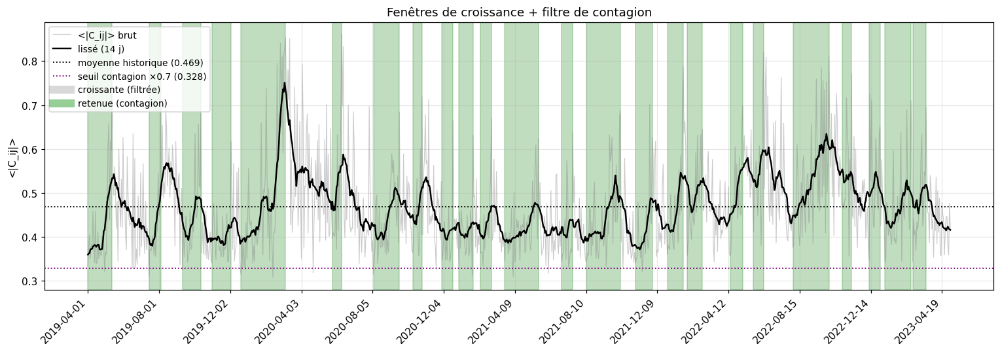

In [3]:
# ╔═══════════════════ HYPERPARAMÈTRES ═══════════════════╗
SMOOTH        = 14    # largeur du lissage (jours ouvrés)
CRISIS_FACTOR = 0.7   # seuil de contagion : garder la fenêtre ssi
#                       <|C_ij|>_fenêtre > CRISIS_FACTOR × moyenne historique
# ╚═══════════════════════════════════════════════════════╝

intervals_raw, mc_smooth = increasing_intervals(
    mc_all, smooth=SMOOTH, min_len=12, merge_gap=3, refine=SMOOTH // 2
)
mean_mc = np.nanmean(mc_all)

# Filtre : conserver uniquement les fenêtres où la corrélation moyenne
# dépasse CRISIS_FACTOR × la moyenne historique
intervals = [(a, b) for a, b in intervals_raw
             if np.nanmean(mc_all[a:b + 1]) > CRISIS_FACTOR * mean_mc]
intervals_chrono = sorted(intervals, key=lambda ab: ab[0])

print(f'{len(intervals_raw)} fenêtre(s) détectée(s), '
      f'{len(intervals_chrono)} retenue(s) (au-dessus du seuil) :')
for rank, (a, b) in enumerate(intervals_chrono):
    print(f'  [{rank}] {all_days[a]} → {all_days[b]}  ({b - a + 1} j, '
          f'<|C|> = {np.nanmean(mc_all[a:b+1]):.3f})')

fig, ax = plt.subplots(figsize=(14, 5))
ax.plot(mc_all, color='gray', alpha=0.4, linewidth=0.8, label='<|C_ij|> brut')
ax.plot(mc_smooth, color='black', linewidth=1.6, label=f'lissé ({SMOOTH} j)')
ax.axhline(mean_mc, color='black', linestyle=':', linewidth=1.2,
           label=f'moyenne historique ({mean_mc:.3f})')
ax.axhline(CRISIS_FACTOR * mean_mc, color='purple', linestyle=':', linewidth=1.2,
           label=f'seuil contagion ×{CRISIS_FACTOR} ({CRISIS_FACTOR * mean_mc:.3f})')
for a, b in intervals_raw:
    ax.axvspan(a, b, color='gray', alpha=0.10)
for a, b in intervals:
    ax.axvspan(a, b, color='#2ca02c', alpha=0.25)
ax.plot([], [], color='gray', alpha=0.3, linewidth=8, label='croissante (filtrée)')
ax.plot([], [], color='#2ca02c', alpha=0.5, linewidth=8, label='retenue (contagion)')
n_show = max(1, len(all_days) // 12)
ax.set_xticks(np.arange(len(all_days))[::n_show])
ax.set_xticklabels([str(all_days[k]) for k in range(0, len(all_days), n_show)],
                   rotation=45, ha='right')
ax.set_ylabel('<|C_ij|>')
ax.set_title('Fenêtres de croissance + filtre de contagion')
ax.legend(fontsize=9, loc='upper left')
ax.grid(alpha=0.3)
plt.tight_layout()
plt.show()

Plus longue crise : 2019-12-19 → 2020-03-09
  durée = 54 jours ouvrés | <|C_ij|> = 0.492 (moyenne hist. 0.469) | amplitude lissée = +0.344


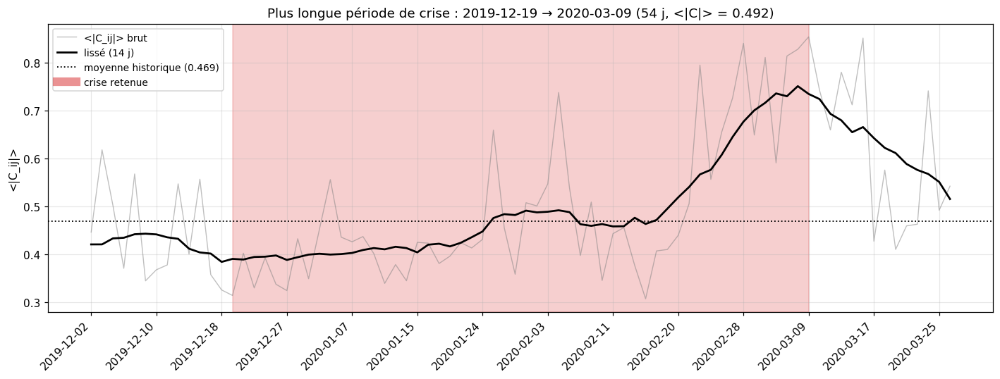

In [4]:
# ── Plus grande et longue période de crise ────────────────────────────────────
# Sélection de la fenêtre retenue de plus grande durée (en jours ouvrés).
pa, pb = max(intervals, key=lambda ab: ab[1] - ab[0])
dur     = pb - pa + 1
mc_win  = np.nanmean(mc_all[pa:pb + 1])
amp     = mc_smooth[pb] - mc_smooth[pa]

print(f'Plus longue crise : {all_days[pa]} → {all_days[pb]}')
print(f'  durée = {dur} jours ouvrés | <|C_ij|> = {mc_win:.3f} '
      f'(moyenne hist. {mean_mc:.3f}) | amplitude lissée = {amp:+.3f}')

# Zoom sur la fenêtre (± marge) avec la crise surlignée
margin = max(10, dur // 4)
lo, hi = max(0, pa - margin), min(len(all_days) - 1, pb + margin)
xs = np.arange(lo, hi + 1)

fig, ax = plt.subplots(figsize=(13, 5))
ax.plot(xs, mc_all[lo:hi + 1], color='gray', alpha=0.5, linewidth=0.9,
        label='<|C_ij|> brut')
ax.plot(xs, mc_smooth[lo:hi + 1], color='black', linewidth=1.8,
        label=f'lissé ({SMOOTH} j)')
ax.axhline(mean_mc, color='black', linestyle=':', linewidth=1.2,
           label=f'moyenne historique ({mean_mc:.3f})')
ax.axvspan(pa, pb, color='#d62728', alpha=0.22)
ax.plot([], [], color='#d62728', alpha=0.5, linewidth=8, label='crise retenue')
n_show = max(1, len(xs) // 12)
ax.set_xticks(xs[::n_show])
ax.set_xticklabels([str(all_days[k]) for k in xs[::n_show]],
                   rotation=45, ha='right')
ax.set_ylabel('<|C_ij|>')
ax.set_title(f'Plus longue période de crise : {all_days[pa]} → {all_days[pb]} '
             f'({dur} j, <|C|> = {mc_win:.3f})')
ax.legend(fontsize=9, loc='upper left')
ax.grid(alpha=0.3)
plt.tight_layout()
plt.show()


/home/farmachidi/miniconda3/envs/ai-env/lib/python3.10/site-packages/numpy/lib/_function_base_impl.py:3045: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
/home/farmachidi/miniconda3/envs/ai-env/lib/python3.10/site-packages/numpy/lib/_function_base_impl.py:3046: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
/home/farmachidi/miniconda3/envs/ai-env/lib/python3.10/site-packages/numpy/lib/_function_base_impl.py:3045: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
/home/farmachidi/miniconda3/envs/ai-env/lib/python3.10/site-packages/numpy/lib/_function_base_impl.py:3046: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
/home/farmachidi/miniconda3/envs/ai-env/lib/python3.10/site-packages/numpy/lib/_function_base_impl.py:3045: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
/home/farmachidi/miniconda3/envs/ai-env/lib/python3.10/site-packages/numpy/lib/_funct

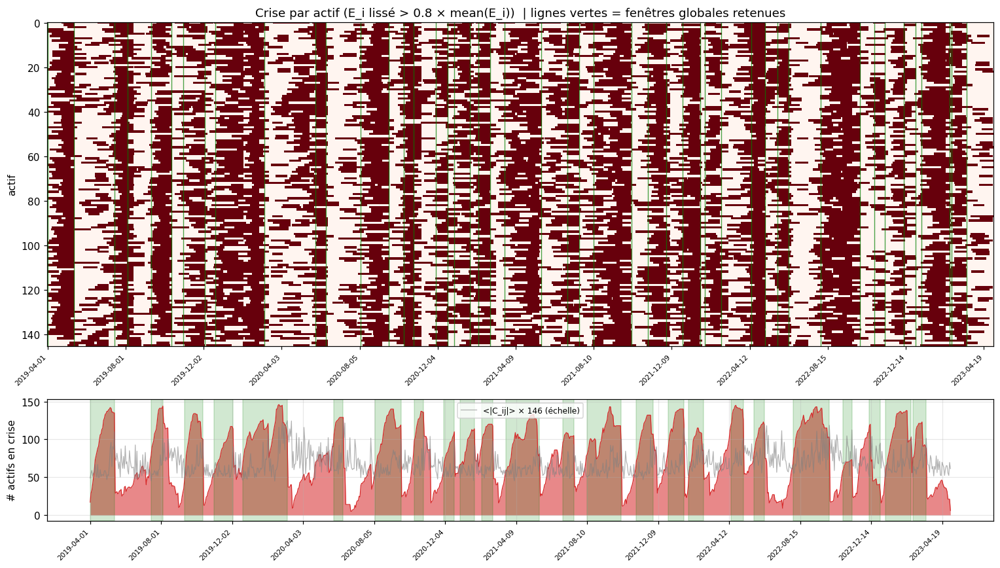

In [5]:
# ── Détection de crise par actif ──────────────────────────────────────────────
ASSET_FACTOR = 0.8   # crise pour actif i si E_i_lissé > ASSET_FACTOR × mean(E_i)
SMOOTH = 14
# Calcul de E_i(t) journalier pour tous les actifs
data_tmp = data.copy()
data_tmp['day'] = data_tmp.index.date
E_daily_all = np.full((N, len(all_days)), np.nan)
for k, d in enumerate(all_days):
    chunk = data_tmp[data_tmp['day'] == d].drop(columns=['day']).values
    if len(chunk) < 3:
        continue
    C_abs = np.abs(np.nan_to_num(np.corrcoef(chunk.T), nan=0.0))
    np.fill_diagonal(C_abs, 0)
    E_daily_all[:, k] = C_abs.sum(axis=1) / (N - 1)

# Détection par actif
crisis_map = np.zeros((N, len(all_days)), dtype=bool)
for i in range(N):
    y_i   = E_daily_all[i]
    thr_i = ASSET_FACTOR * np.nanmean(y_i)
    ivs, _ = increasing_intervals(y_i, smooth=SMOOTH, min_len=12,
                                  merge_gap=3, refine=SMOOTH // 2)
    for a, b in ivs:
        if np.nanmean(y_i[a:b + 1]) > thr_i:
            crisis_map[i, a:b + 1] = True

# ── Heatmap actif × temps ─────────────────────────────────────────────────────
n_show = max(1, len(all_days) // 12)
xticks      = np.arange(len(all_days))[::n_show]
xticklabels = [str(all_days[k]) for k in range(0, len(all_days), n_show)]

fig, axes = plt.subplots(2, 1, figsize=(14, 8),
                         gridspec_kw={'height_ratios': [4, 1.5]})

ax = axes[0]
ax.imshow(crisis_map, aspect='auto', cmap='Reds', interpolation='none',
          vmin=0, vmax=1)
for a, b in intervals_chrono:
    ax.axvline(a, color='green', linewidth=0.9, alpha=0.7)
    ax.axvline(b, color='green', linewidth=0.9, alpha=0.7)
ax.set_xticks(xticks)
ax.set_xticklabels(xticklabels, rotation=45, ha='right', fontsize=7)
if N <= 60:
    ax.set_yticks(range(N))
    ax.set_yticklabels(asset_names, fontsize=5)
ax.set_ylabel('actif')
ax.set_title(f'Crise par actif (E_i lissé > {ASSET_FACTOR} × mean(E_i))  '
             f'| lignes vertes = fenêtres globales retenues')

ax2 = axes[1]
n_crisis = crisis_map.sum(axis=0)
ax2.fill_between(np.arange(len(all_days)), n_crisis,
                 color='#d62728', alpha=0.55, linewidth=0)
ax2.plot(n_crisis, color='#d62728', linewidth=0.8)
for a, b in intervals_chrono:
    ax2.axvspan(a, b, color='green', alpha=0.18)
ax2.plot(mc_all * N, color='gray', linewidth=0.8, alpha=0.6,
         label=f'<|C_ij|> × {N} (échelle)')
ax2.set_xticks(xticks)
ax2.set_xticklabels(xticklabels, rotation=45, ha='right', fontsize=7)
ax2.set_ylabel('# actifs en crise')
ax2.legend(fontsize=8)
ax2.grid(alpha=0.3)

plt.tight_layout()
plt.show()

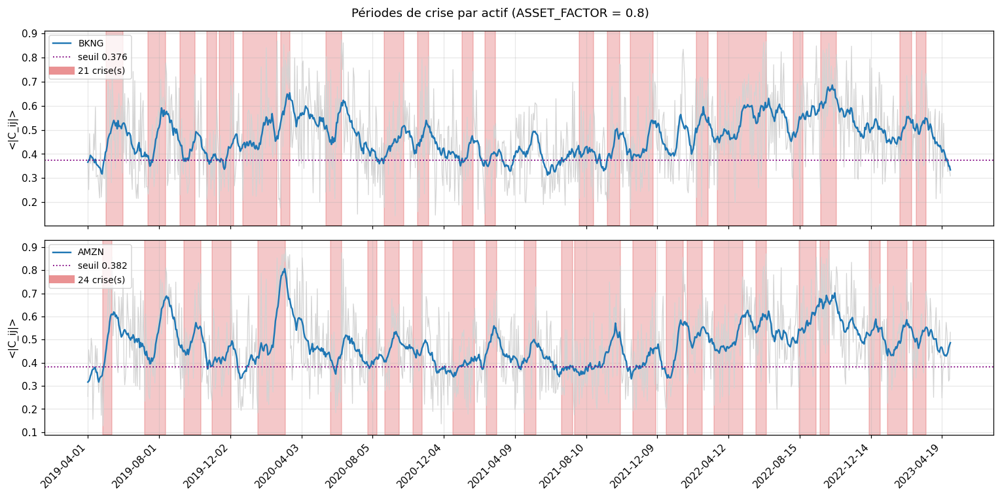

In [6]:
# ── Périodes de crise pour deux actifs ────────────────────────────────────────
ASSET_A = 2   # index global (0..N-1)
ASSET_B = 1

fig, axes = plt.subplots(2, 1, figsize=(14, 7), sharex=True)

for ax, idx in zip(axes, [ASSET_A, ASSET_B]):
    y_i   = E_daily_all[idx]
    thr_i = ASSET_FACTOR * np.nanmean(y_i)
    ys_i  = uniform_filter1d(y_i, size=SMOOTH, mode='nearest')
    ivs_i, _ = increasing_intervals(y_i, smooth=SMOOTH, min_len=12,
                                    merge_gap=3, refine=SMOOTH // 2)
    crisis_i = [(a, b) for a, b in ivs_i if np.nanmean(y_i[a:b+1]) > thr_i]

    ax.plot(y_i,  color='lightgray', linewidth=0.8)
    ax.plot(ys_i, color='#1f77b4',   linewidth=1.6, label=asset_names[idx])
    ax.axhline(thr_i, color='purple', linestyle=':', linewidth=1.2,
               label=f'seuil {thr_i:.3f}')
    for a, b in crisis_i:
        ax.axvspan(a, b, color='#d62728', alpha=0.25)
    ax.plot([], [], color='#d62728', alpha=0.5, linewidth=8,
            label=f'{len(crisis_i)} crise(s)')
    ax.set_ylabel('<|C_ij|>')
    ax.legend(fontsize=9, loc='upper left')
    ax.grid(alpha=0.3)

n_show = max(1, len(all_days) // 12)
axes[1].set_xticks(np.arange(len(all_days))[::n_show])
axes[1].set_xticklabels([str(all_days[k]) for k in range(0, len(all_days), n_show)],
                        rotation=45, ha='right')
plt.suptitle(f'Périodes de crise par actif (ASSET_FACTOR = {ASSET_FACTOR})', fontsize=12)
plt.tight_layout()
plt.show()

AMZN : 24 crise(s), modèle PMFG


/home/farmachidi/miniconda3/envs/ai-env/lib/python3.10/site-packages/numpy/lib/_function_base_impl.py:3045: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
/home/farmachidi/miniconda3/envs/ai-env/lib/python3.10/site-packages/numpy/lib/_function_base_impl.py:3046: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
/home/farmachidi/miniconda3/envs/ai-env/lib/python3.10/site-packages/numpy/lib/_function_base_impl.py:3045: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
/home/farmachidi/miniconda3/envs/ai-env/lib/python3.10/site-packages/numpy/lib/_function_base_impl.py:3046: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
/home/farmachidi/miniconda3/envs/ai-env/lib/python3.10/site-packages/numpy/lib/_function_base_impl.py:3045: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
/home/farmachidi/miniconda3/envs/ai-env/lib/python3.10/site-packages/numpy/lib/_funct

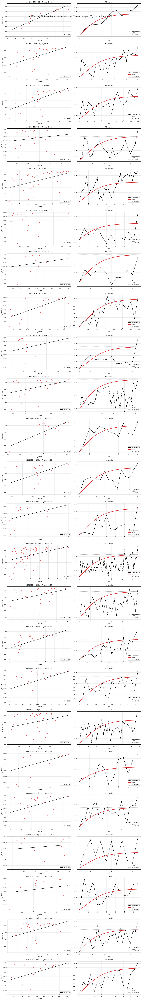

In [7]:
# ── AMZN seul : scatter E vs x + courbe E/x vs t, sur chacune de ses crises ───
# SIS intégré sur le RÉSEAU COMPLET (A fixe N×N) → x* d'AMZN identique partout.
# ╔═══════════════════ HYPERPARAMÈTRES ═══════════════════╗
REF1       = asset_names.index('AMZN')   # actif
SIS_MODEL1 = 'PMFG'                       # clé de A_sis
# ╚═══════════════════════════════════════════════════════╝

# Périodes de crise de l'actif (runs dans crisis_map)
ref_row1 = crisis_map[REF1]
periods1, s = [], None
for k, v in enumerate(ref_row1):
    if v and s is None:
        s = k
    elif not v and s is not None:
        periods1.append((s, k - 1)); s = None
if s is not None:
    periods1.append((s, len(ref_row1) - 1))
n_per1 = len(periods1)
print(f'{asset_names[REF1]} : {n_per1} crise(s), modèle {SIS_MODEL1}')

A_model1 = A_sis[SIS_MODEL1]   # réseau complet (pas de restriction)
B_fit, R_fit, T_long, tol_eq = 1.0, 1.0, 50.0, 0.01

# Une ligne par crise : scatter (gauche) + courbe temporelle (droite)
fig, axes = plt.subplots(n_per1, 2, figsize=(11, 3.2 * n_per1))
if n_per1 == 1:
    axes = axes[None, :]

for r, (pa, pb) in enumerate(periods1):
    days_p   = list(all_days[pa:pb + 1])
    data_p   = data[np.isin(data.index.date, days_p)].copy()
    data_p['day'] = data_p.index.date
    days_p_s = sorted(data_p['day'].unique())
    n_days_p = len(days_p_s)

    # Corrélations journalières de TOUS les actifs (CI pour le réseau complet)
    E_emp_full = np.full((N, n_days_p), np.nan)
    for k, d in enumerate(days_p_s):
        chunk = data_p[data_p['day'] == d].drop(columns=['day']).values
        if len(chunk) < 3:
            continue
        C_abs = np.abs(np.nan_to_num(np.corrcoef(chunk.T), nan=0.0))
        np.fill_diagonal(C_abs, 0)
        E_emp_full[:, k] = C_abs.sum(axis=1) / (N - 1)

    mc_full = np.nanmean(E_emp_full, axis=0)
    k0      = np.where(~np.isnan(mc_full))[0][0]
    x0      = E_emp_full[:, k0]                 # CI sur tous les actifs

    # SIS sur le réseau complet ; T_conv calé sur AMZN
    sol_eq = solve_ivp(ode_sis, (0, T_long), x0, args=(A_model1, B_fit, R_fit),
                       method='LSODA', rtol=1e-6, atol=1e-9)
    x_eq_ref = sol_eq.y[REF1, -1]
    t_probe = np.linspace(1e-3, T_long, 5000)
    sol_probe = solve_ivp(ode_sis, (0, T_long), x0, args=(A_model1, B_fit, R_fit),
                          t_eval=t_probe, method='LSODA', rtol=1e-6, atol=1e-9)
    above  = np.where(sol_probe.y[REF1] >= (1 - tol_eq) * x_eq_ref)[0]
    T_conv = float(t_probe[above[0]]) if len(above) else T_long
    sol_p  = solve_ivp(ode_sis, (0, T_conv), x0, args=(A_model1, B_fit, R_fit),
                       t_eval=np.linspace(0, T_conv, n_days_p), method='LSODA')
    x_traj = np.clip(sol_p.y, 1e-8, 1 - 1e-8)

    E_ref = E_emp_full[REF1]    # E_i de AMZN
    x_ref = x_traj[REF1]        # x_i de AMZN
    ok    = ~np.isnan(E_ref)
    days_axis = np.arange(n_days_p)

    # Gauche : scatter E vs x pour AMZN
    ax = axes[r, 0]
    ax.scatter(E_ref[ok], x_ref[ok], s=25, color='#d62728', alpha=0.8, edgecolors='none')
    if ok.sum() > 2:
        fit = linregress(E_ref[ok], x_ref[ok])
        xs  = np.linspace(E_ref[ok].min(), E_ref[ok].max(), 100)
        ax.plot(xs, fit.slope * xs + fit.intercept, color='black', linewidth=1.2,
                label=f'R² = {fit.rvalue**2:.2f}')
        ax.legend(fontsize=7, loc='lower right')
    ax.set_title(f'#{r} {all_days[pa].strftime("%Y-%m-%d")} ({n_days_p} j, T_conv={T_conv:.2f})', fontsize=8)
    ax.set_xlabel('E_AMZN', fontsize=7); ax.set_ylabel('x_AMZN SIS', fontsize=7)
    ax.grid(alpha=0.3); ax.tick_params(labelsize=6)

    # Droite : E et x vs t ; x_eq = vrai équilibre d'AMZN (constant ≈ 0.645)
    ax2 = axes[r, 1]
    ax2.plot(days_axis, E_ref, color='black',   linewidth=1.5, linestyle='--',
             marker='o', markersize=3, label='E empirique')
    ax2.plot(days_axis, x_ref, color='#d62728', linewidth=2, label='x SIS')
    ax2.axhline(x_eq_ref, color='gray', linestyle=':', linewidth=1,
                label=f'x* = {x_eq_ref:.3f}')
    ax2.set_title(f'#{r} courbe', fontsize=8)
    ax2.set_xlabel('jour', fontsize=7); ax2.grid(alpha=0.3); ax2.tick_params(labelsize=6)
    ax2.legend(fontsize=7, loc='lower right')

plt.suptitle(f'{asset_names[REF1]} ({SIS_MODEL1}) — scatter + courbe par crise '
             f'(réseau complet, T_conv calé sur AMZN)', fontsize=11)
plt.tight_layout()
plt.show()

AMZN : 24 période(s) de crise, modèle PMFG


/home/farmachidi/miniconda3/envs/ai-env/lib/python3.10/site-packages/numpy/lib/_function_base_impl.py:3045: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
/home/farmachidi/miniconda3/envs/ai-env/lib/python3.10/site-packages/numpy/lib/_function_base_impl.py:3046: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
/home/farmachidi/miniconda3/envs/ai-env/lib/python3.10/site-packages/numpy/lib/_function_base_impl.py:3045: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
/home/farmachidi/miniconda3/envs/ai-env/lib/python3.10/site-packages/numpy/lib/_function_base_impl.py:3046: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
/home/farmachidi/miniconda3/envs/ai-env/lib/python3.10/site-packages/numpy/lib/_function_base_impl.py:3045: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
/home/farmachidi/miniconda3/envs/ai-env/lib/python3.10/site-packages/numpy/lib/_funct

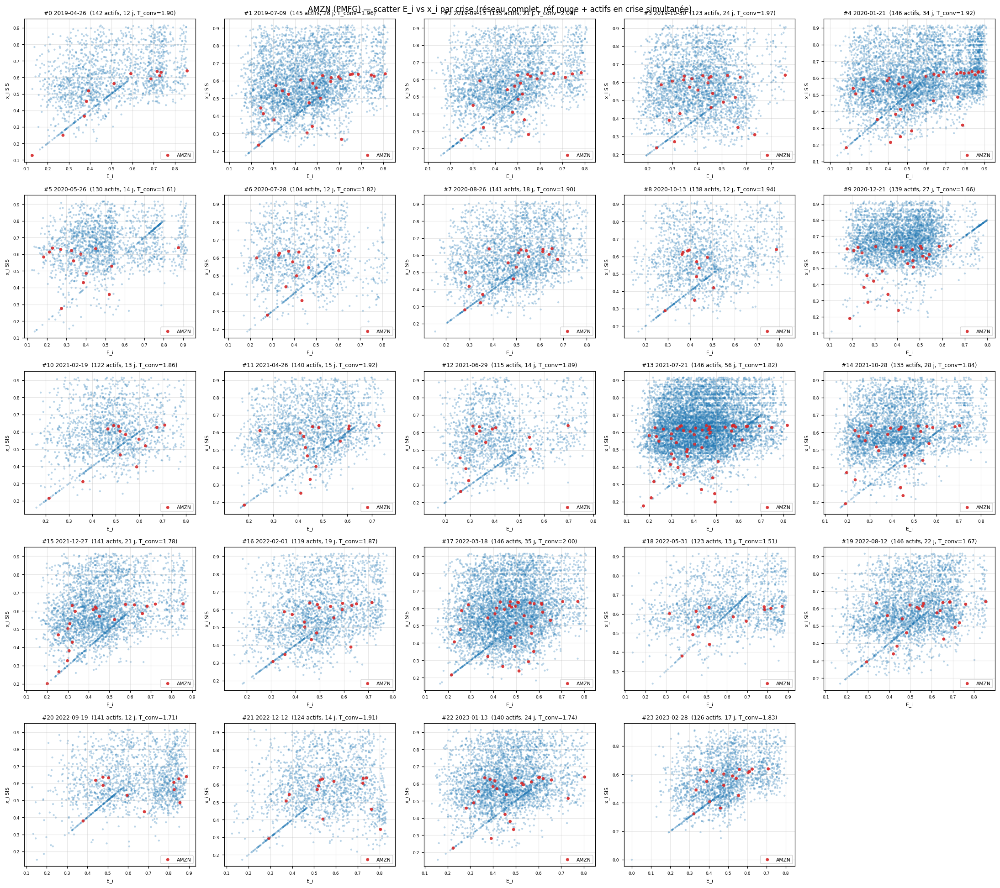

In [8]:
# ── Actif de référence : pour chacune de SES crises, scatter avec les actifs ──
#    en crise au même moment. SIS sur le RÉSEAU COMPLET (A fixe) → x* constant.
# ╔═══════════════════ HYPERPARAMÈTRES ═══════════════════╗
REF_ASSET = asset_names.index('AMZN')   # actif de référence
SIS_MODEL = 'PMFG'                       # clé de A_sis
# ╚═══════════════════════════════════════════════════════╝

# Périodes de crise de l'actif de référence (runs dans crisis_map)
ref_row = crisis_map[REF_ASSET]
ref_periods, s = [], None
for k, v in enumerate(ref_row):
    if v and s is None:
        s = k
    elif not v and s is not None:
        ref_periods.append((s, k - 1))
        s = None
if s is not None:
    ref_periods.append((s, len(ref_row) - 1))

n_per = len(ref_periods)
print(f'{asset_names[REF_ASSET]} : {n_per} période(s) de crise, modèle {SIS_MODEL}')

A_model = A_sis[SIS_MODEL]   # réseau complet (pas de restriction)
B_fit, R_fit, T_long, tol_eq = 1.0, 1.0, 50.0, 0.01

ncols   = min(5, n_per)
nrows_s = int(np.ceil(n_per / ncols))
fig, axes = plt.subplots(nrows_s, ncols, figsize=(4 * ncols, 3.6 * nrows_s))
axes = np.array(axes).flatten()

for r, (pa, pb) in enumerate(ref_periods):
    days_p   = list(all_days[pa:pb + 1])
    data_p   = data[np.isin(data.index.date, days_p)].copy()
    data_p['day'] = data_p.index.date
    days_p_s = sorted(data_p['day'].unique())
    n_days_p = len(days_p_s)

    # Actifs en crise pendant cette période (pour la sélection des points affichés)
    keep_p  = np.where(crisis_map[:, pa:pb + 1].any(axis=1))[0]
    if REF_ASSET not in keep_p:
        keep_p = np.append(keep_p, REF_ASSET)

    # Corrélations journalières de TOUS les actifs
    E_emp_full = np.full((N, n_days_p), np.nan)
    for k, d in enumerate(days_p_s):
        chunk = data_p[data_p['day'] == d].drop(columns=['day']).values
        if len(chunk) < 3:
            continue
        C_abs = np.abs(np.nan_to_num(np.corrcoef(chunk.T), nan=0.0))
        np.fill_diagonal(C_abs, 0)
        E_emp_full[:, k] = C_abs.sum(axis=1) / (N - 1)

    mc_full = np.nanmean(E_emp_full, axis=0)
    k0      = np.where(~np.isnan(mc_full))[0][0]
    x0      = E_emp_full[:, k0]

    # SIS réseau complet ; T_conv calé sur l'actif de référence
    sol_eq = solve_ivp(ode_sis, (0, T_long), x0, args=(A_model, B_fit, R_fit),
                       method='LSODA', rtol=1e-6, atol=1e-9)
    x_eq_ref = sol_eq.y[REF_ASSET, -1]
    t_probe = np.linspace(1e-3, T_long, 5000)
    sol_probe = solve_ivp(ode_sis, (0, T_long), x0, args=(A_model, B_fit, R_fit),
                          t_eval=t_probe, method='LSODA', rtol=1e-6, atol=1e-9)
    above  = np.where(sol_probe.y[REF_ASSET] >= (1 - tol_eq) * x_eq_ref)[0]
    T_conv = float(t_probe[above[0]]) if len(above) else T_long
    sol_p  = solve_ivp(ode_sis, (0, T_conv), x0, args=(A_model, B_fit, R_fit),
                       t_eval=np.linspace(0, T_conv, n_days_p), method='LSODA')
    x_traj = np.clip(sol_p.y, 1e-8, 1 - 1e-8)

    # Scatter : (E_i(t), x_i(t)) pour les actifs co-occurrents (indices globaux)
    others = keep_p[keep_p != REF_ASSET]
    ax = axes[r]
    xo = E_emp_full[others].ravel()
    yo = x_traj[others].ravel()
    ok = ~np.isnan(xo)
    ax.scatter(xo[ok], yo[ok], s=8, color='#1f77b4', alpha=0.3, edgecolors='none')
    # Réf en évidence
    okr = ~np.isnan(E_emp_full[REF_ASSET])
    ax.scatter(E_emp_full[REF_ASSET, okr], x_traj[REF_ASSET, okr], s=20, color='#d62728',
               alpha=0.9, edgecolors='none', label=asset_names[REF_ASSET])
    ax.set_title(f'#{r} {all_days[pa].strftime("%Y-%m-%d")}  '
                 f'({len(keep_p)} actifs, {n_days_p} j, T_conv={T_conv:.2f})', fontsize=8)
    ax.set_xlabel('E_i', fontsize=7); ax.set_ylabel('x_i SIS', fontsize=7)
    ax.grid(alpha=0.3); ax.tick_params(labelsize=6)
    ax.legend(fontsize=7, loc='lower right')

for ax in axes[n_per:]:
    ax.set_visible(False)

plt.suptitle(f'{asset_names[REF_ASSET]} ({SIS_MODEL}) — scatter E_i vs x_i par crise '
             f'(réseau complet, réf rouge + actifs en crise simultanée)', fontsize=11)
plt.tight_layout()
plt.show()

AAPL : moyenne sur 23 crises, x* ≈ 0.770


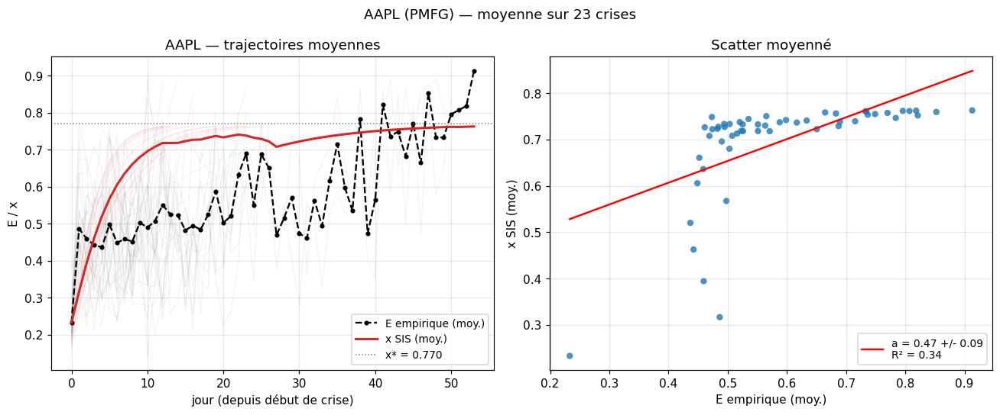

In [9]:
# ── Moyenne d'un actif sur TOUTES ses périodes de crise ──────────────────────
# Trajectoires E et x (réseau complet, T_conv calé sur l'actif) alignées au
# 1er jour de chaque crise, puis moyennées.
# ╔═══════════════════ HYPERPARAMÈTRES ═══════════════════╗
REF_AVG    = asset_names.index('AAPL')   # actif
SIS_MODEL_A = 'PMFG'                       # clé de A_sis
# ╚═══════════════════════════════════════════════════════╝

# Périodes de crise de l'actif
ref_row_a = crisis_map[REF_AVG]
periods_a, s = [], None
for k, v in enumerate(ref_row_a):
    if v and s is None:
        s = k
    elif not v and s is not None:
        periods_a.append((s, k - 1)); s = None
if s is not None:
    periods_a.append((s, len(ref_row_a) - 1))

A_avg = A_sis[SIS_MODEL_A]
B_fit, R_fit, T_long, tol_eq = 1.0, 1.0, 50.0, 0.01
max_len = max(pb - pa + 1 for pa, pb in periods_a)

E_stack = np.full((len(periods_a), max_len), np.nan)
X_stack = np.full((len(periods_a), max_len), np.nan)
x_eq_list = []

for r, (pa, pb) in enumerate(periods_a):
    days_p   = list(all_days[pa:pb + 1])
    data_p   = data[np.isin(data.index.date, days_p)].copy()
    data_p['day'] = data_p.index.date
    days_p_s = sorted(data_p['day'].unique())
    n_days_p = len(days_p_s)

    E_emp_full = np.full((N, n_days_p), np.nan)
    for k, d in enumerate(days_p_s):
        chunk = data_p[data_p['day'] == d].drop(columns=['day']).values
        if len(chunk) < 3:
            continue
        C_abs = np.abs(np.nan_to_num(np.corrcoef(chunk.T), nan=0.0))
        np.fill_diagonal(C_abs, 0)
        E_emp_full[:, k] = C_abs.sum(axis=1) / (N - 1)

    mc_full = np.nanmean(E_emp_full, axis=0)
    k0      = np.where(~np.isnan(mc_full))[0][0]
    x0      = E_emp_full[:, k0]

    sol_eq = solve_ivp(ode_sis, (0, T_long), x0, args=(A_avg, B_fit, R_fit),
                       method='LSODA', rtol=1e-6, atol=1e-9)
    x_eq_ref = sol_eq.y[REF_AVG, -1]
    t_probe = np.linspace(1e-3, T_long, 5000)
    sol_probe = solve_ivp(ode_sis, (0, T_long), x0, args=(A_avg, B_fit, R_fit),
                          t_eval=t_probe, method='LSODA', rtol=1e-6, atol=1e-9)
    above  = np.where(sol_probe.y[REF_AVG] >= (1 - tol_eq) * x_eq_ref)[0]
    T_conv = float(t_probe[above[0]]) if len(above) else T_long
    sol_p  = solve_ivp(ode_sis, (0, T_conv), x0, args=(A_avg, B_fit, R_fit),
                       t_eval=np.linspace(0, T_conv, n_days_p), method='LSODA')
    x_traj = np.clip(sol_p.y, 1e-8, 1 - 1e-8)

    E_stack[r, :n_days_p] = E_emp_full[REF_AVG]
    X_stack[r, :n_days_p] = x_traj[REF_AVG]
    x_eq_list.append(x_eq_ref)

E_mean = np.nanmean(E_stack, axis=0)
E_sem  = np.nanstd(E_stack, axis=0) / np.sqrt(np.sum(~np.isnan(E_stack), axis=0))
X_mean = np.nanmean(X_stack, axis=0)
X_sem  = np.nanstd(X_stack, axis=0) / np.sqrt(np.sum(~np.isnan(X_stack), axis=0))
x_eq_avg = np.mean(x_eq_list)
days_axis = np.arange(max_len)

print(f'{asset_names[REF_AVG]} : moyenne sur {len(periods_a)} crises, x* ≈ {x_eq_avg:.3f}')

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 5))

# Gauche : toutes les courbes individuelles (alpha très faible) + moyennes
for r in range(len(periods_a)):
    ax1.plot(days_axis, E_stack[r], color='black',   linewidth=0.8, alpha=0.05)
    ax1.plot(days_axis, X_stack[r], color='#d62728', linewidth=0.8, alpha=0.05)
ax1.plot(days_axis, E_mean, color='black', linestyle='--', marker='o', markersize=3,
         label='E empirique (moy.)')
ax1.plot(days_axis, X_mean, color='#d62728', linewidth=2, label='x SIS (moy.)')
ax1.axhline(x_eq_avg, color='gray', linestyle=':', linewidth=1, label=f'x* = {x_eq_avg:.3f}')
ax1.set_xlabel('jour (depuis début de crise)')
ax1.set_ylabel('E / x')
ax1.set_title(f'{asset_names[REF_AVG]} — trajectoires moyennes')
ax1.grid(alpha=0.3); ax1.legend(fontsize=9)

# Droite : scatter E_moyen vs x_moyen
ok = ~np.isnan(E_mean) & ~np.isnan(X_mean)
ax2.scatter(E_mean[ok], X_mean[ok], s=30, color='#1f77b4', alpha=0.8, edgecolors='none')
fit = linregress(E_mean[ok], X_mean[ok])
xs = np.linspace(E_mean[ok].min(), E_mean[ok].max(), 100)
ax2.plot(xs, fit.slope * xs + fit.intercept, color='red', linewidth=1.6,
         label=f'a = {fit.slope:.2f} +/- {fit.stderr:.2f}\nR² = {fit.rvalue**2:.2f}')
ax2.set_xlabel('E empirique (moy.)'); ax2.set_ylabel('x SIS (moy.)')
ax2.set_title('Scatter moyenné')
ax2.grid(alpha=0.3); ax2.legend(fontsize=9, loc='lower right')

plt.suptitle(f'{asset_names[REF_AVG]} ({SIS_MODEL_A}) — moyenne sur {len(periods_a)} crises',
             fontsize=12)
plt.tight_layout()
plt.show()

Plus longue crise globale : 2019-12-19 → 2020-03-09 (54 j) | 146 actifs en crise, 6 affichés


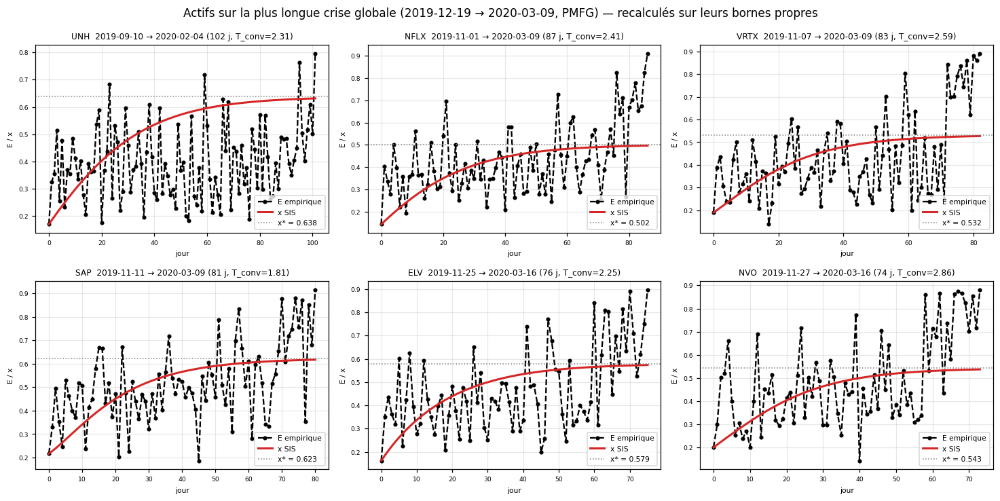

In [10]:
# ── Quelques actifs sur la plus longue crise globale (bornes propres) ──────────
# Reprend la plus longue fenêtre globale retenue, mais chaque actif est recalculé
# sur SES propres bornes de crise (run de crisis_map chevauchant la fenêtre).
# SIS sur le réseau complet, T_conv calé sur chaque actif.
SIS_MODEL_F = 'PMFG'                 # clé de A_sis
N_SHOW      = 6                      # nb d'actifs affichés
A_model_f   = A_sis[SIS_MODEL_F]
B_fit, R_fit, T_long, tol_eq = 1.0, 1.0, 50.0, 0.01

# Plus longue fenêtre globale retenue
pa_big, pb_big = max(intervals, key=lambda ab: ab[1] - ab[0])

def asset_runs(row):
    runs, s = [], None
    for k, v in enumerate(row):
        if v and s is None:
            s = k
        elif not v and s is not None:
            runs.append((s, k - 1)); s = None
    if s is not None:
        runs.append((s, len(row) - 1))
    return runs

# Pour chaque actif en crise sur la fenêtre : sa borne propre (run chevauchant)
asset_windows = {}
for gi in range(N):
    for a, b in asset_runs(crisis_map[gi]):
        if b >= pa_big and a <= pb_big:      # le run chevauche la fenêtre globale
            asset_windows[gi] = (a, b)
            break

# On garde les actifs dont la crise propre est la plus longue
chosen = sorted(asset_windows, key=lambda g: asset_windows[g][1] - asset_windows[g][0],
                reverse=True)[:N_SHOW]
print(f'Plus longue crise globale : {all_days[pa_big]} → {all_days[pb_big]} '
      f'({pb_big - pa_big + 1} j) | {len(asset_windows)} actifs en crise, '
      f'{len(chosen)} affichés')

ncols   = min(3, len(chosen))
nrows_f = int(np.ceil(len(chosen) / ncols))
fig, axes = plt.subplots(nrows_f, ncols, figsize=(4.5 * ncols, 3.4 * nrows_f),
                         squeeze=False)
axes = axes.flatten()

for r, gi in enumerate(chosen):
    a_i, b_i = asset_windows[gi]             # bornes propres à l'actif
    days_p   = list(all_days[a_i:b_i + 1])
    data_p   = data[np.isin(data.index.date, days_p)].copy()
    data_p['day'] = data_p.index.date
    days_p_s = sorted(data_p['day'].unique())
    n_days_p = len(days_p_s)

    E_emp_full = np.full((N, n_days_p), np.nan)
    for k, d in enumerate(days_p_s):
        chunk = data_p[data_p['day'] == d].drop(columns=['day']).values
        if len(chunk) < 3:
            continue
        C_abs = np.abs(np.nan_to_num(np.corrcoef(chunk.T), nan=0.0))
        np.fill_diagonal(C_abs, 0)
        E_emp_full[:, k] = C_abs.sum(axis=1) / (N - 1)

    mc_full = np.nanmean(E_emp_full, axis=0)
    k0      = np.where(~np.isnan(mc_full))[0][0]
    x0      = E_emp_full[:, k0]

    # SIS réseau complet ; T_conv calé sur l'actif
    sol_eq = solve_ivp(ode_sis, (0, T_long), x0, args=(A_model_f, B_fit, R_fit),
                       method='LSODA', rtol=1e-6, atol=1e-9)
    x_eq_ref = sol_eq.y[gi, -1]
    t_probe = np.linspace(1e-3, T_long, 5000)
    sol_probe = solve_ivp(ode_sis, (0, T_long), x0, args=(A_model_f, B_fit, R_fit),
                          t_eval=t_probe, method='LSODA', rtol=1e-6, atol=1e-9)
    above  = np.where(sol_probe.y[gi] >= (1 - tol_eq) * x_eq_ref)[0]
    T_conv = float(t_probe[above[0]]) if len(above) else T_long
    sol_p  = solve_ivp(ode_sis, (0, T_conv), x0, args=(A_model_f, B_fit, R_fit),
                       t_eval=np.linspace(0, T_conv, n_days_p), method='LSODA')
    x_traj = np.clip(sol_p.y, 1e-8, 1 - 1e-8)

    days_axis = np.arange(n_days_p)
    ax = axes[r]
    ax.plot(days_axis, E_emp_full[gi], color='black', linewidth=1.5, linestyle='--',
            marker='o', markersize=3, label='E empirique')
    ax.plot(days_axis, x_traj[gi], color='#d62728', linewidth=2, label='x SIS')
    ax.axhline(x_eq_ref, color='gray', linestyle=':', linewidth=1,
               label=f'x* = {x_eq_ref:.3f}')
    ax.set_title(f'{asset_names[gi]}  {all_days[a_i]} → {all_days[b_i]} '
                 f'({n_days_p} j, T_conv={T_conv:.2f})', fontsize=8)
    ax.set_xlabel('jour', fontsize=7); ax.set_ylabel('E / x', fontsize=7)
    ax.grid(alpha=0.3); ax.tick_params(labelsize=6)
    ax.legend(fontsize=7, loc='lower right')

for ax in axes[len(chosen):]:
    ax.set_visible(False)

plt.suptitle(f'Actifs sur la plus longue crise globale '
             f'({all_days[pa_big]} → {all_days[pb_big]}, {SIS_MODEL_F}) '
             f'— recalculés sur leurs bornes propres', fontsize=11)
plt.tight_layout()
plt.show()


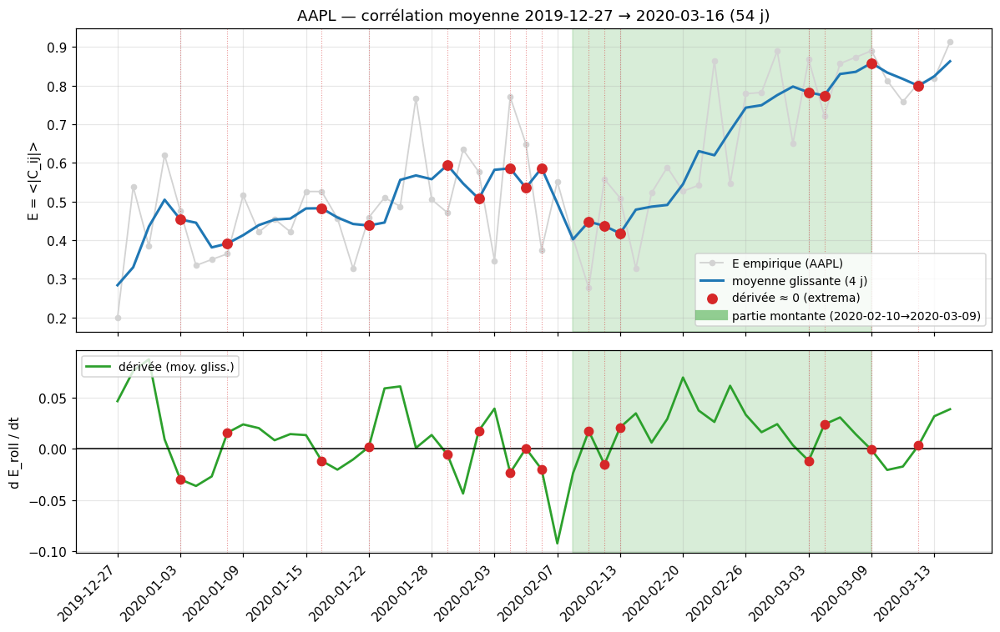

Partie très montante (2e filtre, dérivée 3 j > 0 sur ≥ 80% / 12 j min) :
  2020-02-10 → 2020-03-09  (20 j, 80% jours positifs, gain = +0.448, E_roll2 0.411 → 0.859)


In [11]:
# ── AAPL sur la plus longue crise globale (corrélations seules) ───────────────
gi = asset_names.index('AAPL')
pa_big, pb_big = max(intervals, key=lambda ab: ab[1] - ab[0])

# Bornes propres à AAPL : run de crisis_map chevauchant la fenêtre globale,
# sinon repli sur les bornes de la fenêtre globale.
a_i, b_i = pa_big, pb_big
for a, b in asset_runs(crisis_map[gi]):
    if b >= pa_big and a <= pb_big:
        a_i, b_i = a, b
        break

days_p   = list(all_days[a_i:b_i + 1])
data_p   = data[np.isin(data.index.date, days_p)].copy()
data_p['day'] = data_p.index.date
days_p_s = sorted(data_p['day'].unique())
n_days_p = len(days_p_s)

E_emp_full = np.full((N, n_days_p), np.nan)
for k, d in enumerate(days_p_s):
    chunk = data_p[data_p['day'] == d].drop(columns=['day']).values
    if len(chunk) < 3:
        continue
    C_abs = np.abs(np.nan_to_num(np.corrcoef(chunk.T), nan=0.0))
    np.fill_diagonal(C_abs, 0)
    E_emp_full[:, k] = C_abs.sum(axis=1) / (N - 1)

E_aapl = E_emp_full[gi]
E_roll = uniform_filter1d(E_aapl, size=4, mode='nearest')   # moyenne glissante 4 j

# Dérivée de la moyenne glissante + ses annulations (extrema locaux)
deriv = np.gradient(E_roll)
sign  = np.sign(deriv)
zeros = [k for k in range(1, n_days_p) if sign[k] != sign[k - 1] and sign[k - 1] != 0]

# ── 2e filtre : ne garder que la partie très montante de la fin ───────────────
# Critère : plus longue fenêtre (≥ MIN_LEN j) où la dérivée de la moyenne
# glissante (SMOOTH2 j) est positive au moins POS_FRAC du temps (quasi-monotone).
SMOOTH2, MIN_LEN, POS_FRAC, MIN_GAIN = 3, 12, 0.80, 0.25
E_roll2 = uniform_filter1d(E_aapl, size=SMOOTH2, mode='nearest')
pos     = np.gradient(E_roll2) > 0

best = None   # (longueur, gain, s, e, frac)
for s in range(n_days_p):
    for e in range(s + MIN_LEN - 1, n_days_p):
        frac = pos[s:e + 1].mean()
        if frac >= POS_FRAC:
            cand = (e - s + 1, E_roll2[e] - E_roll2[s], s, e, frac)
            if best is None or (cand[0], cand[1]) > (best[0], best[1]):
                best = cand

days_axis = np.arange(n_days_p)
step = max(1, n_days_p // 12)
fig, (ax, axd) = plt.subplots(2, 1, figsize=(11, 7), sharex=True,
                              gridspec_kw={'height_ratios': [3, 2]})

# Haut : corrélation + moyenne glissante
ax.plot(days_axis, E_aapl, color='lightgray', linewidth=1.2,
        marker='o', markersize=4, label='E empirique (AAPL)')
ax.plot(days_axis, E_roll, color='#1f77b4', linewidth=2,
        label='moyenne glissante (4 j)')
ax.scatter(zeros, E_roll[zeros], color='#d62728', s=55, zorder=5,
           label="dérivée ≈ 0 (extrema)")
for k in zeros:
    ax.axvline(k, color='#d62728', linestyle=':', linewidth=0.7, alpha=0.5)
if best:
    _, gain, s2, e2, frac = best
    ax.axvspan(s2, e2, color='#2ca02c', alpha=0.18)
    ax.plot([], [], color='#2ca02c', alpha=0.5, linewidth=8,
            label=f'partie montante ({days_p_s[s2]}→{days_p_s[e2]})')
ax.set_ylabel('E = <|C_ij|>')
ax.set_title(f'AAPL — corrélation moyenne {all_days[a_i]} → {all_days[b_i]} '
             f'({n_days_p} j)')
ax.legend(fontsize=9, loc='lower right')
ax.grid(alpha=0.3)

# Bas : dérivée
axd.plot(days_axis, deriv, color='#2ca02c', linewidth=1.8, label="dérivée (moy. gliss.)")
axd.axhline(0, color='black', linewidth=1)
axd.scatter(zeros, deriv[zeros], color='#d62728', s=45, zorder=5)
for k in zeros:
    axd.axvline(k, color='#d62728', linestyle=':', linewidth=0.7, alpha=0.5)
if best:
    axd.axvspan(s2, e2, color='#2ca02c', alpha=0.18)
axd.set_xticks(days_axis[::step])
axd.set_xticklabels([str(days_p_s[k]) for k in range(0, n_days_p, step)],
                    rotation=45, ha='right')
axd.set_ylabel("d E_roll / dt")
axd.legend(fontsize=9, loc='upper left')
axd.grid(alpha=0.3)

plt.tight_layout()
plt.show()

if best:
    print(f"Partie très montante (2e filtre, dérivée {SMOOTH2} j > 0 sur "
          f"≥ {POS_FRAC*100:.0f}% / {MIN_LEN} j min) :")
    print(f"  {days_p_s[s2]} → {days_p_s[e2]}  ({e2 - s2 + 1} j, "
          f"{frac*100:.0f}% jours positifs, gain = {gain:+.3f}, "
          f"E_roll2 {E_roll2[s2]:.3f} → {E_roll2[e2]:.3f})")
else:
    print(f"Aucune fenêtre ≥ {MIN_LEN} j avec ≥ {POS_FRAC*100:.0f}% de jours positifs "
          f"(baisser POS_FRAC ou augmenter SMOOTH2).")


## Sous-période de forte montée (2e filtre)

`strong_rise(y)` : lisse la courbe `y` (moyenne glissante de largeur `SMOOTH2`), puis teste **toutes les paires début/fin** possibles et renvoie la **plus longue** sous-fenêtre (≥ `MIN_LEN` jours) dont le gain lissé `y(fin) − y(début) ≥ MIN_GAIN` ; à longueur égale, celle de plus fort gain. Si aucune ne passe le seuil → `None`.

On l'applique à chaque run de crise de l'actif **chevauchant la fenêtre globale**, sur sa courbe `E_i`.

Règles de rejet :
- un run sans montée satisfaisant le seuil (`strong_rise → None`) est **abandonné** ;
- seules les **fenêtres vertes** (sortie de `strong_rise`) sont conservées et stockées dans `green_periods[actif] = [(début, fin), …]` en indices globaux de jours.

Paramètres : `SMOOTH=2` (lissage tracé), `SMOOTH2=2` (lissage du gain dans `strong_rise`), `MIN_LEN=14` j, `MIN_GAIN=0.25`.

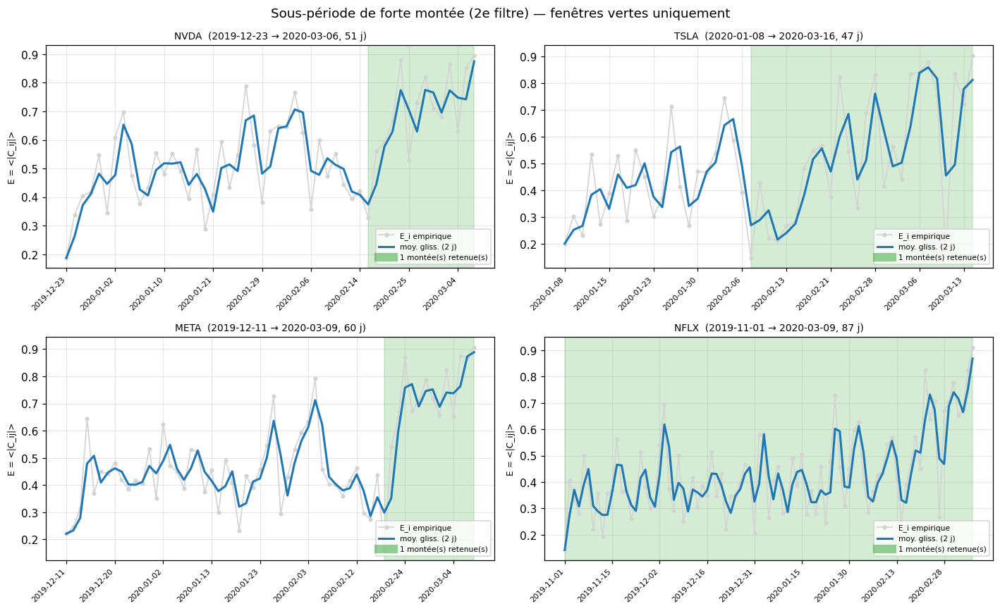

Fenêtres vertes retenues (indices globaux) :
  NVDA: [('2020-02-18', '2020-03-06')]
  TSLA: [('2020-02-07', '2020-03-16')]
  META: [('2020-02-19', '2020-03-09')]
  NFLX: [('2019-11-01', '2020-03-09')]


In [12]:
# ── Sous-période de forte montée (2e filtre) pour 4 actifs ────────────────────
# On ne garde QUE les fenêtres vertes : pour chaque run de crise chevauchant la
# fenêtre globale, on extrait la sous-période de forte montée (strong_rise) et on
# jette le reste. Les runs sans montée retenue sont ignorés.
ASSETS_4 = ['NVDA', 'TSLA', 'META', 'NFLX']
SMOOTH, SMOOTH2, MIN_LEN, MIN_GAIN = 2, 2, 10, 0.5
pa_big, pb_big = max(intervals, key=lambda ab: ab[1] - ab[0])

def strong_rise(y, smooth=SMOOTH2, min_len=MIN_LEN, min_gain=MIN_GAIN):
    """Plus longue fenêtre (>= min_len) dont le gain lissé (fin - début) >= min_gain."""
    ys  = uniform_filter1d(y, size=smooth, mode='nearest')
    best, m = None, len(y)
    for s in range(m):
        for e in range(s + min_len - 1, m):
            gain = ys[e] - ys[s]
            if gain >= min_gain:
                cand = (e - s + 1, gain, s, e)
                if best is None or (cand[0], cand[1]) > (best[0], best[1]):
                    best = cand
    return best   # (longueur, gain, s, e) ou None

# Fenêtres vertes retenues par actif (indices globaux de jours)
green_periods = {}

fig, axes = plt.subplots(2, 2, figsize=(13, 8))
axes = axes.flatten()

for ax, name in zip(axes, ASSETS_4):
    gi = asset_names.index(name)

    # Tous les runs de crise chevauchant la fenêtre globale
    runs = [(a, b) for a, b in asset_runs(crisis_map[gi])
            if b >= pa_big and a <= pb_big]
    if not runs:
        runs = [(pa_big, pb_big)]

    lo = min(a for a, b in runs)
    hi = max(b for a, b in runs)
    dates  = [all_days[k] for k in range(lo, hi + 1)]
    y      = E_daily_all[gi, lo:hi + 1]
    y_roll = uniform_filter1d(y, size=SMOOTH, mode='nearest')
    t      = np.arange(len(y))

    ax.plot(t, y, color='lightgray', linewidth=1.1, marker='o', markersize=3,
            label='E_i empirique')
    ax.plot(t, y_roll, color='#1f77b4', linewidth=2, label=f'moy. gliss. ({SMOOTH} j)')

    # 2e filtre : on ne garde que la sous-période de forte montée de chaque run
    greens = []
    for a, b in runs:
        ra, rb = a - lo, b - lo
        res = strong_rise(y[ra:rb + 1])
        if res is None:
            continue                       # run sans montée retenue -> jeté
        _, _, s2, e2 = res
        g0, g1 = ra + s2, ra + e2          # indices locaux (fenêtre lo..hi)
        ax.axvspan(g0, g1, color='#2ca02c', alpha=0.20)
        greens.append((a + s2, a + e2))   # indices globaux

    green_periods[name] = greens
    ax.plot([], [], color='#2ca02c', alpha=0.5, linewidth=8,
            label=f'{len(greens)} montée(s) retenue(s)')

    step = max(1, len(t) // 8)
    ax.set_xticks(t[::step])
    ax.set_xticklabels([str(dates[k]) for k in range(0, len(t), step)],
                       rotation=45, ha='right', fontsize=7)
    ax.set_title(f'{name}  ({all_days[lo]} → {all_days[hi]}, {len(t)} j)', fontsize=9)
    ax.set_ylabel('E = <|C_ij|>', fontsize=8)
    ax.legend(fontsize=7, loc='lower right')
    ax.grid(alpha=0.3)

plt.suptitle('Sous-période de forte montée (2e filtre) — fenêtres vertes uniquement', fontsize=12)
plt.tight_layout()
plt.show()

print('Fenêtres vertes retenues (indices globaux) :')
for name, gs in green_periods.items():
    pretty = [(str(all_days[a]), str(all_days[b])) for a, b in gs]
    print(f'  {name}: {pretty}')


88 actifs avec sous-courbe croissante.
PMFG : 88 pentes — médiane 0.31, moyenne 0.32 +/- 0.13
NVDA écarté : 1er run de crise sans montée >= MIN_GAIN (0.5).


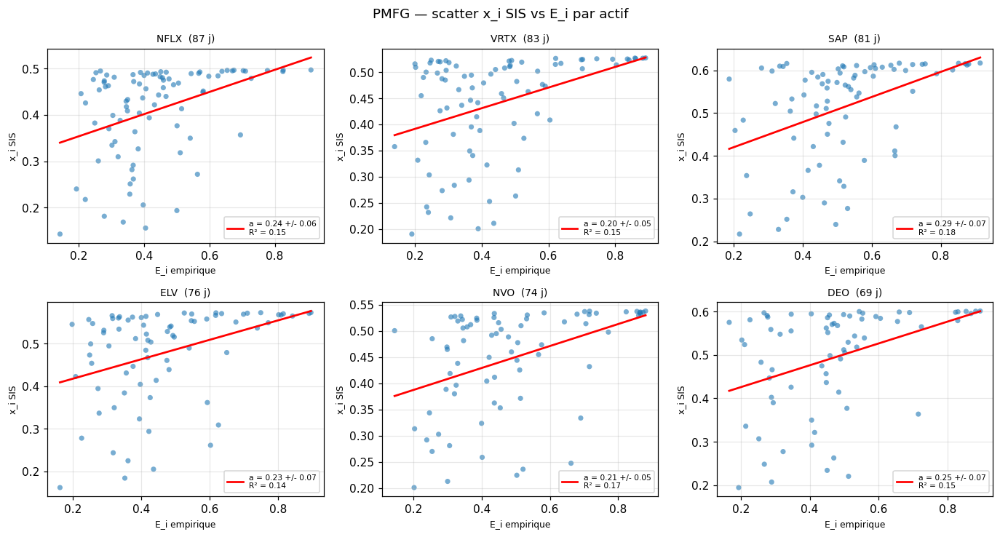

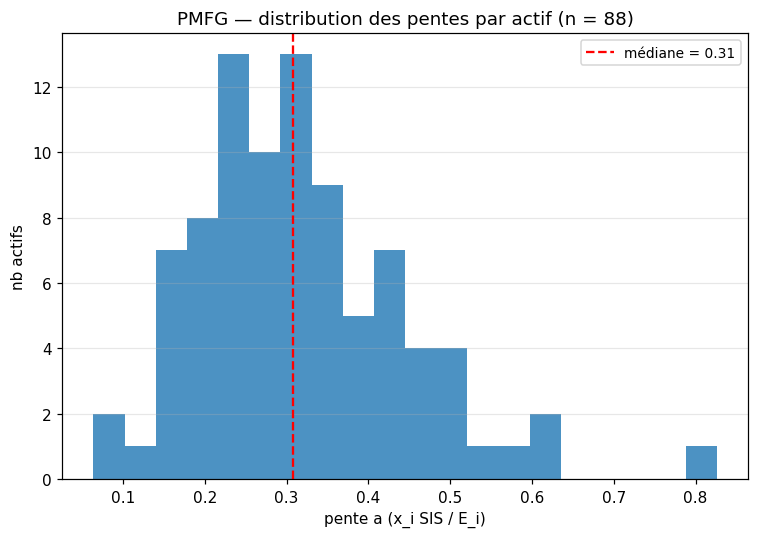

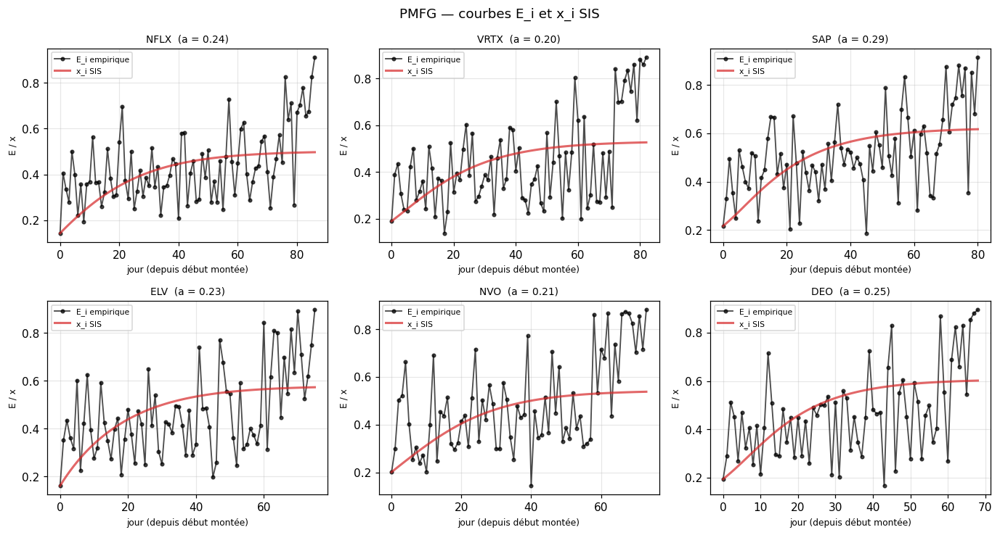

In [13]:
# ── Pente SIS↔E_i PAR ACTIF (PMFG) ────────────────────────────────────────────
# Mêmes conditions initiales (x0 = E empirique au 1er jour de la sous-période
# montante de l'actif). Pour chaque actif en crise on régresse x_i SIS (PMFG) vs
# E_i empirique -> une pente + R² par actif, puis on détaille quelques actifs.
SIS_MODEL_R = 'PMFG'
A_model     = A_sis[SIS_MODEL_R]
SMOOTH2, MIN_LEN, MIN_GAIN = 2, 10, 0.5
B_fit, R_fit, T_long, tol_eq = 1.0, 1.0, 50.0, 0.01
pa_big, pb_big = max(intervals, key=lambda ab: ab[1] - ab[0])

def strong_rise(y, smooth=SMOOTH2, min_len=MIN_LEN, min_gain=MIN_GAIN):
    """Plus longue fenêtre de forte montée d'une série.

    Parameters
    ----------
    y : ndarray
        Série E_i sur le run de crise.
    smooth : int
        Largeur du lissage (moyenne glissante) appliqué avant le test de gain.
    min_len : int
        Longueur minimale de la fenêtre retenue.
    min_gain : float
        Gain lissé minimal (fin - début) pour accepter une fenêtre.

    Returns
    -------
    tuple or None
        (longueur, gain, s, e) de la meilleure fenêtre, ou None si aucune.
    """
    ys  = uniform_filter1d(y, size=smooth, mode='nearest')
    best, m = None, len(y)
    for s in range(m):
        for e in range(s + min_len - 1, m):
            gain = ys[e] - ys[s]
            if gain >= min_gain:
                cand = (e - s + 1, gain, s, e)
                if best is None or (cand[0], cand[1]) > (best[0], best[1]):
                    best = cand
    return best

# Sous-période de montée propre (indices absolus) pour chaque actif qualifié
rise_windows = {}
for gi in range(N):
    win = None
    for a, b in asset_runs(crisis_map[gi]):
        if b >= pa_big and a <= pb_big:
            win = (a, b); break
    if win is None:
        continue
    res = strong_rise(E_daily_all[gi, win[0]:win[1] + 1])
    if res is not None:
        _, _, s2, e2 = res
        rise_windows[gi] = (win[0] + s2, win[0] + e2)

# ── Cache E_i empirique + condition initiale x0 par actif (indép. de la matrice)
asset_cache = {}
for gi, (A, Bd) in rise_windows.items():
    days_p   = list(all_days[A:Bd + 1])
    data_p   = data[np.isin(data.index.date, days_p)].copy()
    data_p['day'] = data_p.index.date
    days_p_s = sorted(data_p['day'].unique())
    n_days_p = len(days_p_s)

    E_full = np.full((N, n_days_p), np.nan)
    for k, d in enumerate(days_p_s):
        chunk = data_p[data_p['day'] == d].drop(columns=['day']).values
        if len(chunk) < 3:
            continue
        C_abs = np.abs(np.nan_to_num(np.corrcoef(chunk.T), nan=0.0))
        np.fill_diagonal(C_abs, 0)
        E_full[:, k] = C_abs.sum(axis=1) / (N - 1)

    mc_full = np.nanmean(E_full, axis=0)
    valid   = np.where(~np.isnan(mc_full))[0]
    if len(valid) == 0:
        continue
    asset_cache[gi] = dict(E_i=E_full[gi], x0=E_full[:, valid[0]], n_days=n_days_p)

print(f'{len(asset_cache)} actifs avec sous-courbe croissante.')

def integrate_asset(gi, A_model):
    """Intègre le SIS pour un actif (réseau complet, T_conv calé sur l'actif).

    Parameters
    ----------
    gi : int
        Indice global de l'actif (= actif de référence pour T_conv).
    A_model : ndarray
        Matrice d'adjacence N x N du SIS.

    Returns
    -------
    ndarray
        Trajectoire x_i SIS échantillonnée sur n_days jours.
    """
    d = asset_cache[gi]
    x0, n_days_p = d['x0'], d['n_days']
    sol_eq = solve_ivp(ode_sis, (0, T_long), x0, args=(A_model, B_fit, R_fit),
                       method='LSODA', rtol=1e-6, atol=1e-9)
    x_eq = sol_eq.y[gi, -1]
    t_probe = np.linspace(1e-3, T_long, 5000)
    sol_pr  = solve_ivp(ode_sis, (0, T_long), x0, args=(A_model, B_fit, R_fit),
                        t_eval=t_probe, method='LSODA', rtol=1e-6, atol=1e-9)
    above   = np.where(sol_pr.y[gi] >= (1 - tol_eq) * x_eq)[0]
    T_conv  = float(t_probe[above[0]]) if len(above) else T_long
    sol_p   = solve_ivp(ode_sis, (0, T_conv), x0, args=(A_model, B_fit, R_fit),
                        t_eval=np.linspace(0, T_conv, n_days_p), method='LSODA')
    return np.clip(sol_p.y[gi], 1e-8, 1 - 1e-8)

# ── SIS + régression par actif (PMFG uniquement) ──────────────────────────────
per_asset, slopes = {}, {}
for gi in asset_cache:
    E_i    = asset_cache[gi]['E_i']
    x_traj = integrate_asset(gi, A_model)
    per_asset[gi] = (E_i, x_traj)
    ok = ~np.isnan(E_i)
    if ok.sum() < 3:
        continue
    fit = linregress(E_i[ok], x_traj[ok])
    slopes[gi] = dict(slope=fit.slope, intercept=fit.intercept,
                      stderr=fit.stderr, r2=fit.rvalue ** 2, n=int(ok.sum()))
slope_arr = np.array([s['slope'] for s in slopes.values()])
print(f'{SIS_MODEL_R} : {len(slopes)} pentes — médiane {np.median(slope_arr):.2f}, '
      f'moyenne {slope_arr.mean():.2f} +/- {slope_arr.std():.2f}')

# Actifs détaillés : on force ceux qu'on veut voir (s'ils ont une montée verte),
# puis on complète avec ceux ayant le plus de jours sur leur sous-période.
WANT = ['NVDA']
few = []
for a in WANT:
    g = asset_names.index(a)
    if g in slopes:
        few.append(g)
        continue
    runs = [(x, y) for x, y in asset_runs(crisis_map[g])
            if y >= pa_big and x <= pb_big]
    if not runs:
        print(f'{a} écarté : aucun run de crise chevauchant la fenêtre globale.')
    elif strong_rise(E_daily_all[g, runs[0][0]:runs[0][1] + 1]) is None:
        print(f'{a} écarté : 1er run de crise sans montée >= MIN_GAIN ({MIN_GAIN}).')
    else:
        print(f'{a} écarté : moins de 3 jours exploitables.')
few += [gi for gi in sorted(slopes, key=lambda gi: -slopes[gi]['n']) if gi not in few]
few = few[:6]

# ── (1) Scatter x_i SIS vs E_i empirique PAR ACTIF, avec sa pente ──────────────
ncol = 3
nrow = int(np.ceil(len(few) / ncol))
fig, axes = plt.subplots(nrow, ncol, figsize=(4.2 * ncol, 3.4 * nrow))
axes = np.atleast_1d(axes).flatten()
for ax in axes[len(few):]:
    ax.axis('off')
for ax, gi in zip(axes, few):
    E_i, x_traj = per_asset[gi]
    ok = ~np.isnan(E_i)
    s  = slopes[gi]
    ax.scatter(E_i[ok], x_traj[ok], s=22, color='#1f77b4', alpha=0.6, edgecolors='none')
    xs = np.linspace(E_i[ok].min(), E_i[ok].max(), 50)
    ax.plot(xs, s['slope'] * xs + s['intercept'], color='red', linewidth=1.8,
            label=f"a = {s['slope']:.2f} +/- {s['stderr']:.2f}\nR² = {s['r2']:.2f}")
    ax.set_title(f"{asset_names[gi]}  ({s['n']} j)", fontsize=9)
    ax.set_xlabel('E_i empirique', fontsize=8)
    ax.set_ylabel('x_i SIS', fontsize=8)
    ax.legend(fontsize=7, loc='lower right')
    ax.grid(alpha=0.3)
plt.suptitle(f'{SIS_MODEL_R} — scatter x_i SIS vs E_i par actif', fontsize=12)
plt.tight_layout()
plt.show()

# ── (2) Distribution des pentes des actifs en crise ──────────────────────────
fig, ax = plt.subplots(figsize=(7, 5))
ax.hist(slope_arr, bins=20, color='#1f77b4', alpha=0.8)
ax.axvline(np.median(slope_arr), color='red', linestyle='--',
           label=f'médiane = {np.median(slope_arr):.2f}')
ax.set_xlabel('pente a (x_i SIS / E_i)')
ax.set_ylabel('nb actifs')
ax.set_title(f'{SIS_MODEL_R} — distribution des pentes par actif (n = {len(slopes)})')
ax.legend(fontsize=9); ax.grid(alpha=0.3, axis='y')
plt.tight_layout()
plt.show()

# ── (3) Courbes E_i empirique et x_i SIS vs temps pour quelques actifs ─────────
fig, axes = plt.subplots(nrow, ncol, figsize=(4.2 * ncol, 3.4 * nrow))
axes = np.atleast_1d(axes).flatten()
for ax in axes[len(few):]:
    ax.axis('off')
for ax, gi in zip(axes, few):
    E_i, x_traj = per_asset[gi]
    ok = ~np.isnan(E_i)
    t  = np.arange(len(E_i))
    ax.plot(t[ok], E_i[ok], color='black', marker='o', markersize=3, linewidth=1.2,
            alpha=0.7, label='E_i empirique')
    ax.plot(t, x_traj, color='#d62728', linewidth=2, alpha=0.7, label='x_i SIS')
    ax.set_title(f"{asset_names[gi]}  (a = {slopes[gi]['slope']:.2f})", fontsize=9)
    ax.set_xlabel('jour (depuis début montée)', fontsize=8)
    ax.set_ylabel('E / x', fontsize=8)
    ax.legend(fontsize=7, loc='best')
    ax.grid(alpha=0.3)
plt.suptitle(f'{SIS_MODEL_R} — courbes E_i et x_i SIS', fontsize=12)
plt.tight_layout()
plt.show()


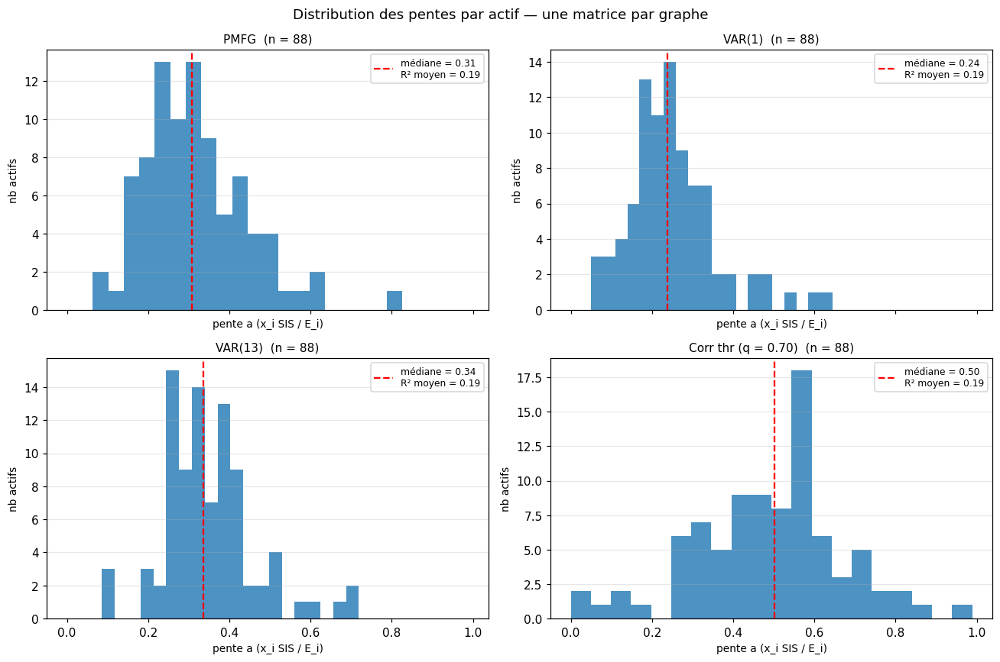

In [14]:
# ── Distribution des pentes par actif — une matrice par graphe ────────────────
# Pour chaque matrice (PMFG, VAR(1), VAR(13), corrélation filtrée à q = 0.70), on
# régresse x_i SIS vs E_i par actif sur sa sous-période montante, et on trace la
# distribution des pentes obtenues sur les actifs en crise.
CORR_Q   = 0.70
off_mask = ~np.eye(N, dtype=bool)

def build_filtered_corr(q, C=C_full):
    """Corrélation filtrée prête pour le SIS : |C_ij| au-dessus du quantile q.

    Parameters
    ----------
    q : float
        Quantile de |C| (hors diagonale) en dessous duquel les liens sont coupés.
    C : ndarray
        Matrice de corrélation absolue N x N (diagonale nulle).

    Returns
    -------
    ndarray
        Matrice N x N seuillée, prête pour `ode_sis` (via `prepare_for_sis`).
    """
    thr = np.quantile(C[off_mask], q)
    A = np.where(C >= thr, C, 0.0)
    np.fill_diagonal(A, 0)
    return prepare_for_sis(A)

A_sis['Corr thr'] = build_filtered_corr(CORR_Q)
SIS_MODELS = ['PMFG', 'VAR(1)', 'VAR(13)', 'Corr thr']

# Pente + R² par actif pour chaque matrice
slopes_by_model, r2_by_model = {}, {}
for model in SIS_MODELS:
    A_m = A_sis[model]
    sl, r2 = [], []
    for gi in asset_cache:
        E_i = asset_cache[gi]['E_i']
        ok  = ~np.isnan(E_i)
        if ok.sum() < 3:
            continue
        x_traj = integrate_asset(gi, A_m)
        fit = linregress(E_i[ok], x_traj[ok])
        sl.append(fit.slope); r2.append(fit.rvalue ** 2)
    slopes_by_model[model] = np.array(sl)
    r2_by_model[model]     = np.array(r2)

fig, axes = plt.subplots(2, 2, figsize=(12, 8), sharex=True)
axes = axes.flatten()
for ax, model in zip(axes, SIS_MODELS):
    sl    = slopes_by_model[model]
    r2m   = r2_by_model[model].mean()
    title = f'{model} (q = {CORR_Q:.2f})' if model == 'Corr thr' else model
    ax.hist(sl, bins=20, color='#1f77b4', alpha=0.8)
    ax.axvline(np.median(sl), color='red', linestyle='--',
               label=f'médiane = {np.median(sl):.2f}\nR² moyen = {r2m:.2f}')
    ax.set_title(f'{title}  (n = {len(sl)})', fontsize=10)
    ax.set_xlabel('pente a (x_i SIS / E_i)', fontsize=9)
    ax.set_ylabel('nb actifs', fontsize=9)
    ax.legend(fontsize=8); ax.grid(alpha=0.3, axis='y')
plt.suptitle('Distribution des pentes par actif — une matrice par graphe',
             fontsize=12)
plt.tight_layout()
plt.show()


on enleve valeur absolue pour correlatiokn
; ca qui marche bien. threshold du graph sur courbe avec threshold.

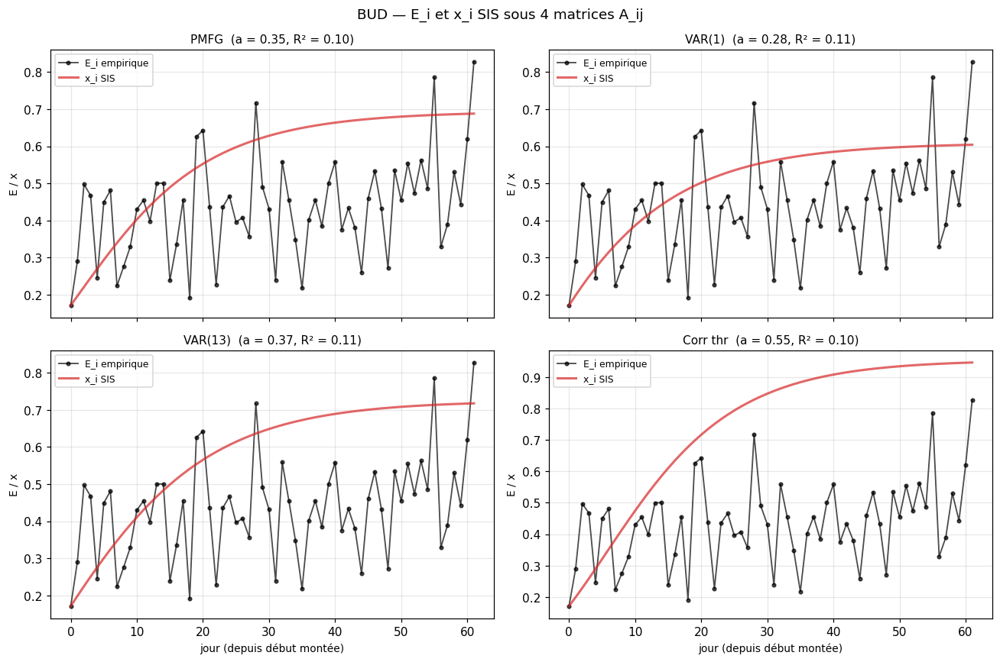

In [15]:
# ── Un seul actif : courbes E_i et x_i SIS pour 4 matrices A_ij ───────────────
# On compare PMFG, VAR(1), VAR(13) et une corrélation filtrée (|C_ij| >= quantile
# q), pour un seul actif, mêmes conditions initiales. Cellule autonome : elle
# construit la matrice 'Corr thr' et n'utilise que asset_cache / integrate_asset.
CORR_Q   = 0.70
off_mask = ~np.eye(N, dtype=bool)

def build_filtered_corr(q, C=C_full):
    """Corrélation filtrée prête pour le SIS : |C_ij| au-dessus du quantile q.

    Parameters
    ----------
    q : float
        Quantile de |C| (hors diagonale) en dessous duquel les liens sont coupés.
    C : ndarray
        Matrice de corrélation absolue N x N (diagonale nulle).

    Returns
    -------
    ndarray
        Matrice N x N seuillée, prête pour `ode_sis` (via `prepare_for_sis`).
    """
    thr = np.quantile(C[off_mask], q)
    A = np.where(C >= thr, C, 0.0)
    np.fill_diagonal(A, 0)
    return prepare_for_sis(A)

A_sis['Corr thr'] = build_filtered_corr(CORR_Q)
SIS_MODELS = ['PMFG', 'VAR(1)', 'VAR(13)', 'Corr thr']

# Par défaut on prend l'actif ayant la plus longue sous-période montante.
#ASSET_ONE = max(asset_cache, key=lambda gi: asset_cache[gi]['n_days'])
ASSET_ONE = asset_names.index('BUD')   # ou choisir un actif précis
gi   = ASSET_ONE
name = asset_names[gi]
E_i  = asset_cache[gi]['E_i']

ok   = ~np.isnan(E_i)
t    = np.arange(len(E_i))
fig, axes = plt.subplots(2, 2, figsize=(12, 8), sharex=True)
axes = axes.flatten()
for ax, model in zip(axes, SIS_MODELS):
    x_traj = integrate_asset(gi, A_sis[model])
    fit    = linregress(E_i[ok], x_traj[ok])
    ax.plot(t[ok], E_i[ok], color='black', marker='o', markersize=3, linewidth=1.2,
            alpha=0.7, label='E_i empirique')
    ax.plot(t, x_traj, color='#d62728', linewidth=2, alpha=0.7, label='x_i SIS')
    ax.set_title(f'{model}  (a = {fit.slope:.2f}, R² = {fit.rvalue**2:.2f})',
                 fontsize=10)
    ax.set_ylabel('E / x', fontsize=9)
    ax.legend(fontsize=8, loc='best')
    ax.grid(alpha=0.3)
for ax in axes[2:]:
    ax.set_xlabel('jour (depuis début montée)', fontsize=9)
plt.suptitle(f'{name} — E_i et x_i SIS sous 4 matrices A_ij', fontsize=12)
plt.tight_layout()
plt.show()


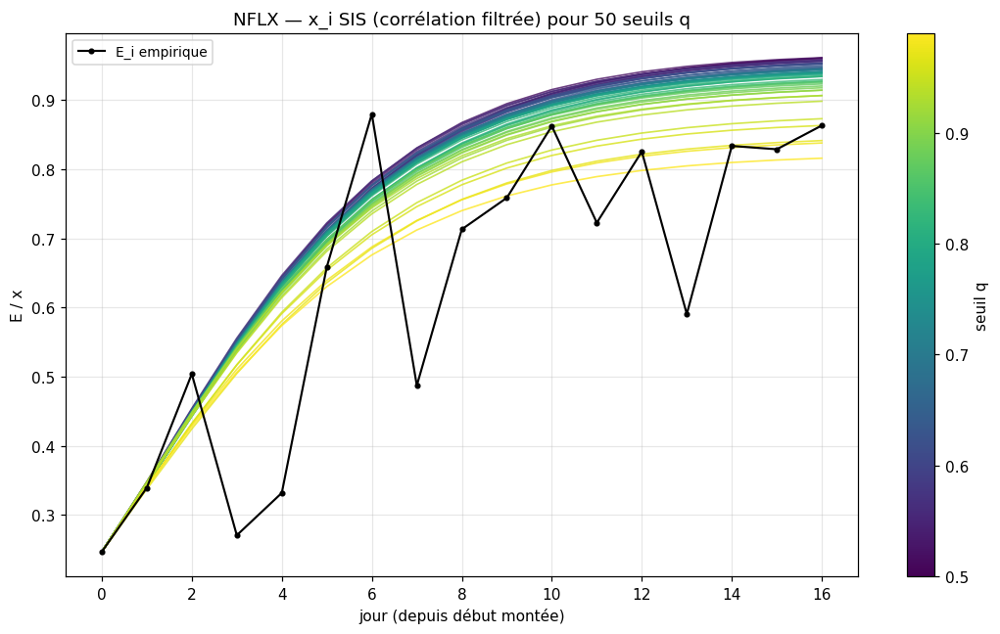

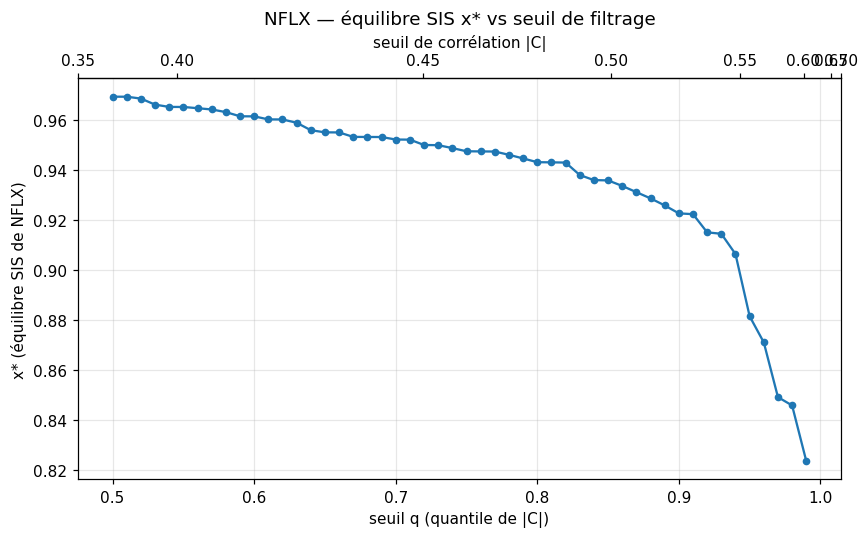

In [16]:
# ── NFLX : corrélation filtrée, balayage DENSE du seuil (quantile q) ───────────
# A_ij = |C_ij| si |C_ij| >= quantile_q(|C|), sinon 0 (sur C_full, déjà en val.
# absolue). On balaie beaucoup de seuils q : trajectoires x_i SIS de NFLX
# superposées (colorées par q) vs E_i empirique, puis l'équilibre SIS x* de NFLX
# en fonction du seuil.
Q_SWEEP = np.linspace(0.50, 0.99, 50)
gi = asset_names.index('XOM')
if gi not in asset_cache:                    # 'NOW' sans sous-période montante
    gi = max(asset_cache, key=lambda g: asset_cache[g]['n_days'])
    print(f"'NOW' absent d'asset_cache — repli sur {asset_names[gi]}.")
gi_nflx  = gi                                # mémorisé pour la cellule filtrée R²
off_mask = ~np.eye(N, dtype=bool)

def build_filtered_corr(q, C=C_full):
    """Corrélation filtrée prête pour le SIS : |C_ij| au-dessus du quantile q.

    Parameters
    ----------
    q : float
        Quantile de |C| (hors diagonale) en dessous duquel les liens sont coupés.
    C : ndarray
        Matrice de corrélation absolue N x N (diagonale nulle).

    Returns
    -------
    ndarray
        Matrice N x N seuillée, prête pour `ode_sis` (via `prepare_for_sis`).
    """
    thr = np.quantile(C[off_mask], q)
    A = np.where(C >= thr, C, 0.0)
    np.fill_diagonal(A, 0)
    return prepare_for_sis(A)

E_i = asset_cache[gi]['E_i']
ok  = ~np.isnan(E_i)
t   = np.arange(len(E_i))
x0  = asset_cache[gi]['x0']

# Pour chaque seuil : trajectoire NFLX (overlay) + équilibre SIS x* de NFLX
trajs, xstar_q, thr_q = [], [], []
for q in Q_SWEEP:
    A_q    = build_filtered_corr(q)
    trajs.append(integrate_asset(gi, A_q))
    sol_eq = solve_ivp(ode_sis, (0, T_long), x0, args=(A_q, B_fit, R_fit),
                       method='LSODA', rtol=1e-6, atol=1e-9)
    xstar_q.append(sol_eq.y[gi, -1])
    thr_q.append(np.quantile(C_full[off_mask], q))
xstar_q = np.array(xstar_q); thr_q = np.array(thr_q)

# ── (1) Toutes les trajectoires SIS superposées, colorées par q ───────────────
cmap = plt.cm.viridis
norm = plt.Normalize(Q_SWEEP.min(), Q_SWEEP.max())
fig, ax = plt.subplots(figsize=(10, 6))
for q, x_traj in zip(Q_SWEEP, trajs):
    ax.plot(t, x_traj, color=cmap(norm(q)), linewidth=1.1, alpha=0.8)
ax.plot(t[ok], E_i[ok], color='black', marker='o', markersize=3, linewidth=1.4,
        label='E_i empirique', zorder=5)
sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm); sm.set_array([])
cb = fig.colorbar(sm, ax=ax); cb.set_label('seuil q')
ax.set_xlabel('jour (depuis début montée)'); ax.set_ylabel('E / x')
ax.set_title(f'NFLX — x_i SIS (corrélation filtrée) pour {len(Q_SWEEP)} seuils q')
ax.legend(fontsize=9, loc='best'); ax.grid(alpha=0.3)
plt.tight_layout()
plt.show()

# ── (2) Équilibre SIS x* de NFLX en fonction du seuil ─────────────────────────
qcrit = Q_SWEEP[np.argmax(xstar_q < 1e-3)] if np.any(xstar_q < 1e-3) else None
fig, ax = plt.subplots(figsize=(8, 5))
ax.plot(Q_SWEEP, xstar_q, color='#1f77b4', marker='o', markersize=4)

ax.set_xlabel('seuil q (quantile de |C|)')
ax.set_ylabel('x* (équilibre SIS de NFLX)')
ax.set_title('NFLX — équilibre SIS x* vs seuil de filtrage')
ax.grid(alpha=0.3)
# Axe haut : valeur de seuil de corrélation correspondante
axt = ax.secondary_xaxis('top',
        functions=(lambda qq: np.interp(qq, Q_SWEEP, thr_q),
                   lambda tt: np.interp(tt, thr_q, Q_SWEEP)))
axt.set_xlabel('seuil de corrélation |C|')
plt.tight_layout()
plt.show()


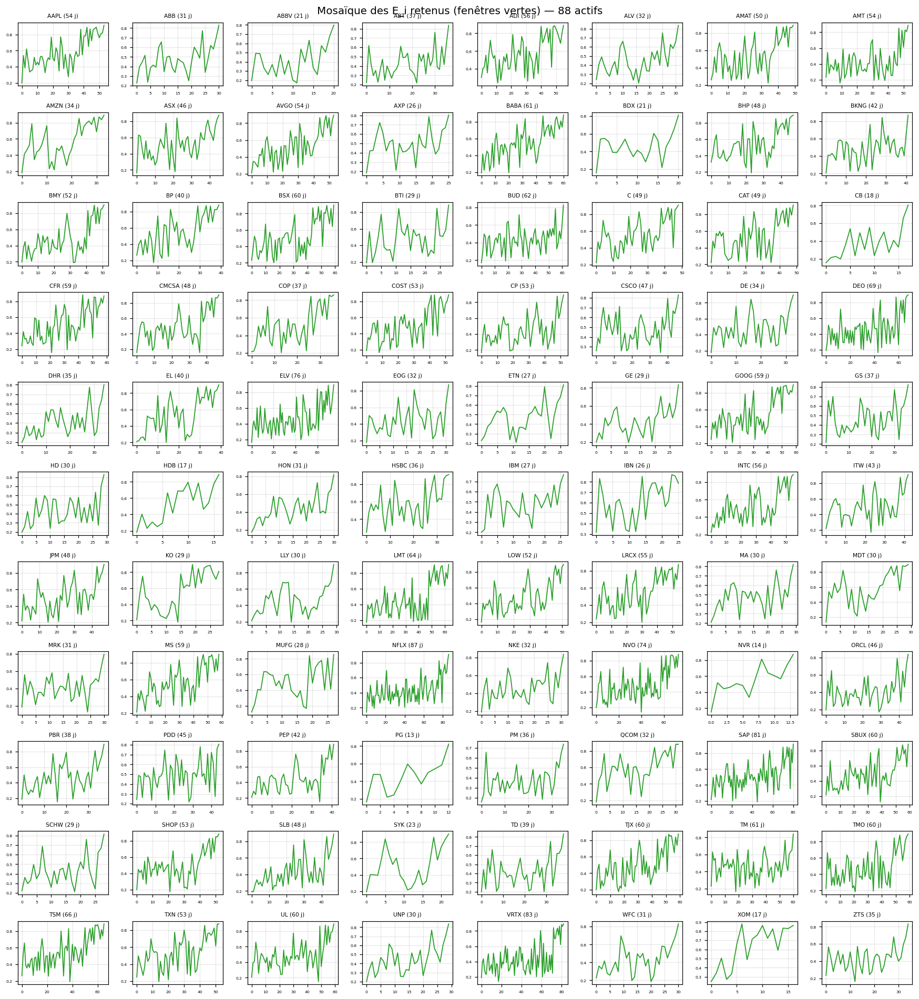

In [17]:
# ── Mosaïque des E_i retenus (fenêtres vertes) ────────────────────────────────
# Un mini-graphe par actif conservé dans asset_cache : sa courbe E_i sur sa
# sous-période de montée verte (strong_rise). Permet de vérifier d'un coup d'œil
# les fenêtres retenues et leurs longueurs.
items = sorted(asset_cache.items(), key=lambda kv: asset_names[kv[0]])
n     = len(items)
ncol  = 8
nrow  = int(np.ceil(n / ncol))
fig, axes = plt.subplots(nrow, ncol, figsize=(2.0 * ncol, 1.6 * nrow))
axes = np.atleast_1d(axes).flatten()
for ax in axes[n:]:
    ax.axis('off')
for ax, (gi, d) in zip(axes, items):
    E_i = d['E_i']
    ok  = ~np.isnan(E_i)
    ax.plot(np.arange(len(E_i))[ok], E_i[ok], color='#2ca02c', linewidth=1.2)
    ax.set_title(f"{asset_names[gi]} ({d['n_days']} j)", fontsize=7)
    ax.tick_params(labelsize=5)
    ax.grid(alpha=0.3)
plt.suptitle(f'Mosaïque des E_i retenus (fenêtres vertes) — {n} actifs', fontsize=13)
plt.tight_layout()
plt.show()


## Graphes filtrés par R² (hyperparamètre `R2_MIN`)

Versions des graphes du bas ne gardant que les actifs / courbes dont le fit
x_i SIS vs E_i atteint R² >= `R2_MIN`. Réutilise les variables calculées plus
haut (`slopes`, `per_asset`, `slopes_by_model`, `trajs`, `asset_cache`, …).
Modifier `R2_MIN` ci-dessous puis ré-exécuter ces cellules.

PMFG : 12 actifs avec R² >= 0.3
VAR(1) : 10 actifs avec R² >= 0.3
VAR(13) : 12 actifs avec R² >= 0.3
Corr thr : 13 actifs avec R² >= 0.3
12 actifs affichés (R² >= 0.3 pour >= 1 matrice).


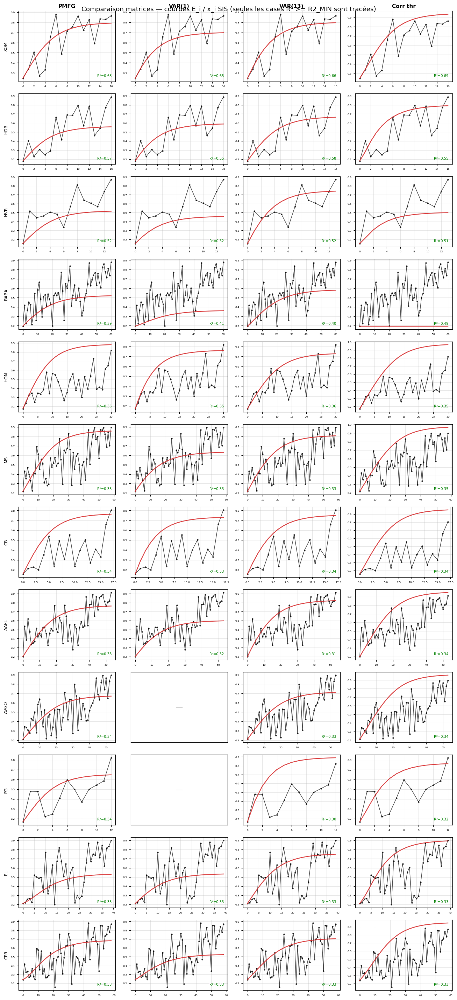

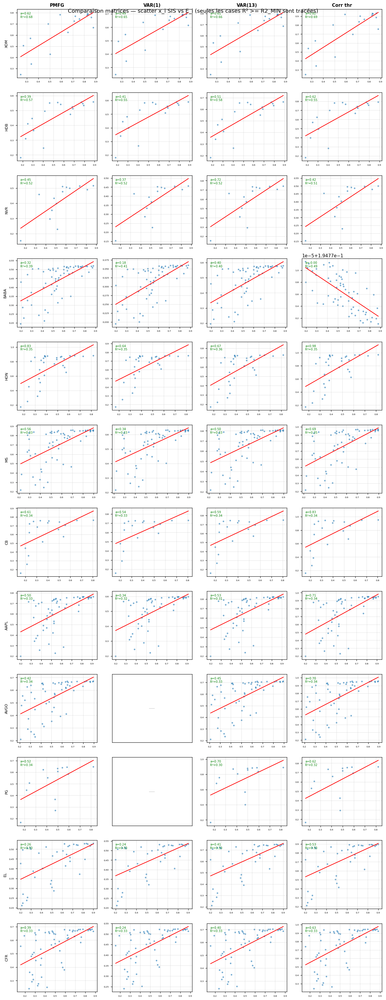

In [18]:
# ── R² : comparaison des 4 matrices A_ij côte à côte ──────────────
# Lignes = actifs validés (R² >= R2_MIN par au moins une matrice), colonnes =
# matrices (PMFG, VAR(1), VAR(13), Corr thr). On ne trace la courbe que dans les
# cases qui PASSENT le critère R² >= R2_MIN ; les autres restent vides.
R2_MIN         = 0.3    # hyperparamètre : seuil R² minimal
CORR_THRESHOLD = 0.8   # hyperparamètre : quantile de |C| pour la matrice 'Corr thr'

def fit_per_asset(A_model):
    """Régression x_i SIS vs E_i par actif pour une matrice donnée.

    Parameters
    ----------
    A_model : ndarray
        Matrice d'adjacence N x N du SIS.

    Returns
    -------
    tuple of dict
        (per_asset, slopes) : per_asset[gi] = (E_i, x_traj) ; slopes[gi] = dict
        slope/intercept/stderr/r2/n pour les actifs avec >= 3 jours valides.
    """
    pa, sl = {}, {}
    for gi in asset_cache:
        E_i    = asset_cache[gi]['E_i']
        x_traj = integrate_asset(gi, A_model)
        pa[gi] = (E_i, x_traj)
        ok = ~np.isnan(E_i)
        if ok.sum() < 3:
            continue
        fit = linregress(E_i[ok], x_traj[ok])
        sl[gi] = dict(slope=fit.slope, intercept=fit.intercept,
                      stderr=fit.stderr, r2=fit.rvalue ** 2, n=int(ok.sum()))
    return pa, sl

# Matrice 'Corr thr' reconstruite selon CORR_THRESHOLD (|C_ij| >= quantile)
A_sis['Corr thr'] = build_filtered_corr(CORR_THRESHOLD)

fits = {m: fit_per_asset(A_sis[m]) for m in SIS_MODELS}

def r2_of(m, gi):
    """R² de l'actif gi pour la matrice m (nan si non régressé)."""
    sl = fits[m][1]
    return sl[gi]['r2'] if gi in sl else np.nan

def passes(m, gi):
    """True si l'actif gi atteint R² >= R2_MIN pour la matrice m."""
    r2 = r2_of(m, gi)
    return (not np.isnan(r2)) and r2 >= R2_MIN

for m in SIS_MODELS:
    print(f'{m} : {sum(passes(m, gi) for gi in asset_cache)} actifs avec R² >= {R2_MIN}')

# Lignes = actifs validés par au moins une matrice, triés par meilleur R²
assets_cmp = [gi for gi in asset_cache if any(passes(m, gi) for m in SIS_MODELS)]
assets_cmp.sort(key=lambda gi: -max(np.nan_to_num(r2_of(m, gi)) for m in SIS_MODELS))
assets_cmp = assets_cmp[:12]
nA, nM = len(assets_cmp), len(SIS_MODELS)
print(f'{nA} actifs affichés (R² >= {R2_MIN} pour >= 1 matrice).')

# ── (1) Courbes E_i et x_i SIS : seulement les cases qui passent le critère ──
fig, axes = plt.subplots(nA, nM, figsize=(3.0 * nM, 2.2 * nA), squeeze=False)
for i, gi in enumerate(assets_cmp):
    for j, m in enumerate(SIS_MODELS):
        ax = axes[i, j]
        if i == 0:
            ax.set_title(m, fontsize=10, fontweight='bold')
        if j == 0:
            ax.set_ylabel(asset_names[gi], fontsize=8)
        if not passes(m, gi):
            ax.set_xticks([]); ax.set_yticks([])
            ax.text(0.5, 0.5, '—', transform=ax.transAxes, ha='center',
                    va='center', color='lightgray', fontsize=14)
            continue
        E_i, x_traj = fits[m][0][gi]
        ok = ~np.isnan(E_i); t = np.arange(len(E_i))
        ax.plot(t[ok], E_i[ok], color='black', marker='o', markersize=2,
                linewidth=1.0, alpha=0.7)
        ax.plot(t, x_traj, color='#d62728', linewidth=1.6, alpha=0.85)
        ax.text(0.96, 0.06, f'R²={r2_of(m, gi):.2f}', transform=ax.transAxes,
                ha='right', va='bottom', fontsize=6.5, color='green')
        ax.tick_params(labelsize=5); ax.grid(alpha=0.3)
plt.suptitle('Comparaison matrices — courbes E_i / x_i SIS '
             '(seules les cases R² >= R2_MIN sont tracées)', fontsize=12)
plt.tight_layout(); plt.show()

# ── (2) Scatter x_i SIS vs E_i : seulement les cases qui passent le critère ──
fig, axes = plt.subplots(nA, nM, figsize=(3.0 * nM, 2.6 * nA), squeeze=False)
for i, gi in enumerate(assets_cmp):
    for j, m in enumerate(SIS_MODELS):
        ax = axes[i, j]
        if i == 0:
            ax.set_title(m, fontsize=10, fontweight='bold')
        if j == 0:
            ax.set_ylabel(asset_names[gi], fontsize=8)
        if not passes(m, gi):
            ax.set_xticks([]); ax.set_yticks([])
            ax.text(0.5, 0.5, '—', transform=ax.transAxes, ha='center',
                    va='center', color='lightgray', fontsize=14)
            continue
        E_i, x_traj = fits[m][0][gi]
        ok = ~np.isnan(E_i); s = fits[m][1][gi]
        ax.scatter(E_i[ok], x_traj[ok], s=12, color='#1f77b4', alpha=0.6,
                   edgecolors='none')
        xs = np.linspace(E_i[ok].min(), E_i[ok].max(), 50)
        ax.plot(xs, s['slope'] * xs + s['intercept'], color='red', linewidth=1.4)
        ax.text(0.04, 0.96, f"a={s['slope']:.2f}\nR²={s['r2']:.2f}",
                transform=ax.transAxes, ha='left', va='top', fontsize=6.5,
                color='green')
        ax.tick_params(labelsize=5); ax.grid(alpha=0.3)
plt.suptitle('Comparaison matrices — scatter x_i SIS vs E_i '
             '(seules les cases R² >= R2_MIN sont tracées)', fontsize=12)
plt.tight_layout(); plt.show()

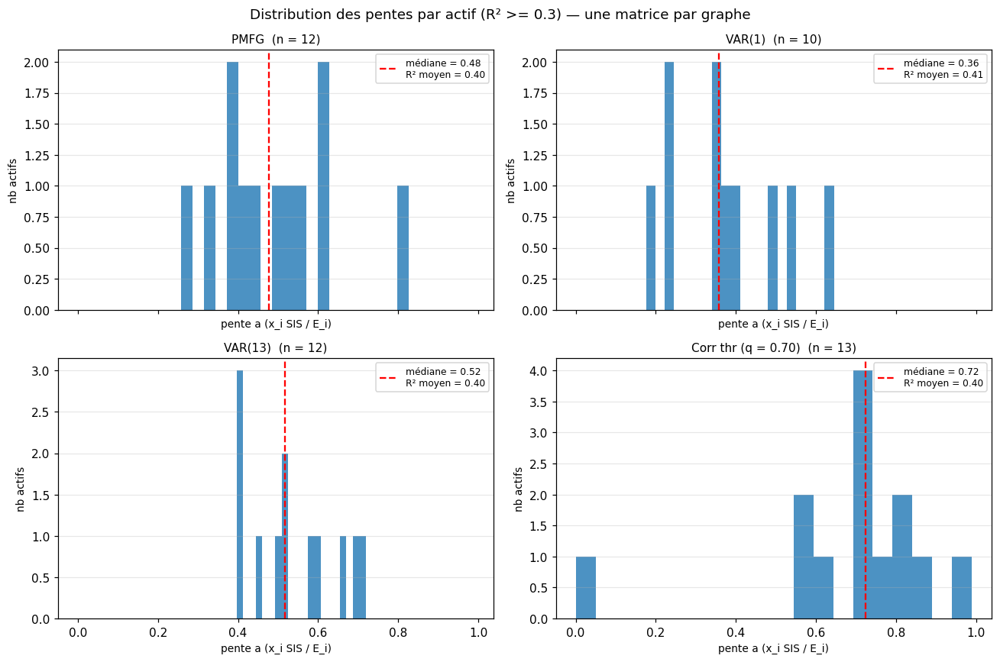

In [19]:
# ── R² : distribution des pentes par matrice (R² >= R2_MIN) ───────────────────
# Reprend slopes_by_model / r2_by_model (cellule « une matrice par graphe »).
fig, axes = plt.subplots(2, 2, figsize=(12, 8), sharex=True)
axes = axes.flatten()
for ax, model in zip(axes, SIS_MODELS):
    r2   = r2_by_model[model]
    msk  = r2 >= R2_MIN
    sl   = slopes_by_model[model][msk]
    r2m  = r2[msk].mean() if msk.any() else float('nan')
    title = f'{model} (q = {CORR_Q:.2f})' if model == 'Corr thr' else model
    ax.hist(sl, bins=20, color='#1f77b4', alpha=0.8)
    if len(sl):
        ax.axvline(np.median(sl), color='red', linestyle='--',
                   label=f'médiane = {np.median(sl):.2f}\nR² moyen = {r2m:.2f}')
    ax.set_title(f'{title}  (n = {len(sl)})', fontsize=10)
    ax.set_xlabel('pente a (x_i SIS / E_i)', fontsize=9); ax.set_ylabel('nb actifs', fontsize=9)
    ax.legend(fontsize=8); ax.grid(alpha=0.3, axis='y')
plt.suptitle(f'Distribution des pentes par actif (R² >= {R2_MIN}) — une matrice par graphe',
             fontsize=12)
plt.tight_layout(); plt.show()

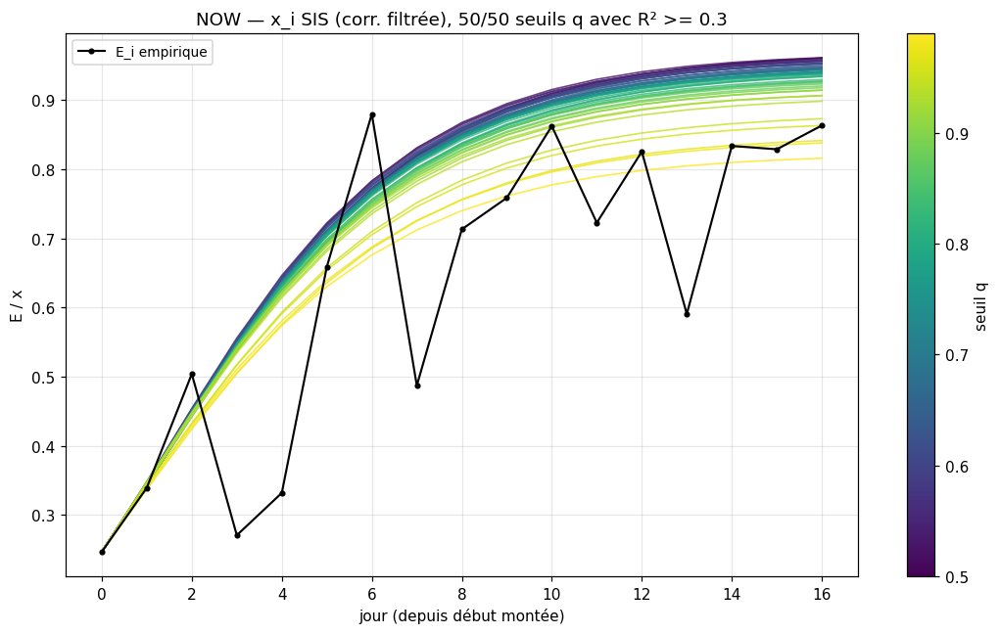

In [20]:
# ── R² : spaghetti NOW, seuils q avec R² >= R2_MIN ────────────────────────────
# Reprend trajs / Q_SWEEP (cellule balayage dense du seuil q). R² recalculé par
# trajectoire vs E_i empirique de l'actif.
gi_now = gi_nflx                             # même actif que la cellule NFLX d'origine
E_now  = asset_cache[gi_now]['E_i']
ok_now = ~np.isnan(E_now)
t_now  = np.arange(len(E_now))
r2_q   = np.array([linregress(E_now[ok_now], tr[ok_now]).rvalue ** 2 for tr in trajs])

cmap = plt.cm.viridis
norm = plt.Normalize(Q_SWEEP.min(), Q_SWEEP.max())
fig, ax = plt.subplots(figsize=(10, 6))
n_kept = 0
for q, tr, r2v in zip(Q_SWEEP, trajs, r2_q):
    #if r2v < R2_MIN:
     #   continue
    ax.plot(t_now, tr, color=cmap(norm(q)), linewidth=1.1, alpha=0.8)
    n_kept += 1
ax.plot(t_now[ok_now], E_now[ok_now], color='black', marker='o', markersize=3,
        linewidth=1.4, label='E_i empirique', zorder=5)
sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm); sm.set_array([])
cb = fig.colorbar(sm, ax=ax); cb.set_label('seuil q')
ax.set_xlabel('jour (depuis début montée)'); ax.set_ylabel('E / x')
ax.set_title(f'NOW — x_i SIS (corr. filtrée), {n_kept}/{len(Q_SWEEP)} seuils q avec R² >= {R2_MIN}')
ax.legend(fontsize=9, loc='best'); ax.grid(alpha=0.3)
plt.tight_layout(); plt.show()

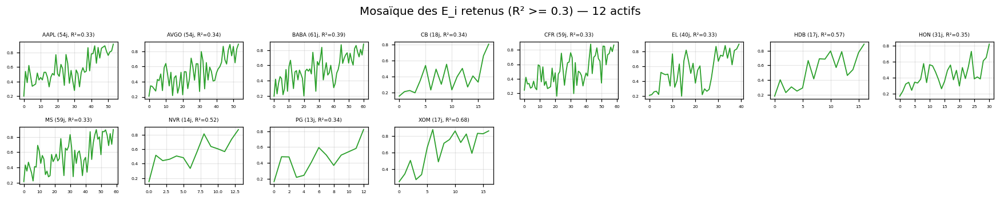

In [21]:
# ── R² : mosaïque des E_i (actifs avec R² >= R2_MIN) ──────────────────────────
items_r2 = [(gi, d) for gi, d in sorted(asset_cache.items(),
            key=lambda kv: asset_names[kv[0]])
            if gi in slopes and slopes[gi]['r2'] >= R2_MIN]
n    = len(items_r2)
ncol = 8
nrow = int(np.ceil(max(1, n) / ncol))
fig, axes = plt.subplots(nrow, ncol, figsize=(2.0 * ncol, 1.6 * nrow))
axes = np.atleast_1d(axes).flatten()
for ax in axes[n:]:
    ax.axis('off')
for ax, (gi, d) in zip(axes, items_r2):
    E_i = d['E_i']; ok = ~np.isnan(E_i)
    ax.plot(np.arange(len(E_i))[ok], E_i[ok], color='#2ca02c', linewidth=1.2)
    ax.set_title(f"{asset_names[gi]} ({d['n_days']}j, R²={slopes[gi]['r2']:.2f})", fontsize=6)
    ax.tick_params(labelsize=5); ax.grid(alpha=0.3)
plt.suptitle(f'Mosaïque des E_i retenus (R² >= {R2_MIN}) — {n} actifs', fontsize=13)
plt.tight_layout(); plt.show()

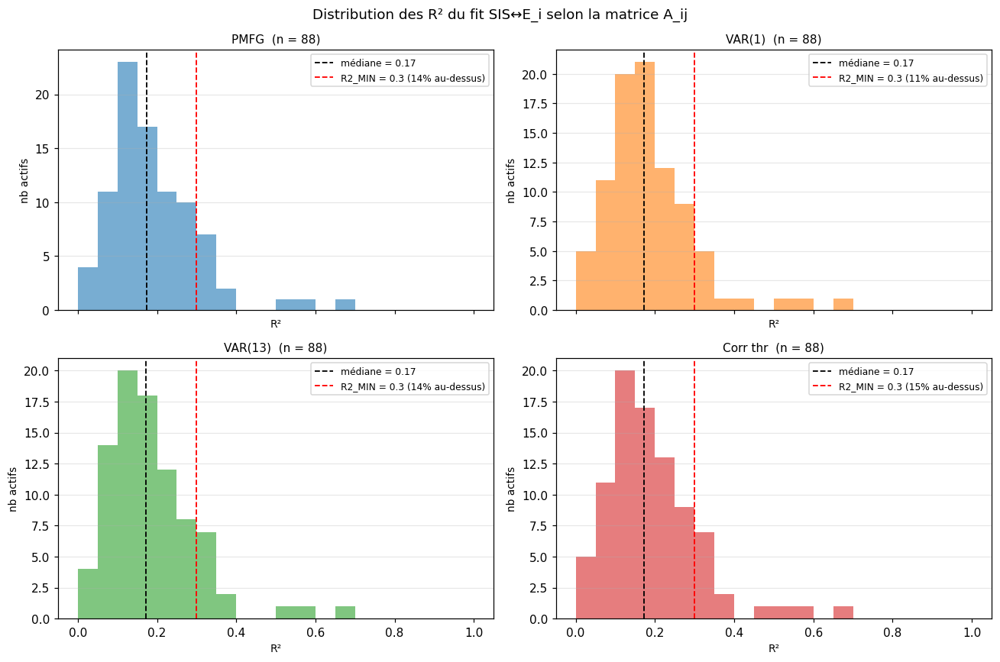

In [22]:
# ── Distribution des R² par méthode (matrice A_ij) ────────────────────────────
# Reprend r2_by_model (cellule « une matrice par graphe ») : un histogramme des
# R² du fit x_i SIS vs E_i par actif, un sous-plot par matrice. R2_MIN = seuil.
colors = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728']
bins   = np.linspace(0, 1, 21)

fig, axes = plt.subplots(2, 2, figsize=(12, 8), sharex=True)
axes = axes.flatten()
for ax, m, c in zip(axes, SIS_MODELS, colors):
    r2   = r2_by_model[m]
    frac = np.mean(r2 >= R2_MIN)
    ax.hist(r2, bins=bins, color=c, alpha=0.6)
    ax.axvline(np.median(r2), color='black', linestyle='--', linewidth=1.2,
               label=f'médiane = {np.median(r2):.2f}')
    ax.axvline(R2_MIN, color='red', linestyle='--', linewidth=1.2,
               label=f'R2_MIN = {R2_MIN} ({frac:.0%} au-dessus)')
    ax.set_title(f'{m}  (n = {len(r2)})', fontsize=10)
    ax.set_xlabel('R²', fontsize=9); ax.set_ylabel('nb actifs', fontsize=9)
    ax.legend(fontsize=8); ax.grid(alpha=0.3, axis='y')
plt.suptitle('Distribution des R² du fit SIS↔E_i selon la matrice A_ij', fontsize=12)
plt.tight_layout(); plt.show()

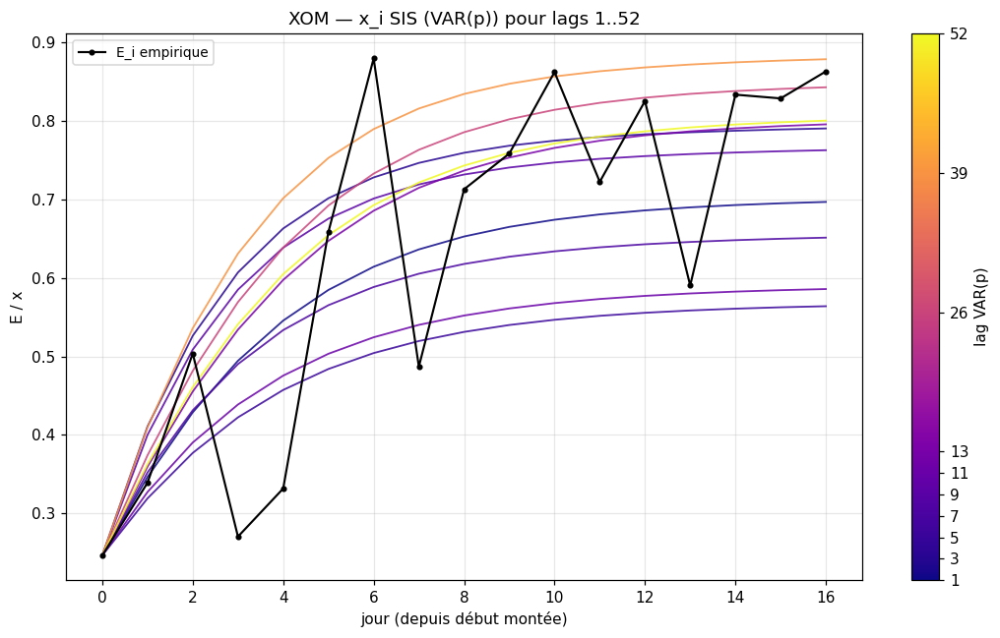

In [23]:
# ── VAR(p) : balayage du lag (une courbe = un lag) ────────────────────────────
# Comme le balayage du seuil q, mais on fait varier le lag du VAR : A_ij = |coef
# VAR(p)|_ij. Trajectoires x_i SIS du même actif superposées (colorées par lag p)
# vs E_i empirique. Réutilise fit_var / prepare_for_sis / integrate_asset.
LAG_SWEEP = list(range(1, 14, 2)) + [26, 39, 52]   # lags VAR(p) + multiples de 13

def build_var(lag):
    """Matrice d'adjacence |coef VAR(lag)| prête pour le SIS.

    Parameters
    ----------
    lag : int
        Ordre du VAR ajusté sur les rendements (R_arr).

    Returns
    -------
    ndarray
        Matrice N x N (diagonale nulle), prête pour `ode_sis`.
    """
    A = np.abs(fit_var(R_arr, lag).T)
    np.fill_diagonal(A, 0)
    return prepare_for_sis(A)

gi  = gi_nflx                                 # même actif que la cellule NFLX
E_i = asset_cache[gi]['E_i']
ok  = ~np.isnan(E_i)
t   = np.arange(len(E_i))

trajs_lag = [integrate_asset(gi, build_var(p)) for p in LAG_SWEEP]

cmap = plt.cm.plasma
norm = plt.Normalize(min(LAG_SWEEP), max(LAG_SWEEP))
fig, ax = plt.subplots(figsize=(10, 6))
for p, x_traj in zip(LAG_SWEEP, trajs_lag):
    ax.plot(t, x_traj, color=cmap(norm(p)), linewidth=1.2, alpha=0.85)
ax.plot(t[ok], E_i[ok], color='black', marker='o', markersize=3, linewidth=1.4,
        label='E_i empirique', zorder=5)
sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm); sm.set_array([])
cb = fig.colorbar(sm, ax=ax, ticks=list(LAG_SWEEP)); cb.set_label('lag VAR(p)')
ax.set_xlabel('jour (depuis début montée)'); ax.set_ylabel('E / x')
ax.set_title(f'{asset_names[gi]} — x_i SIS (VAR(p)) pour lags '
             f'{min(LAG_SWEEP)}..{max(LAG_SWEEP)}')
ax.legend(fontsize=9, loc='best'); ax.grid(alpha=0.3)
plt.tight_layout(); plt.show()

PMFG : 12 actifs avec R² >= 0.3
VAR(1) : 10 actifs avec R² >= 0.3
VAR(13) : 12 actifs avec R² >= 0.3
Corr thr : 13 actifs avec R² >= 0.3
12 actifs affichés (R² >= 0.3 pour >= 1 matrice).


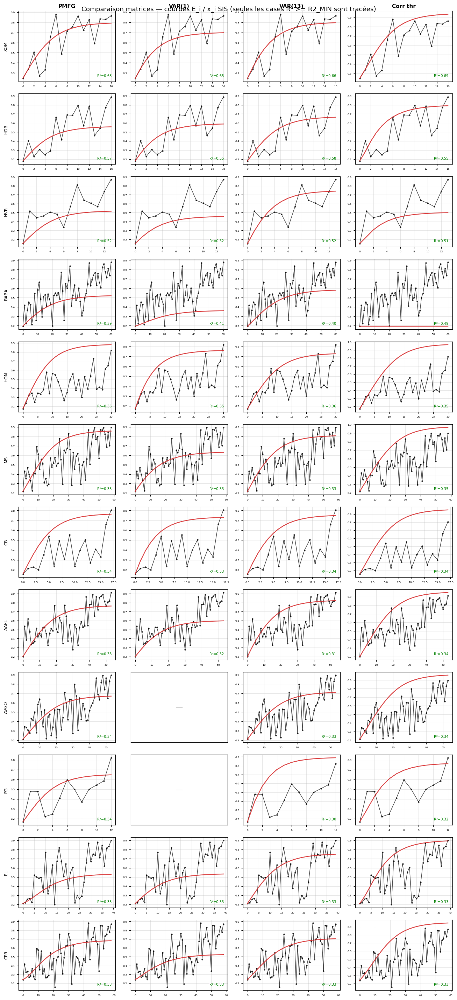

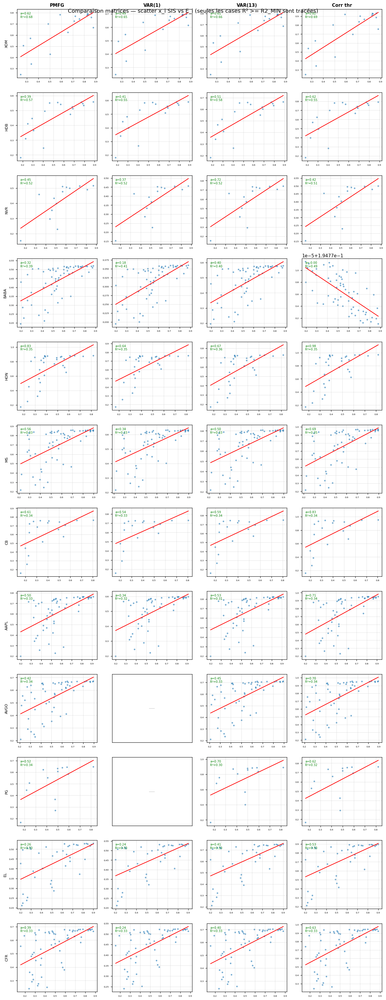

In [24]:
# ── R² : comparaison des 4 matrices A_ij côte à côte ──────────────
# Lignes = actifs validés (R² >= R2_MIN par au moins une matrice), colonnes =
# matrices (PMFG, VAR(1), VAR(13), Corr thr). On ne trace la courbe que dans les
# cases qui PASSENT le critère R² >= R2_MIN ; les autres restent vides.
R2_MIN         = 0.3    # hyperparamètre : seuil R² minimal
CORR_THRESHOLD = 0.8   # hyperparamètre : quantile de |C| pour la matrice 'Corr thr'

def fit_per_asset(A_model):
    """Régression x_i SIS vs E_i par actif pour une matrice donnée.

    Parameters
    ----------
    A_model : ndarray
        Matrice d'adjacence N x N du SIS.

    Returns
    -------
    tuple of dict
        (per_asset, slopes) : per_asset[gi] = (E_i, x_traj) ; slopes[gi] = dict
        slope/intercept/stderr/r2/n pour les actifs avec >= 3 jours valides.
    """
    pa, sl = {}, {}
    for gi in asset_cache:
        E_i    = asset_cache[gi]['E_i']
        x_traj = integrate_asset(gi, A_model)
        pa[gi] = (E_i, x_traj)
        ok = ~np.isnan(E_i)
        if ok.sum() < 3:
            continue
        fit = linregress(E_i[ok], x_traj[ok])
        sl[gi] = dict(slope=fit.slope, intercept=fit.intercept,
                      stderr=fit.stderr, r2=fit.rvalue ** 2, n=int(ok.sum()))
    return pa, sl

# Matrice 'Corr thr' reconstruite selon CORR_THRESHOLD (|C_ij| >= quantile)
A_sis['Corr thr'] = build_filtered_corr(CORR_THRESHOLD)

fits = {m: fit_per_asset(A_sis[m]) for m in SIS_MODELS}

def r2_of(m, gi):
    """R² de l'actif gi pour la matrice m (nan si non régressé)."""
    sl = fits[m][1]
    return sl[gi]['r2'] if gi in sl else np.nan

def passes(m, gi):
    """True si l'actif gi atteint R² >= R2_MIN pour la matrice m."""
    r2 = r2_of(m, gi)
    return (not np.isnan(r2)) and r2 >= R2_MIN

for m in SIS_MODELS:
    print(f'{m} : {sum(passes(m, gi) for gi in asset_cache)} actifs avec R² >= {R2_MIN}')

# Lignes = actifs validés par au moins une matrice, triés par meilleur R²
assets_cmp = [gi for gi in asset_cache if any(passes(m, gi) for m in SIS_MODELS)]
assets_cmp.sort(key=lambda gi: -max(np.nan_to_num(r2_of(m, gi)) for m in SIS_MODELS))
assets_cmp = assets_cmp[:12]
nA, nM = len(assets_cmp), len(SIS_MODELS)
print(f'{nA} actifs affichés (R² >= {R2_MIN} pour >= 1 matrice).')

# ── (1) Courbes E_i et x_i SIS : seulement les cases qui passent le critère ──
fig, axes = plt.subplots(nA, nM, figsize=(3.0 * nM, 2.2 * nA), squeeze=False)
for i, gi in enumerate(assets_cmp):
    for j, m in enumerate(SIS_MODELS):
        ax = axes[i, j]
        if i == 0:
            ax.set_title(m, fontsize=10, fontweight='bold')
        if j == 0:
            ax.set_ylabel(asset_names[gi], fontsize=8)
        if not passes(m, gi):
            ax.set_xticks([]); ax.set_yticks([])
            ax.text(0.5, 0.5, '—', transform=ax.transAxes, ha='center',
                    va='center', color='lightgray', fontsize=14)
            continue
        E_i, x_traj = fits[m][0][gi]
        ok = ~np.isnan(E_i); t = np.arange(len(E_i))
        ax.plot(t[ok], E_i[ok], color='black', marker='o', markersize=2,
                linewidth=1.0, alpha=0.7)
        ax.plot(t, x_traj, color='#d62728', linewidth=1.6, alpha=0.85)
        ax.text(0.96, 0.06, f'R²={r2_of(m, gi):.2f}', transform=ax.transAxes,
                ha='right', va='bottom', fontsize=6.5, color='green')
        ax.tick_params(labelsize=5); ax.grid(alpha=0.3)
plt.suptitle('Comparaison matrices — courbes E_i / x_i SIS '
             '(seules les cases R² >= R2_MIN sont tracées)', fontsize=12)
plt.tight_layout(); plt.show()

# ── (2) Scatter x_i SIS vs E_i : seulement les cases qui passent le critère ──
fig, axes = plt.subplots(nA, nM, figsize=(3.0 * nM, 2.6 * nA), squeeze=False)
for i, gi in enumerate(assets_cmp):
    for j, m in enumerate(SIS_MODELS):
        ax = axes[i, j]
        if i == 0:
            ax.set_title(m, fontsize=10, fontweight='bold')
        if j == 0:
            ax.set_ylabel(asset_names[gi], fontsize=8)
        if not passes(m, gi):
            ax.set_xticks([]); ax.set_yticks([])
            ax.text(0.5, 0.5, '—', transform=ax.transAxes, ha='center',
                    va='center', color='lightgray', fontsize=14)
            continue
        E_i, x_traj = fits[m][0][gi]
        ok = ~np.isnan(E_i); s = fits[m][1][gi]
        ax.scatter(E_i[ok], x_traj[ok], s=12, color='#1f77b4', alpha=0.6,
                   edgecolors='none')
        xs = np.linspace(E_i[ok].min(), E_i[ok].max(), 50)
        ax.plot(xs, s['slope'] * xs + s['intercept'], color='red', linewidth=1.4)
        ax.text(0.04, 0.96, f"a={s['slope']:.2f}\nR²={s['r2']:.2f}",
                transform=ax.transAxes, ha='left', va='top', fontsize=6.5,
                color='green')
        ax.tick_params(labelsize=5); ax.grid(alpha=0.3)
plt.suptitle('Comparaison matrices — scatter x_i SIS vs E_i '
             '(seules les cases R² >= R2_MIN sont tracées)', fontsize=12)
plt.tight_layout(); plt.show()

88 actifs (E_i = somme corrélations signées).
E_i signé croissant (gain > 0) : 100% des actifs ; |E_i| : 100%.
gain médian — signé +0.800, |.| +0.660.


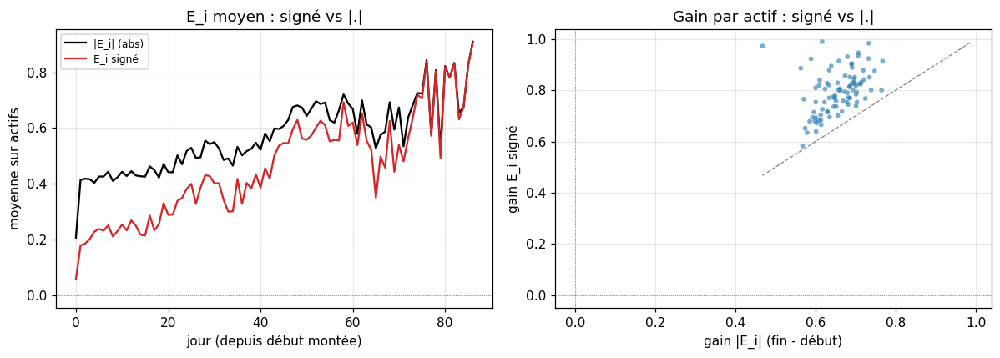

PMFG : 21 actifs avec R² >= 0.3
VAR(1) : 20 actifs avec R² >= 0.3
VAR(13) : 19 actifs avec R² >= 0.3
Corr thr : 23 actifs avec R² >= 0.3
12 actifs affichés (R² >= 0.3 pour >= 1 matrice).


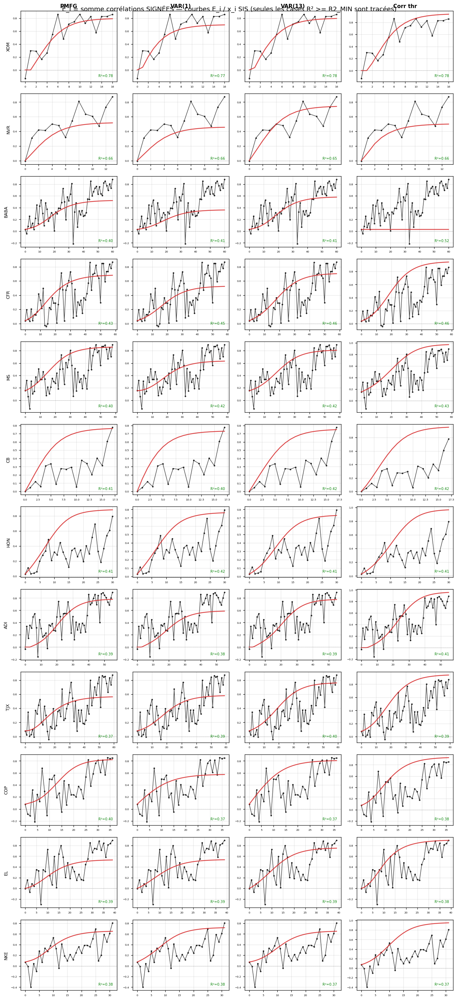

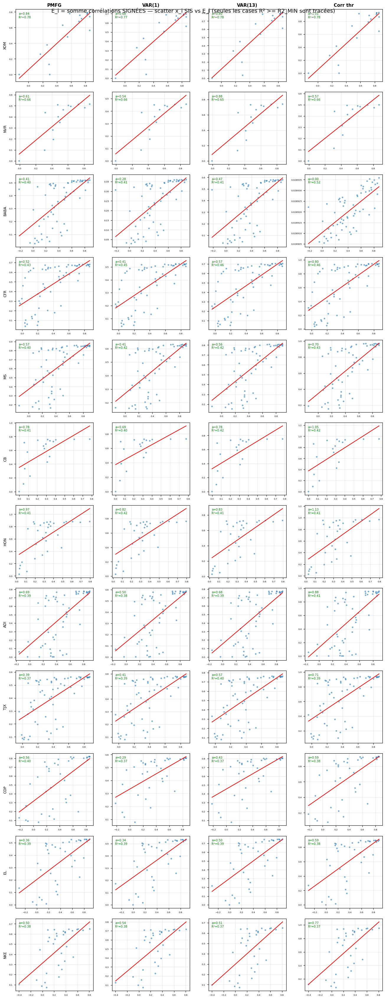

In [25]:
# ── Variante : E_i = somme des corrélations SIGNÉES (sans valeur absolue) ──
# Cellule auto-contenue. On recalcule la CIBLE E_i comme la somme des
# corrélations journalières SANS valeur absolue, ET un état initial x0 lui
# aussi SIGNÉ. Comme un x0 signé fait diverger le SIS standard, on intègre avec
# une dynamique BORNÉE (état clippé dans [0,1] dans le RHS). n_days est cohérent
# entre E_i et la trajectoire (même boucle).
# Matrices comparées : PMFG / VAR(1) / VAR(13) / Corr thr (A_sis standard).

# (1) Cache signé : E_i ET x0 = somme_j C_ij/(N-1) (C signé) ; E_abs pour diag.
asset_cache_s = {}
for gi0, (A0, B0) in rise_windows.items():
    days_p   = list(all_days[A0:B0 + 1])
    data_p   = data[np.isin(data.index.date, days_p)].copy()
    data_p['day'] = data_p.index.date
    days_p_s = sorted(data_p['day'].unique())
    n_days_p = len(days_p_s)
    E_sgn = np.full((N, n_days_p), np.nan)
    E_abs = np.full((N, n_days_p), np.nan)
    for k, d in enumerate(days_p_s):
        chunk = data_p[data_p['day'] == d].drop(columns=['day']).values
        if len(chunk) < 3:
            continue
        C = np.nan_to_num(np.corrcoef(chunk.T), nan=0.0)
        np.fill_diagonal(C, 0)
        E_sgn[:, k] = C.sum(axis=1) / (N - 1)            # cible : SANS abs
        E_abs[:, k] = np.abs(C).sum(axis=1) / (N - 1)    # x0 : AVEC abs (borné)
    valid = np.where(~np.isnan(np.nanmean(E_abs, axis=0)))[0]
    if len(valid) == 0:
        continue
    asset_cache_s[gi0] = dict(E_i=E_sgn[gi0], E_abs=E_abs[gi0],
                              x0=E_sgn[:, valid[0]], n_days=n_days_p)
print(f'{len(asset_cache_s)} actifs (E_i = somme corrélations signées).')

# ── Diagnostic : E_i signé est-il encore croissant (vs |E_i|) ? ────────────
_gs, _ga = [], []
for _gi in asset_cache_s:
    _es = asset_cache_s[_gi]['E_i']; _ea = asset_cache_s[_gi]['E_abs']
    _m = ~np.isnan(_es)
    if _m.sum() < 3:
        continue
    _gs.append(_es[_m][-1] - _es[_m][0])
    _ga.append(_ea[_m][-1] - _ea[_m][0])
_gs, _ga = np.array(_gs), np.array(_ga)
print(f'E_i signé croissant (gain > 0) : {np.mean(_gs > 0):.0%} des actifs ; '
      f'|E_i| : {np.mean(_ga > 0):.0%}.')
print(f'gain médian — signé {np.median(_gs):+.3f}, |.| {np.median(_ga):+.3f}.')

_L = max(len(asset_cache_s[g]['E_i']) for g in asset_cache_s)
def _mean_curve(key):
    """Moyenne sur actifs de la série key, alignée sur le jour relatif."""
    Mq = np.full((len(asset_cache_s), _L), np.nan)
    for r, g in enumerate(asset_cache_s):
        v = asset_cache_s[g][key]; Mq[r, :len(v)] = v
    return np.nanmean(Mq, axis=0)

fig, (a1, a2) = plt.subplots(1, 2, figsize=(11, 4))
a1.plot(_mean_curve('E_abs'), color='black', label='|E_i| (abs)')
a1.plot(_mean_curve('E_i'),  color='#d62728', label='E_i signé')
a1.axhline(0, color='gray', lw=0.6, ls=':')
a1.set_xlabel('jour (depuis début montée)'); a1.set_ylabel('moyenne sur actifs')
a1.set_title('E_i moyen : signé vs |.|'); a1.legend(fontsize=8); a1.grid(alpha=0.3)
a2.scatter(_ga, _gs, s=14, alpha=0.6, color='#1f77b4', edgecolors='none')
_lim = [min(_ga.min(), _gs.min()), max(_ga.max(), _gs.max())]
a2.plot(_lim, _lim, color='gray', lw=0.8, ls='--')
a2.axhline(0, color='gray', lw=0.6, ls=':'); a2.axvline(0, color='gray', lw=0.6, ls=':')
a2.set_xlabel('gain |E_i| (fin - début)'); a2.set_ylabel('gain E_i signé')
a2.set_title('Gain par actif : signé vs |.|'); a2.grid(alpha=0.3)
plt.tight_layout(); plt.show()

# Dynamique SIS BORNÉE : on clippe l'état dans [0,1] dans le terme de droite,
# indispensable avec un x0 signé (sinon les composantes < 0 font diverger LSODA).
def ode_sis_bounded(t, x, A, B, R):
    """SIS avec état clippé dans [0,1] dans le RHS (borné malgré un x0 signé)."""
    xc = np.clip(x, 0.0, 1.0)
    return -B * xc + R * (1.0 - xc) * (A @ xc)

# (2) intégration SIS depuis x0 signé, via la dynamique bornée
def integrate_signed(gi, A_model):
    """Trajectoire x_i SIS depuis x0 SIGNÉ (asset_cache_s), dynamique bornée.

    Parameters
    ----------
    gi : int
        Indice global de l'actif.
    A_model : ndarray
        Matrice d'adjacence N x N du SIS.

    Returns
    -------
    ndarray
        Trajectoire x_i SIS de longueur n_days (cohérente avec E_i signé).
    """
    d = asset_cache_s[gi]
    x0, n_days_p = d['x0'], d['n_days']
    sol_eq = solve_ivp(ode_sis_bounded, (0, T_long), x0, args=(A_model, B_fit, R_fit),
                       method='LSODA', rtol=1e-6, atol=1e-9)
    x_eq = sol_eq.y[gi, -1]
    t_probe = np.linspace(1e-3, T_long, 5000)
    sol_pr  = solve_ivp(ode_sis_bounded, (0, T_long), x0, args=(A_model, B_fit, R_fit),
                        t_eval=t_probe, method='LSODA', rtol=1e-6, atol=1e-9)
    above   = np.where(sol_pr.y[gi] >= (1 - tol_eq) * x_eq)[0]
    T_conv  = float(t_probe[above[0]]) if len(above) else T_long
    sol_p   = solve_ivp(ode_sis_bounded, (0, T_conv), x0, args=(A_model, B_fit, R_fit),
                        t_eval=np.linspace(0, T_conv, n_days_p), method='LSODA')
    return np.clip(sol_p.y[gi], 1e-8, 1 - 1e-8)

# (3) fits par matrice contre E_i signé
def fit_signed(A_model):
    """Régression x_i SIS vs E_i signé par actif pour une matrice donnée."""
    pa, sl = {}, {}
    for gi in asset_cache_s:
        E_i    = asset_cache_s[gi]['E_i']
        x_traj = integrate_signed(gi, A_model)
        pa[gi] = (E_i, x_traj)
        ok = ~np.isnan(E_i)
        if ok.sum() < 3:
            continue
        fit = linregress(E_i[ok], x_traj[ok])
        sl[gi] = dict(slope=fit.slope, intercept=fit.intercept,
                      stderr=fit.stderr, r2=fit.rvalue ** 2, n=int(ok.sum()))
    return pa, sl

fits_s = {m: fit_signed(A_sis[m]) for m in SIS_MODELS}

def r2_s(m, gi):
    """R² de l'actif gi pour la matrice m (E_i signé ; nan si non régressé)."""
    sl = fits_s[m][1]
    return sl[gi]['r2'] if gi in sl else np.nan

def passes_s(m, gi):
    """True si l'actif gi atteint R² >= R2_MIN (E_i signé) pour la matrice m."""
    r2 = r2_s(m, gi)
    return (not np.isnan(r2)) and r2 >= R2_MIN

for m in SIS_MODELS:
    print(f'{m} : {sum(passes_s(m, gi) for gi in asset_cache_s)} actifs avec R² >= {R2_MIN}')

assets_s = [gi for gi in asset_cache_s if any(passes_s(m, gi) for m in SIS_MODELS)]
assets_s.sort(key=lambda gi: -max(np.nan_to_num(r2_s(m, gi)) for m in SIS_MODELS))
assets_s = assets_s[:12]
nA, nM = len(assets_s), len(SIS_MODELS)
print(f'{nA} actifs affichés (R² >= {R2_MIN} pour >= 1 matrice).')

# ── (1) Courbes E_i (signé) et x_i SIS ────────────────────────────────────
fig, axes = plt.subplots(nA, nM, figsize=(3.0 * nM, 2.2 * nA), squeeze=False)
for i, gi in enumerate(assets_s):
    for j, m in enumerate(SIS_MODELS):
        ax = axes[i, j]
        if i == 0:
            ax.set_title(m, fontsize=10, fontweight='bold')
        if j == 0:
            ax.set_ylabel(asset_names[gi], fontsize=8)
        if not passes_s(m, gi):
            ax.set_xticks([]); ax.set_yticks([])
            ax.text(0.5, 0.5, '—', transform=ax.transAxes, ha='center',
                    va='center', color='lightgray', fontsize=14)
            continue
        E_i, x_traj = fits_s[m][0][gi]
        ok = ~np.isnan(E_i); t = np.arange(len(E_i))
        ax.plot(t[ok], E_i[ok], color='black', marker='o', markersize=2,
                linewidth=1.0, alpha=0.7)
        ax.plot(t, x_traj, color='#d62728', linewidth=1.6, alpha=0.85)
        ax.axhline(0, color='gray', linewidth=0.6, linestyle=':')
        ax.text(0.96, 0.06, f'R²={r2_s(m, gi):.2f}', transform=ax.transAxes,
                ha='right', va='bottom', fontsize=6.5, color='green')
        ax.tick_params(labelsize=5); ax.grid(alpha=0.3)
plt.suptitle('E_i = somme corrélations SIGNÉES — courbes E_i / x_i SIS '
             '(seules les cases R² >= R2_MIN sont tracées)', fontsize=12)
plt.tight_layout(); plt.show()

# ── (2) Scatter x_i SIS vs E_i (signé) ────────────────────────────────────
fig, axes = plt.subplots(nA, nM, figsize=(3.0 * nM, 2.6 * nA), squeeze=False)
for i, gi in enumerate(assets_s):
    for j, m in enumerate(SIS_MODELS):
        ax = axes[i, j]
        if i == 0:
            ax.set_title(m, fontsize=10, fontweight='bold')
        if j == 0:
            ax.set_ylabel(asset_names[gi], fontsize=8)
        if not passes_s(m, gi):
            ax.set_xticks([]); ax.set_yticks([])
            ax.text(0.5, 0.5, '—', transform=ax.transAxes, ha='center',
                    va='center', color='lightgray', fontsize=14)
            continue
        E_i, x_traj = fits_s[m][0][gi]
        ok = ~np.isnan(E_i); s = fits_s[m][1][gi]
        ax.scatter(E_i[ok], x_traj[ok], s=12, color='#1f77b4', alpha=0.6,
                   edgecolors='none')
        xs = np.linspace(E_i[ok].min(), E_i[ok].max(), 50)
        ax.plot(xs, s['slope'] * xs + s['intercept'], color='red', linewidth=1.4)
        ax.text(0.04, 0.96, f"a={s['slope']:.2f}\nR²={s['r2']:.2f}",
                transform=ax.transAxes, ha='left', va='top', fontsize=6.5,
                color='green')
        ax.tick_params(labelsize=5); ax.grid(alpha=0.3)
plt.suptitle('E_i = somme corrélations SIGNÉES — scatter x_i SIS vs E_i '
             '(seules les cases R² >= R2_MIN sont tracées)', fontsize=12)
plt.tight_layout(); plt.show()

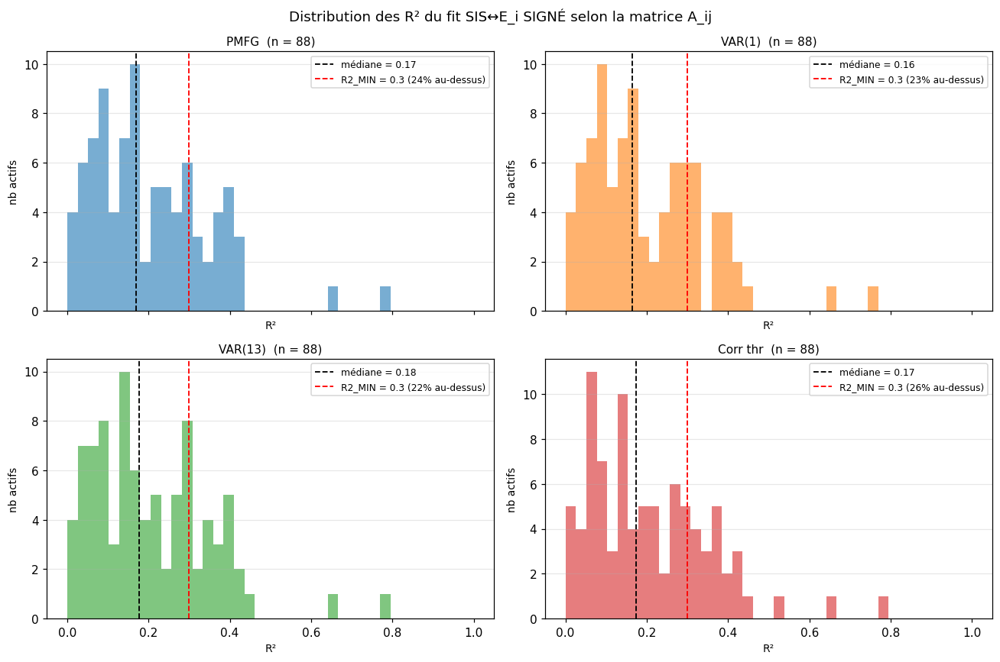

In [26]:
# ── Distribution des R² par méthode — E_i SIGNÉ ───────────────────────────
# Reprend fits_s (cellule E_i signé) : un histogramme des R² du fit x_i SIS vs
# E_i signé par actif, un sous-plot par matrice. R2_MIN = seuil de sélection.
r2_by_model_signed = {m: np.array([s['r2'] for s in fits_s[m][1].values()])
                      for m in SIS_MODELS}

colors = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728']
bins   = np.linspace(0, 1, 40)
fig, axes = plt.subplots(2, 2, figsize=(12, 8), sharex=True)
axes = axes.flatten()
for ax, m, c in zip(axes, SIS_MODELS, colors):
    r2   = r2_by_model_signed[m]
    frac = np.mean(r2 >= R2_MIN) if len(r2) else np.nan
    ax.hist(r2, bins=bins, color=c, alpha=0.6)
    if len(r2):
        ax.axvline(np.median(r2), color='black', linestyle='--', linewidth=1.2,
                   label=f'médiane = {np.median(r2):.2f}')
    ax.axvline(R2_MIN, color='red', linestyle='--', linewidth=1.2,
               label=f'R2_MIN = {R2_MIN} ({frac:.0%} au-dessus)')
    ax.set_title(f'{m}  (n = {len(r2)})', fontsize=10)
    ax.set_xlabel('R²', fontsize=9); ax.set_ylabel('nb actifs', fontsize=9)
    ax.legend(fontsize=8); ax.grid(alpha=0.3, axis='y')
plt.suptitle('Distribution des R² du fit SIS↔E_i SIGNÉ selon la matrice A_ij',
             fontsize=12)
plt.tight_layout(); plt.show()

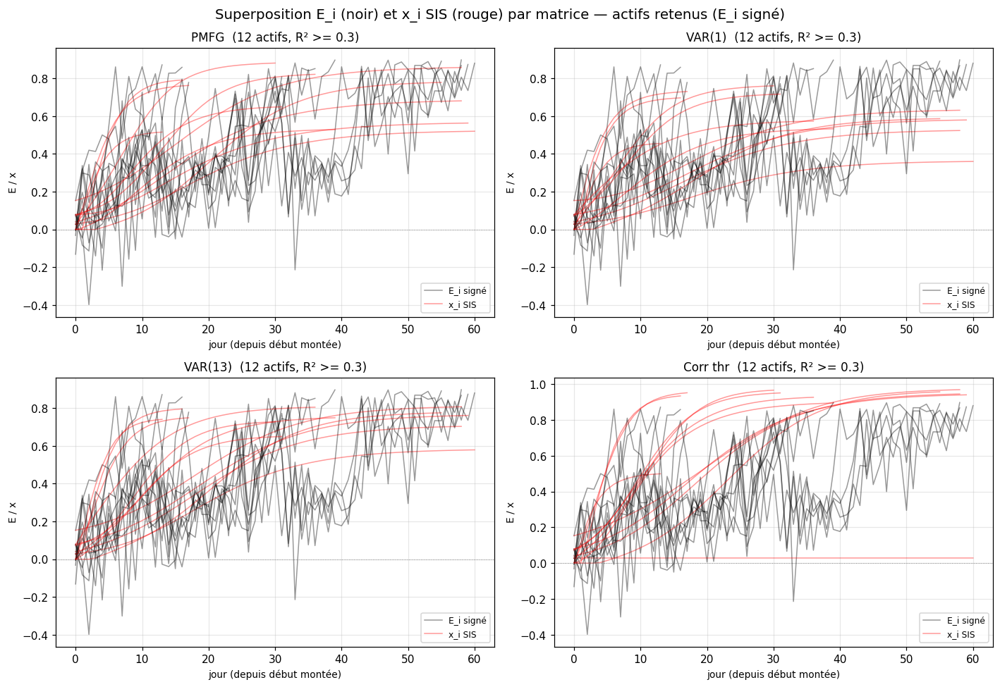

In [27]:
# ── Spaghetti : par matrice, E_i (noir) et x_i SIS (rouge) des actifs retenus ─
# Un sous-plot par matrice (PMFG / VAR(1) / VAR(13) / Corr thr). On superpose,
# pour chaque actif retenu (R² >= R2_MIN), son E_i signé (noir) et sa trajectoire
# x_i SIS (rouge), avec transparence. Réutilise fits_s / passes_s / assets_s.
fig, axes = plt.subplots(2, 2, figsize=(13, 9))
axes = axes.flatten()
for ax, m in zip(axes, SIS_MODELS):
    kept = [gi for gi in assets_s if passes_s(m, gi)]
    for k, gi in enumerate(kept):
        E_i, x_traj = fits_s[m][0][gi]
        ok = ~np.isnan(E_i)
        ax.plot(np.arange(len(E_i))[ok], E_i[ok], color='black', alpha=0.4,
                linewidth=1.0, label='E_i signé' if k == 0 else None)
        ax.plot(np.arange(len(x_traj)), x_traj, color='red', alpha=0.4,
                linewidth=1.0, label='x_i SIS' if k == 0 else None)
    ax.axhline(0, color='gray', lw=0.6, ls=':')
    ax.set_title(f'{m}  ({len(kept)} actifs, R² >= {R2_MIN})', fontsize=11)
    ax.set_xlabel('jour (depuis début montée)', fontsize=9)
    ax.set_ylabel('E / x', fontsize=9)
    ax.grid(alpha=0.3)
    if kept:
        ax.legend(fontsize=8, loc='best')
plt.suptitle('Superposition E_i (noir) et x_i SIS (rouge) par matrice — '
             'actifs retenus (E_i signé)', fontsize=13)
plt.tight_layout(); plt.show()

Période #1 : 2022-08-03 -> 2022-10-04 (44 j).
78 actifs avec sous-courbe croissante sur cette période.


PMFG : 16 actifs avec R² >= 0.3
VAR(1) : 13 actifs avec R² >= 0.3
VAR(13) : 14 actifs avec R² >= 0.3
Corr thr : 16 actifs avec R² >= 0.3
12 actifs retenus -> courbes + spaghettis.


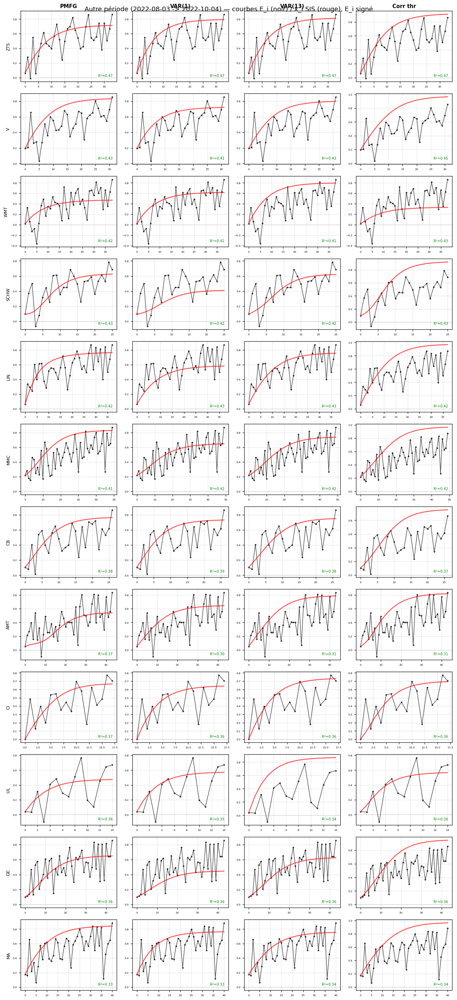

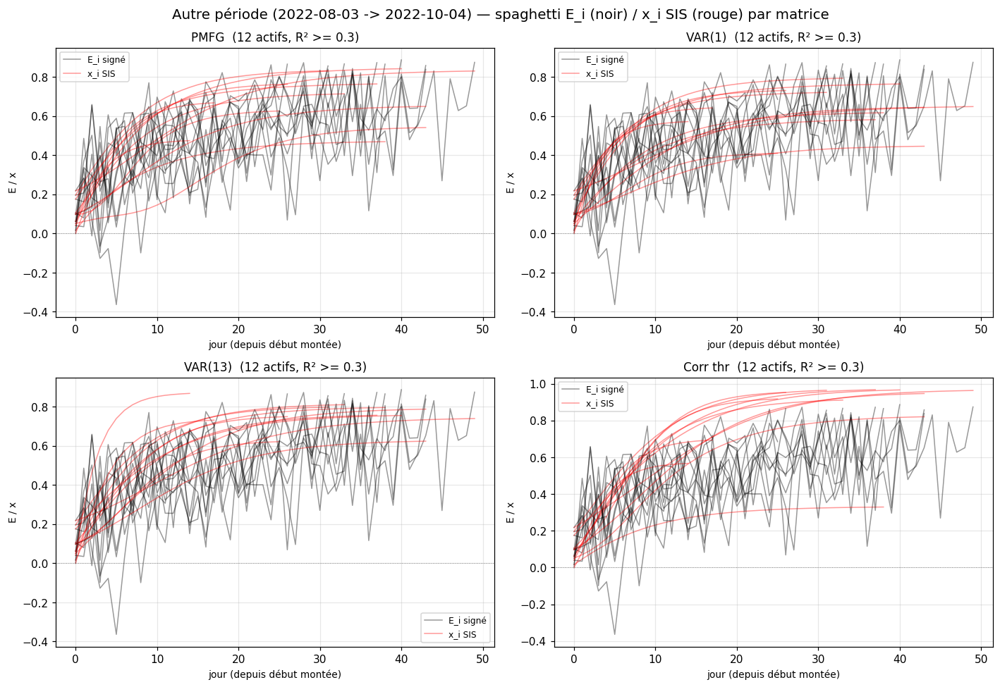

In [28]:
# ── Même démarche (E_i signé, filtre R²) sur une AUTRE période ─────────────
# Cellule auto-contenue. On rejoue : sous-période de forte montée par actif ->
# cache E_i signé + x0 signé -> fits SIS par matrice -> filtre R² -> courbes &
# spaghettis, mais sur une autre fenêtre montante détectée (par défaut la 2e
# plus longue). Réutilise intervals_chrono / crisis_map / E_daily_all /
# asset_runs / data / all_days / A_sis / SIS_MODELS / build_filtered_corr /
# R2_MIN / CORR_THRESHOLD / B_fit / R_fit / T_long / tol_eq.
PERIOD_RANK   = 1     # 0 = plus longue (déjà étudiée), 1 = 2e plus longue, ...
SMOOTH2, MIN_LEN, MIN_GAIN = 2, 10, 0.5   # mêmes réglages que strong_rise

# (0) Choix de la période : k-ième plus longue fenêtre de intervals_chrono
_order = sorted(range(len(intervals_chrono)),
                key=lambda i: -(intervals_chrono[i][1] - intervals_chrono[i][0]))
if PERIOD_RANK >= len(_order):
    PERIOD_RANK = len(_order) - 1
pa2, pb2 = intervals_chrono[_order[PERIOD_RANK]]
print(f'Période #{PERIOD_RANK} : {all_days[pa2]} -> {all_days[pb2]} '
      f'({pb2 - pa2 + 1} j).')

# Dynamique SIS bornée (clip dans [0,1]) -> stable malgré un x0 signé
def ode_sis_bounded(t, x, A, B, R):
    """SIS avec état clippé dans [0,1] dans le RHS (borné malgré un x0 signé)."""
    xc = np.clip(x, 0.0, 1.0)
    return -B * xc + R * (1.0 - xc) * (A @ xc)

def strong_rise2(y, smooth=SMOOTH2, min_len=MIN_LEN, min_gain=MIN_GAIN):
    """Plus longue fenêtre de forte montée d'une série (cf. strong_rise)."""
    ys  = uniform_filter1d(y, size=smooth, mode='nearest')
    best, m = None, len(y)
    for s in range(m):
        for e in range(s + min_len - 1, m):
            gain = ys[e] - ys[s]
            if gain >= min_gain:
                cand = (e - s + 1, gain, s, e)
                if best is None or (cand[0], cand[1]) > (best[0], best[1]):
                    best = cand
    return best

# (1) Sous-périodes de montée propre par actif sur la nouvelle fenêtre
rise_windows2 = {}
for gi in range(N):
    win = None
    for a, b in asset_runs(crisis_map[gi]):
        if b >= pa2 and a <= pb2:
            win = (a, b); break
    if win is None:
        continue
    res = strong_rise2(E_daily_all[gi, win[0]:win[1] + 1])
    if res is not None:
        _, _, s2, e2 = res
        rise_windows2[gi] = (win[0] + s2, win[0] + e2)
print(f'{len(rise_windows2)} actifs avec sous-courbe croissante sur cette période.')

# (2) Cache signé : E_i ET x0 = somme_j C_ij/(N-1) (C signé) ; E_abs pour info
asset_cache_s2 = {}
for gi0, (A0, B0) in rise_windows2.items():
    days_p   = list(all_days[A0:B0 + 1])
    data_p   = data[np.isin(data.index.date, days_p)].copy()
    data_p['day'] = data_p.index.date
    days_p_s = sorted(data_p['day'].unique())
    n_days_p = len(days_p_s)
    E_sgn = np.full((N, n_days_p), np.nan)
    E_abs = np.full((N, n_days_p), np.nan)
    for k, d in enumerate(days_p_s):
        chunk = data_p[data_p['day'] == d].drop(columns=['day']).values
        if len(chunk) < 3:
            continue
        C = np.nan_to_num(np.corrcoef(chunk.T), nan=0.0)
        np.fill_diagonal(C, 0)
        E_sgn[:, k] = C.sum(axis=1) / (N - 1)
        E_abs[:, k] = np.abs(C).sum(axis=1) / (N - 1)
    valid = np.where(~np.isnan(np.nanmean(E_abs, axis=0)))[0]
    if len(valid) == 0:
        continue
    asset_cache_s2[gi0] = dict(E_i=E_sgn[gi0], E_abs=E_abs[gi0],
                               x0=E_sgn[:, valid[0]], n_days=n_days_p)

def integrate_s2(gi, A_model):
    """Trajectoire x_i SIS depuis x0 signé (asset_cache_s2), dynamique bornée."""
    d = asset_cache_s2[gi]
    x0, n_days_p = d['x0'], d['n_days']
    sol_eq = solve_ivp(ode_sis_bounded, (0, T_long), x0, args=(A_model, B_fit, R_fit),
                       method='LSODA', rtol=1e-6, atol=1e-9)
    x_eq = sol_eq.y[gi, -1]
    t_probe = np.linspace(1e-3, T_long, 5000)
    sol_pr  = solve_ivp(ode_sis_bounded, (0, T_long), x0, args=(A_model, B_fit, R_fit),
                        t_eval=t_probe, method='LSODA', rtol=1e-6, atol=1e-9)
    above   = np.where(sol_pr.y[gi] >= (1 - tol_eq) * x_eq)[0]
    T_conv  = float(t_probe[above[0]]) if len(above) else T_long
    sol_p   = solve_ivp(ode_sis_bounded, (0, T_conv), x0, args=(A_model, B_fit, R_fit),
                        t_eval=np.linspace(0, T_conv, n_days_p), method='LSODA')
    return np.clip(sol_p.y[gi], 1e-8, 1 - 1e-8)

def fit_s2(A_model):
    """Régression x_i SIS vs E_i signé par actif pour une matrice."""
    pa, sl = {}, {}
    for gi in asset_cache_s2:
        E_i    = asset_cache_s2[gi]['E_i']
        x_traj = integrate_s2(gi, A_model)
        pa[gi] = (E_i, x_traj)
        ok = ~np.isnan(E_i)
        if ok.sum() < 3:
            continue
        fit = linregress(E_i[ok], x_traj[ok])
        sl[gi] = dict(slope=fit.slope, intercept=fit.intercept,
                      stderr=fit.stderr, r2=fit.rvalue ** 2, n=int(ok.sum()))
    return pa, sl

# (3) fits par matrice + filtre R²
A_sis['Corr thr'] = build_filtered_corr(CORR_THRESHOLD)
fits2 = {m: fit_s2(A_sis[m]) for m in SIS_MODELS}

def r2_2(m, gi):
    sl = fits2[m][1]
    return sl[gi]['r2'] if gi in sl else np.nan

def passes_2(m, gi):
    r2 = r2_2(m, gi)
    return (not np.isnan(r2)) and r2 >= R2_MIN

for m in SIS_MODELS:
    print(f'{m} : {sum(passes_2(m, gi) for gi in asset_cache_s2)} actifs avec R² >= {R2_MIN}')

assets2 = [gi for gi in asset_cache_s2 if any(passes_2(m, gi) for m in SIS_MODELS)]
assets2.sort(key=lambda gi: -max(np.nan_to_num(r2_2(m, gi)) for m in SIS_MODELS))
assets2 = assets2[:12]

# (4) Affichage SEULEMENT si des actifs satisfont toutes les conditions
if not assets2:
    print(f'Aucun actif ne satisfait R² >= {R2_MIN} sur la période '
          f'{all_days[pa2]} -> {all_days[pb2]} : rien à tracer.')
else:
    print(f'{len(assets2)} actifs retenus -> courbes + spaghettis.')
    nA, nM = len(assets2), len(SIS_MODELS)

    # (4a) Courbes par (actif, matrice) : seules les cases R² >= R2_MIN tracées
    fig, axes = plt.subplots(nA, nM, figsize=(3.0 * nM, 2.2 * nA), squeeze=False)
    for i, gi in enumerate(assets2):
        for j, m in enumerate(SIS_MODELS):
            ax = axes[i, j]
            if i == 0:
                ax.set_title(m, fontsize=10, fontweight='bold')
            if j == 0:
                ax.set_ylabel(asset_names[gi], fontsize=8)
            if not passes_2(m, gi):
                ax.set_xticks([]); ax.set_yticks([])
                ax.text(0.5, 0.5, '—', transform=ax.transAxes, ha='center',
                        va='center', color='lightgray', fontsize=14)
                continue
            E_i, x_traj = fits2[m][0][gi]
            ok = ~np.isnan(E_i); t = np.arange(len(E_i))
            ax.plot(t[ok], E_i[ok], color='black', alpha=0.7, marker='o',
                    markersize=2, linewidth=1.0)
            ax.plot(t, x_traj, color='red', alpha=0.7, linewidth=1.6)
            ax.axhline(0, color='gray', lw=0.6, ls=':')
            ax.text(0.96, 0.06, f'R²={r2_2(m, gi):.2f}', transform=ax.transAxes,
                    ha='right', va='bottom', fontsize=6.5, color='green')
            ax.tick_params(labelsize=5); ax.grid(alpha=0.3)
    plt.suptitle(f'Autre période ({all_days[pa2]} -> {all_days[pb2]}) — courbes '
                 f'E_i (noir) / x_i SIS (rouge), E_i signé', fontsize=12)
    plt.tight_layout(); plt.show()

    # (4b) Spaghetti par matrice : E_i (noir) et x_i SIS (rouge), transparence
    fig, axes = plt.subplots(2, 2, figsize=(13, 9))
    axes = axes.flatten()
    for ax, m in zip(axes, SIS_MODELS):
        kept = [gi for gi in assets2 if passes_2(m, gi)]
        for k, gi in enumerate(kept):
            E_i, x_traj = fits2[m][0][gi]
            ok = ~np.isnan(E_i)
            ax.plot(np.arange(len(E_i))[ok], E_i[ok], color='black', alpha=0.4,
                    linewidth=1.0, label='E_i signé' if k == 0 else None)
            ax.plot(np.arange(len(x_traj)), x_traj, color='red', alpha=0.4,
                    linewidth=1.0, label='x_i SIS' if k == 0 else None)
        ax.axhline(0, color='gray', lw=0.6, ls=':')
        ax.set_title(f'{m}  ({len(kept)} actifs, R² >= {R2_MIN})', fontsize=11)
        ax.set_xlabel('jour (depuis début montée)', fontsize=9)
        ax.set_ylabel('E / x', fontsize=9)
        ax.grid(alpha=0.3)
        if kept:
            ax.legend(fontsize=8, loc='best')
    plt.suptitle(f'Autre période ({all_days[pa2]} -> {all_days[pb2]}) — spaghetti '
                 f'E_i (noir) / x_i SIS (rouge) par matrice', fontsize=13)
    plt.tight_layout(); plt.show()

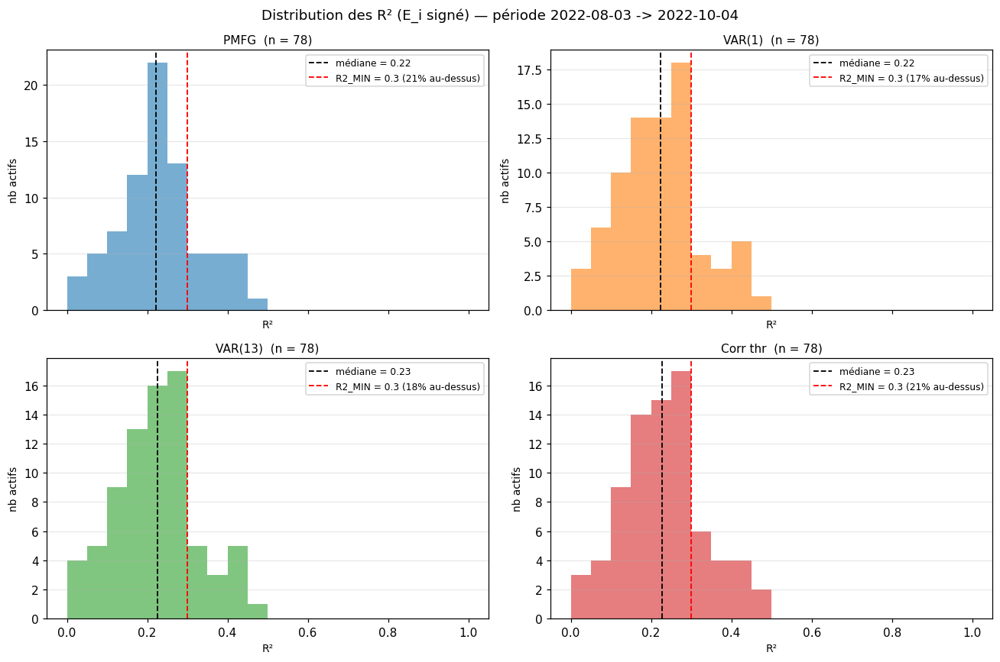

In [29]:
# ── Distribution des R² par méthode — autre période (E_i signé) ───────────
# Reprend fits2 (cellule other_period_signed) : un histogramme des R² du fit
# x_i SIS vs E_i signé par actif, un sous-plot par matrice. R2_MIN = seuil.
r2_by_model_p2 = {m: np.array([s['r2'] for s in fits2[m][1].values()])
                  for m in SIS_MODELS}

colors = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728']
bins   = np.linspace(0, 1, 21)
fig, axes = plt.subplots(2, 2, figsize=(12, 8), sharex=True)
axes = axes.flatten()
for ax, m, c in zip(axes, SIS_MODELS, colors):
    r2   = r2_by_model_p2[m]
    frac = np.mean(r2 >= R2_MIN) if len(r2) else np.nan
    ax.hist(r2, bins=bins, color=c, alpha=0.6)
    if len(r2):
        ax.axvline(np.median(r2), color='black', linestyle='--', linewidth=1.2,
                   label=f'médiane = {np.median(r2):.2f}')
    ax.axvline(R2_MIN, color='red', linestyle='--', linewidth=1.2,
               label=f'R2_MIN = {R2_MIN} ({frac:.0%} au-dessus)')
    ax.set_title(f'{m}  (n = {len(r2)})', fontsize=10)
    ax.set_xlabel('R²', fontsize=9); ax.set_ylabel('nb actifs', fontsize=9)
    ax.legend(fontsize=8); ax.grid(alpha=0.3, axis='y')
plt.suptitle(f'Distribution des R² (E_i signé) — période {all_days[pa2]} -> '
             f'{all_days[pb2]}', fontsize=12)
plt.tight_layout(); plt.show()

[0] 2019-04-01→2019-05-13 (n=72) : PMFG 0.35, VAR(1) 0.35, VAR(13) 0.36, Corr thr 0.36
[1] 2019-07-16→2019-08-05 (n=38) : PMFG 0.31, VAR(1) 0.31, VAR(13) 0.32, Corr thr 0.32
[2] 2019-09-11→2019-10-11 (n=32) : PMFG 0.37, VAR(1) 0.37, VAR(13) 0.38, Corr thr 0.38
[3] 2019-10-30→2019-12-03 (n=6) : PMFG 0.11, VAR(1) 0.11, VAR(13) 0.11, Corr thr 0.09
[4] 2019-12-19→2020-03-09 (n=88) : PMFG 0.20, VAR(1) 0.20, VAR(13) 0.21, Corr thr 0.21
[5] 2020-05-28→2020-06-12 (n=94) : PMFG 0.19, VAR(1) 0.19, VAR(13) 0.19, Corr thr 0.20
[6] 2020-08-06→2020-09-21 (n=5) : PMFG 0.18, VAR(1) 0.16, VAR(13) 0.16, Corr thr 0.16
[7] 2020-10-13→2020-10-28 (n=25) : PMFG 0.23, VAR(1) 0.23, VAR(13) 0.23, Corr thr 0.23
[8] 2020-12-02→2020-12-21 (n=1) : PMFG 0.08, VAR(1) 0.08, VAR(13) 0.08, Corr thr 0.08
[9] 2020-12-31→2021-01-27 (n=5) : PMFG 0.06, VAR(1) 0.06, VAR(13) 0.06, Corr thr 0.06
[10] 2021-02-09→2021-03-01 (n=12) : PMFG 0.17, VAR(1) 0.17, VAR(13) 0.17, Corr thr 0.19
[11] 2021-03-23→2021-05-19 (n=8) : PMFG 0.23, 

/home/farmachidi/miniconda3/envs/ai-env/lib/python3.10/site-packages/numpy/lib/_function_base_impl.py:3045: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
/home/farmachidi/miniconda3/envs/ai-env/lib/python3.10/site-packages/numpy/lib/_function_base_impl.py:3046: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
/home/farmachidi/miniconda3/envs/ai-env/lib/python3.10/site-packages/numpy/lib/_function_base_impl.py:3045: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
/home/farmachidi/miniconda3/envs/ai-env/lib/python3.10/site-packages/numpy/lib/_function_base_impl.py:3046: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


[21] 2022-12-12→2022-12-30 (n=13) : PMFG 0.22, VAR(1) 0.22, VAR(13) 0.22, Corr thr 0.22


/home/farmachidi/miniconda3/envs/ai-env/lib/python3.10/site-packages/numpy/lib/_function_base_impl.py:3045: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
/home/farmachidi/miniconda3/envs/ai-env/lib/python3.10/site-packages/numpy/lib/_function_base_impl.py:3046: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
/home/farmachidi/miniconda3/envs/ai-env/lib/python3.10/site-packages/numpy/lib/_function_base_impl.py:3045: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
/home/farmachidi/miniconda3/envs/ai-env/lib/python3.10/site-packages/numpy/lib/_function_base_impl.py:3046: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
/home/farmachidi/miniconda3/envs/ai-env/lib/python3.10/site-packages/numpy/lib/_function_base_impl.py:3045: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
/home/farmachidi/miniconda3/envs/ai-env/lib/python3.10/site-packages/numpy/lib/_funct

[22] 2023-01-10→2023-02-24 (n=37) : PMFG 0.15, VAR(1) 0.15, VAR(13) 0.15, Corr thr 0.15


/home/farmachidi/miniconda3/envs/ai-env/lib/python3.10/site-packages/numpy/lib/_function_base_impl.py:3045: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
/home/farmachidi/miniconda3/envs/ai-env/lib/python3.10/site-packages/numpy/lib/_function_base_impl.py:3046: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
/home/farmachidi/miniconda3/envs/ai-env/lib/python3.10/site-packages/numpy/lib/_function_base_impl.py:3045: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
/home/farmachidi/miniconda3/envs/ai-env/lib/python3.10/site-packages/numpy/lib/_function_base_impl.py:3046: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
/home/farmachidi/miniconda3/envs/ai-env/lib/python3.10/site-packages/numpy/lib/_function_base_impl.py:3045: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
/home/farmachidi/miniconda3/envs/ai-env/lib/python3.10/site-packages/numpy/lib/_funct

[23] 2023-02-28→2023-03-22 (n=27) : PMFG 0.22, VAR(1) 0.22, VAR(13) 0.22, Corr thr 0.22

                               PMFG  VAR(1)  VAR(13)  Corr thr
2019-04-01→2019-05-13 (n=72)  0.350   0.347    0.364     0.363
2019-07-16→2019-08-05 (n=38)  0.315   0.310    0.319     0.318
2019-09-11→2019-10-11 (n=32)  0.369   0.374    0.379     0.381
2019-10-30→2019-12-03 (n=6)   0.114   0.110    0.113     0.094
2019-12-19→2020-03-09 (n=88)  0.205   0.202    0.206     0.206
2020-05-28→2020-06-12 (n=94)  0.194   0.187    0.192     0.196
2020-08-06→2020-09-21 (n=5)   0.184   0.155    0.157     0.161
2020-10-13→2020-10-28 (n=25)  0.230   0.230    0.232     0.229
2020-12-02→2020-12-21 (n=1)   0.078   0.078    0.077     0.078
2020-12-31→2021-01-27 (n=5)   0.063   0.063    0.064     0.063
2021-02-09→2021-03-01 (n=12)  0.173   0.172    0.174     0.187
2021-03-23→2021-05-19 (n=8)   0.227   0.226    0.233     0.236
2021-06-29→2021-07-19 (n=3)   0.079   0.075    0.074     0.081
2021-08-10→2021-10-07 (n=39) 

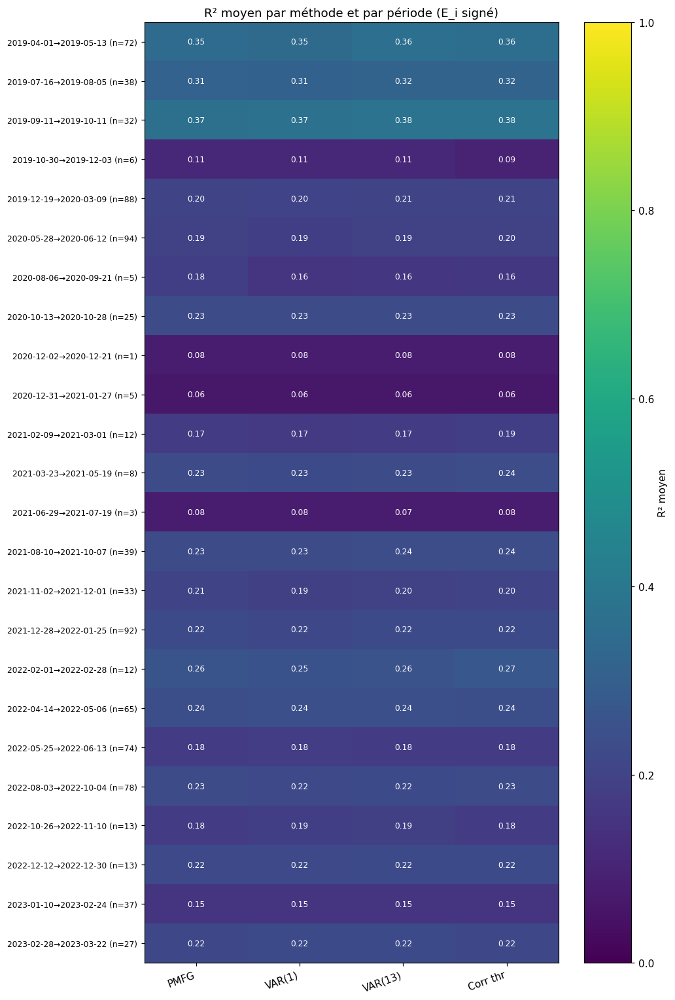

In [30]:
# ── R² moyen par méthode et par période (E_i signé) ───────────────────────
# Pour CHAQUE période croissante de intervals_chrono : on retrouve les sous-
# périodes de forte montée par actif, on construit le cache E_i signé, on
# ajuste x_i SIS par matrice, et on moyenne le R² sur les actifs. Résultat :
# tableau + heatmap (lignes = périodes, colonnes = matrices). ATTENTION : balaie
# toutes les périodes x tous les actifs x 4 matrices -> peut être long.
SMOOTH2, MIN_LEN, MIN_GAIN = 2, 10, 0.5

def _ode_bounded(t, x, A, B, R):
    """SIS borné (état clippé dans [0,1]) pour rester stable avec x0 signé."""
    xc = np.clip(x, 0.0, 1.0)
    return -B * xc + R * (1.0 - xc) * (A @ xc)

def _strong_rise(y, smooth=SMOOTH2, min_len=MIN_LEN, min_gain=MIN_GAIN):
    """Plus longue fenêtre de forte montée d'une série (cf. strong_rise)."""
    ys, best, m = uniform_filter1d(y, size=smooth, mode='nearest'), None, len(y)
    for s in range(m):
        for e in range(s + min_len - 1, m):
            gain = ys[e] - ys[s]
            if gain >= min_gain:
                cand = (e - s + 1, gain, s, e)
                if best is None or (cand[0], cand[1]) > (best[0], best[1]):
                    best = cand
    return best

def _cache_signed(pa, pb):
    """Cache {gi: (E_i signé, x0 signé, n_days)} sur la période (pa, pb)."""
    rw = {}
    for gi in range(N):
        win = None
        for a, b in asset_runs(crisis_map[gi]):
            if b >= pa and a <= pb:
                win = (a, b); break
        if win is None:
            continue
        res = _strong_rise(E_daily_all[gi, win[0]:win[1] + 1])
        if res is not None:
            _, _, s2, e2 = res
            rw[gi] = (win[0] + s2, win[0] + e2)
    cache = {}
    for gi0, (A0, B0) in rw.items():
        days_p   = list(all_days[A0:B0 + 1])
        data_p   = data[np.isin(data.index.date, days_p)].copy()
        data_p['day'] = data_p.index.date
        days_p_s = sorted(data_p['day'].unique())
        n_days_p = len(days_p_s)
        Es = np.full((N, n_days_p), np.nan)
        Ea = np.full((N, n_days_p), np.nan)
        for k, d in enumerate(days_p_s):
            chunk = data_p[data_p['day'] == d].drop(columns=['day']).values
            if len(chunk) < 3:
                continue
            C = np.nan_to_num(np.corrcoef(chunk.T), nan=0.0)
            np.fill_diagonal(C, 0)
            Es[:, k] = C.sum(axis=1) / (N - 1)
            Ea[:, k] = np.abs(C).sum(axis=1) / (N - 1)
        valid = np.where(~np.isnan(np.nanmean(Ea, axis=0)))[0]
        if len(valid) == 0:
            continue
        cache[gi0] = dict(E_i=Es[gi0], x0=Es[:, valid[0]], n_days=n_days_p)
    return cache

def _integrate(cache, gi, A_model):
    """Trajectoire x_i SIS (x0 signé, dynamique bornée) pour un cache donné."""
    d = cache[gi]; x0, n = d['x0'], d['n_days']
    sol_eq = solve_ivp(_ode_bounded, (0, T_long), x0, args=(A_model, B_fit, R_fit),
                       method='LSODA', rtol=1e-6, atol=1e-9)
    x_eq = sol_eq.y[gi, -1]
    tp = np.linspace(1e-3, T_long, 5000)
    sp = solve_ivp(_ode_bounded, (0, T_long), x0, args=(A_model, B_fit, R_fit),
                   t_eval=tp, method='LSODA', rtol=1e-6, atol=1e-9)
    above = np.where(sp.y[gi] >= (1 - tol_eq) * x_eq)[0]
    Tc = float(tp[above[0]]) if len(above) else T_long
    s = solve_ivp(_ode_bounded, (0, Tc), x0, args=(A_model, B_fit, R_fit),
                  t_eval=np.linspace(0, Tc, n), method='LSODA')
    return np.clip(s.y[gi], 1e-8, 1 - 1e-8)

def _mean_r2_period(pa, pb):
    """R² moyen par matrice (et nb d'actifs) sur la période (pa, pb)."""
    cache = _cache_signed(pa, pb)
    out = {}
    for m in SIS_MODELS:
        A_m, r2s = A_sis[m], []
        for gi in cache:
            E_i = cache[gi]['E_i']; ok = ~np.isnan(E_i)
            if ok.sum() < 3:
                continue
            x_traj = _integrate(cache, gi, A_m)
            r2s.append(linregress(E_i[ok], x_traj[ok]).rvalue ** 2)
        out[m] = float(np.mean(r2s)) if r2s else np.nan
    return len(cache), out

# Balayage de toutes les périodes croissantes
A_sis['Corr thr'] = build_filtered_corr(CORR_THRESHOLD)
rows, mean_r2 = [], np.full((len(intervals_chrono), len(SIS_MODELS)), np.nan)
for pi, (pa, pb) in enumerate(intervals_chrono):
    n_assets, r2d = _mean_r2_period(pa, pb)
    for j, m in enumerate(SIS_MODELS):
        mean_r2[pi, j] = r2d[m]
    rows.append(f'{all_days[pa]}→{all_days[pb]} (n={n_assets})')
    print(f'[{pi}] {rows[-1]} : ' +
          ', '.join(f'{m} {r2d[m]:.2f}' for m in SIS_MODELS))

r2_mean_df = pd.DataFrame(mean_r2, index=rows, columns=SIS_MODELS)
print(); print(r2_mean_df.round(3))

# Heatmap R² moyen (périodes x matrices)
fig, ax = plt.subplots(figsize=(1.6 * len(SIS_MODELS) + 3,
                                0.5 * len(rows) + 2))
im = ax.imshow(mean_r2, aspect='auto', cmap='viridis', vmin=0, vmax=1)
ax.set_xticks(range(len(SIS_MODELS))); ax.set_xticklabels(SIS_MODELS, rotation=20, ha='right')
ax.set_yticks(range(len(rows))); ax.set_yticklabels(rows, fontsize=8)
for i in range(len(rows)):
    for j in range(len(SIS_MODELS)):
        v = mean_r2[i, j]
        if not np.isnan(v):
            ax.text(j, i, f'{v:.2f}', ha='center', va='center',
                    color='white' if v < 0.6 else 'black', fontsize=8)
cb = fig.colorbar(im, ax=ax); cb.set_label('R² moyen')
ax.set_title('R² moyen par méthode et par période (E_i signé)', fontsize=12)
plt.tight_layout(); plt.show()

Période ciblée : 2019-04-01 -> 2019-05-13 (30 j).
72 actifs avec sous-courbe croissante sur cette période.
PMFG : 32 actifs avec R² >= 0.3
VAR(1) : 34 actifs avec R² >= 0.3
VAR(13) : 35 actifs avec R² >= 0.3
Corr thr : 35 actifs avec R² >= 0.3
12 actifs retenus -> courbes + spaghettis.


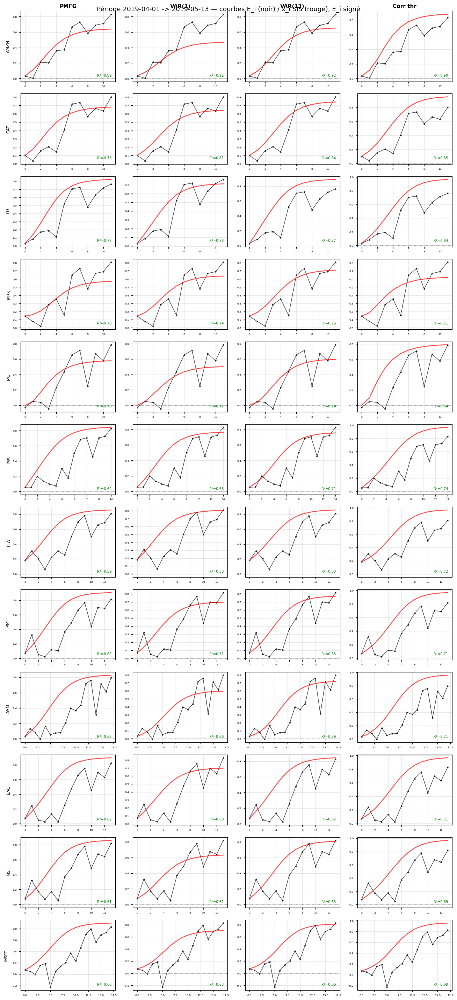

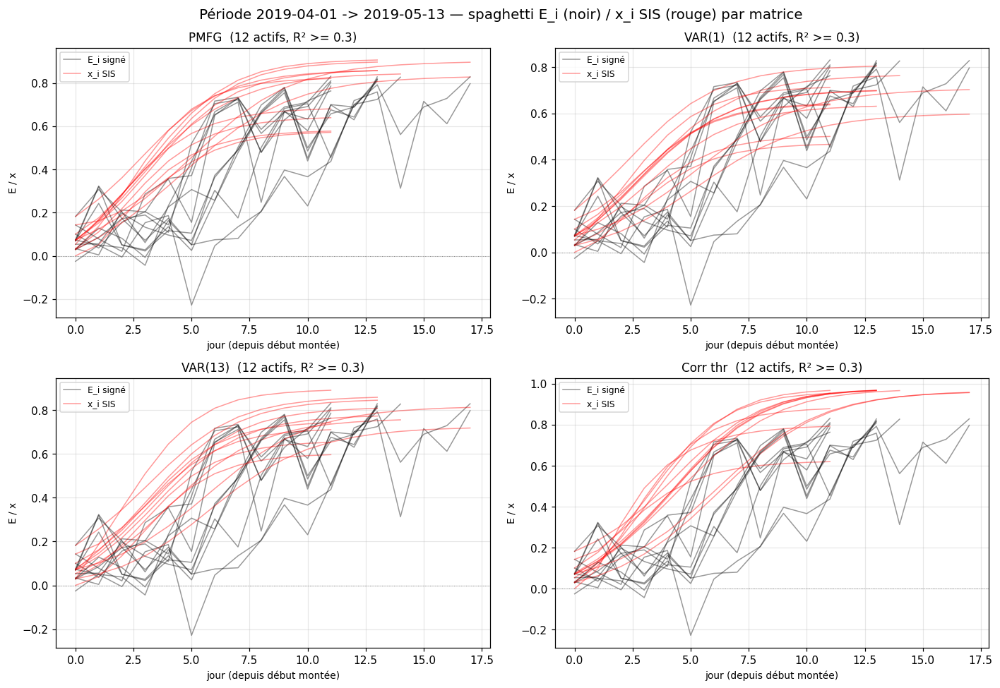

In [31]:
# ── Graphes pour une période précise : 2019-04-01 → 2019-05-13 ─────────────
# Cible la fenêtre par ses dates, rejoue la démarche signée (cache E_i signé,
# fits SIS par matrice, filtre R²) et trace courbes + spaghettis. Réutilise les
# helpers _cache_signed / _integrate (cellule « R² moyen par période ») ; à
# exécuter après celle-ci. Réutilise aussi A_sis / SIS_MODELS / R2_MIN /
# CORR_THRESHOLD / all_days / asset_names.
TARGET = ('2019-04-01', '2019-05-13')

_days_str = np.array([str(d) for d in all_days])
pa_f = int(np.where(_days_str == TARGET[0])[0][0])
pb_f = int(np.where(_days_str == TARGET[1])[0][0])
print(f'Période ciblée : {all_days[pa_f]} -> {all_days[pb_f]} ({pb_f - pa_f + 1} j).')

A_sis['Corr thr'] = build_filtered_corr(CORR_THRESHOLD)
cache_f = _cache_signed(pa_f, pb_f)
print(f'{len(cache_f)} actifs avec sous-courbe croissante sur cette période.')

fits_f = {}
for m in SIS_MODELS:
    A_m, pa_d, sl = A_sis[m], {}, {}
    for gi in cache_f:
        E_i = cache_f[gi]['E_i']
        x_traj = _integrate(cache_f, gi, A_m)
        pa_d[gi] = (E_i, x_traj)
        ok = ~np.isnan(E_i)
        if ok.sum() < 3:
            continue
        fit = linregress(E_i[ok], x_traj[ok])
        sl[gi] = dict(slope=fit.slope, intercept=fit.intercept,
                      stderr=fit.stderr, r2=fit.rvalue ** 2, n=int(ok.sum()))
    fits_f[m] = (pa_d, sl)

def r2_f(m, gi):
    sl = fits_f[m][1]
    return sl[gi]['r2'] if gi in sl else np.nan

def passes_f(m, gi):
    r2 = r2_f(m, gi)
    return (not np.isnan(r2)) and r2 >= R2_MIN

for m in SIS_MODELS:
    print(f'{m} : {sum(passes_f(m, gi) for gi in cache_f)} actifs avec R² >= {R2_MIN}')

assets_f = [gi for gi in cache_f if any(passes_f(m, gi) for m in SIS_MODELS)]
assets_f.sort(key=lambda gi: -max(np.nan_to_num(r2_f(m, gi)) for m in SIS_MODELS))
assets_f = assets_f[:12]

_lab = f'{all_days[pa_f]} -> {all_days[pb_f]}'
if not assets_f:
    print(f'Aucun actif R² >= {R2_MIN} sur {_lab} : rien à tracer.')
else:
    print(f'{len(assets_f)} actifs retenus -> courbes + spaghettis.')
    nA, nM = len(assets_f), len(SIS_MODELS)

    # (1) Courbes par (actif, matrice) : seules les cases R² >= R2_MIN tracées
    fig, axes = plt.subplots(nA, nM, figsize=(3.0 * nM, 2.2 * nA), squeeze=False)
    for i, gi in enumerate(assets_f):
        for j, m in enumerate(SIS_MODELS):
            ax = axes[i, j]
            if i == 0:
                ax.set_title(m, fontsize=10, fontweight='bold')
            if j == 0:
                ax.set_ylabel(asset_names[gi], fontsize=8)
            if not passes_f(m, gi):
                ax.set_xticks([]); ax.set_yticks([])
                ax.text(0.5, 0.5, '—', transform=ax.transAxes, ha='center',
                        va='center', color='lightgray', fontsize=14)
                continue
            E_i, x_traj = fits_f[m][0][gi]
            ok = ~np.isnan(E_i); t = np.arange(len(E_i))
            ax.plot(t[ok], E_i[ok], color='black', alpha=0.7, marker='o',
                    markersize=2, linewidth=1.0)
            ax.plot(t, x_traj, color='red', alpha=0.7, linewidth=1.6)
            ax.axhline(0, color='gray', lw=0.6, ls=':')
            ax.text(0.96, 0.06, f'R²={r2_f(m, gi):.2f}', transform=ax.transAxes,
                    ha='right', va='bottom', fontsize=6.5, color='green')
            ax.tick_params(labelsize=5); ax.grid(alpha=0.3)
    plt.suptitle(f'Période {_lab} — courbes E_i (noir) / x_i SIS (rouge), E_i signé',
                 fontsize=12)
    plt.tight_layout(); plt.show()

    # (2) Spaghetti par matrice : E_i (noir) et x_i SIS (rouge), transparence
    fig, axes = plt.subplots(2, 2, figsize=(13, 9))
    axes = axes.flatten()
    for ax, m in zip(axes, SIS_MODELS):
        kept = [gi for gi in assets_f if passes_f(m, gi)]
        for k, gi in enumerate(kept):
            E_i, x_traj = fits_f[m][0][gi]
            ok = ~np.isnan(E_i)
            ax.plot(np.arange(len(E_i))[ok], E_i[ok], color='black', alpha=0.4,
                    linewidth=1.0, label='E_i signé' if k == 0 else None)
            ax.plot(np.arange(len(x_traj)), x_traj, color='red', alpha=0.4,
                    linewidth=1.0, label='x_i SIS' if k == 0 else None)
        ax.axhline(0, color='gray', lw=0.6, ls=':')
        ax.set_title(f'{m}  ({len(kept)} actifs, R² >= {R2_MIN})', fontsize=11)
        ax.set_xlabel('jour (depuis début montée)', fontsize=9)
        ax.set_ylabel('E / x', fontsize=9)
        ax.grid(alpha=0.3)
        if kept:
            ax.legend(fontsize=8, loc='best')
    plt.suptitle(f'Période {_lab} — spaghetti E_i (noir) / x_i SIS (rouge) par matrice',
                 fontsize=13)
    plt.tight_layout(); plt.show()

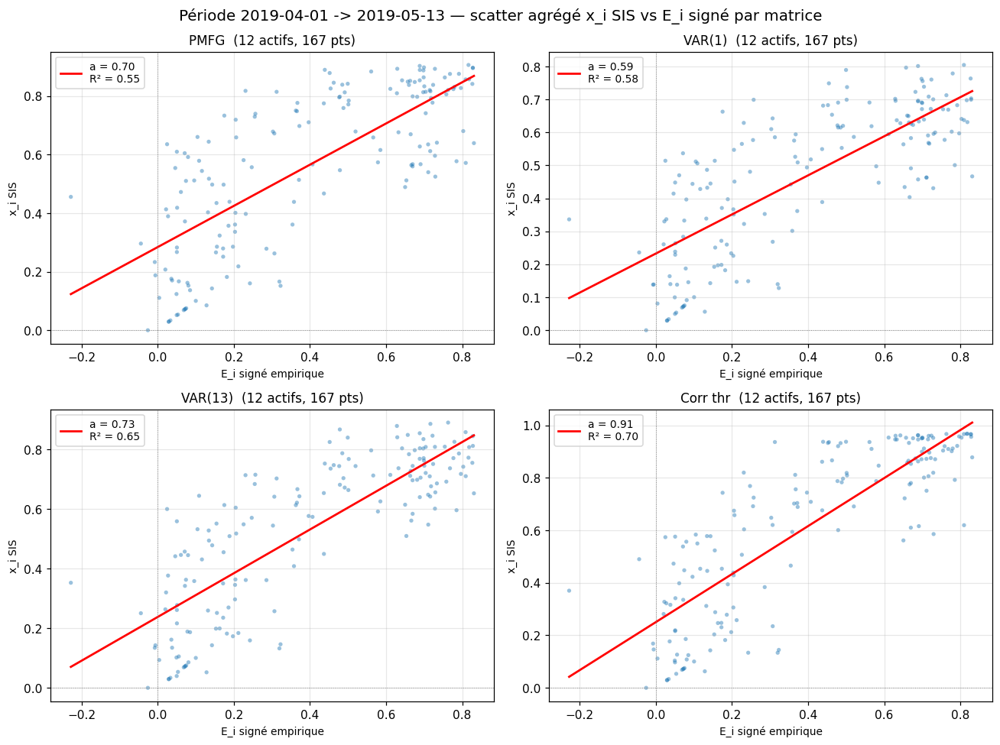

In [32]:
# ── Scatter agrégé (moyen) par matrice — période 2019-04-01 → 2019-05-13 ───
# Pour chaque matrice : on met en commun les points (E_i signé, x_i SIS) de TOUS
# les actifs retenus (R² >= R2_MIN) et on ajuste une régression globale -> la
# relation moyenne x_i vs E_i. Réutilise fits_f / passes_f / assets_f / _lab.
fig, axes = plt.subplots(2, 2, figsize=(12, 9))
axes = axes.flatten()
for ax, m in zip(axes, SIS_MODELS):
    kept = [gi for gi in assets_f if passes_f(m, gi)]
    Eall, Xall = [], []
    for gi in kept:
        E_i, x_traj = fits_f[m][0][gi]
        ok = ~np.isnan(E_i)
        Eall.append(E_i[ok]); Xall.append(x_traj[ok])
    if Eall:
        Eall = np.concatenate(Eall); Xall = np.concatenate(Xall)
        ax.scatter(Eall, Xall, s=12, color='#1f77b4', alpha=0.45, edgecolors='none')
        if len(Eall) >= 3:
            f = linregress(Eall, Xall)
            xs = np.linspace(Eall.min(), Eall.max(), 50)
            ax.plot(xs, f.slope * xs + f.intercept, color='red', linewidth=1.8,
                    label=f'a = {f.slope:.2f}\nR² = {f.rvalue ** 2:.2f}')
            ax.legend(fontsize=9, loc='best')
    ax.axhline(0, color='gray', lw=0.6, ls=':'); ax.axvline(0, color='gray', lw=0.6, ls=':')
    ax.set_title(f'{m}  ({len(kept)} actifs, {len(Eall) if len(Eall) else 0} pts)', fontsize=11)
    ax.set_xlabel('E_i signé empirique', fontsize=9)
    ax.set_ylabel('x_i SIS', fontsize=9)
    ax.grid(alpha=0.3)
plt.suptitle(f'Période {_lab} — scatter agrégé x_i SIS vs E_i signé par matrice',
             fontsize=13)
plt.tight_layout(); plt.show()